# **Statistics is All You Need: IPL Data Analysis and 2025 Winner Prediction – The Game Behind the Game!**

## **Team :Gradient Geeks**

### Members:
1. Anurag Ghosh
2. Suchana Hazra
3. Siddharth Sen
4. Uttam Mahata

### 📌 **Problem Statement**  
Perform a comprehensive analysis of IPL data (2008-2024) to extract key insights and develop a predictive model for the 2025 IPL winner.  

---

## 📂 **1. Data Collection & Preprocessing**  
- Load the datasets (`matches.csv`, `deliveries.csv`)  
- Handle missing values and data inconsistencies  
- Convert date columns to datetime format  
- Standardize team names (e.g., Delhi Daredevils → Delhi Capitals)  

---

## 📊 **2. Exploratory Data Analysis (EDA)**  
### 🏏 **Team Performance Analysis**  
- Matches Played & Winning Percentages  
- Run Rate & Economy Rate  
- Highest & Lowest Scores  
- Total 4s & 6s  
- Powerplay & Death Overs Analysis  

### 👤 **Player Performance Analysis**  
- Top 20 Run-Scorers  
- Batting Average vs Strike Rate  
- Highest Average & Strike Rate (min 50 matches)  
- Top Wicket-Takers  
- Highest Individual Scores  
- Man of the Match Count  
- K-Means Clustering: Batsman vs Bowler vs All-Rounder  

### 📅 **Seasonal Analysis**  
- Average Runs per Match per Season  
- Targets of 200+ Runs per Season  
- Team-wise Average Scores per Season  
- Orange & Purple Cap Holder Analysis  
- Top 10 Bowlers per Season  

---

## 🔍 **3. Feature Engineering & Extraction**  
- Extract match-level and player-level statistics  
- Create new features based on historical data  

---

## 🤖 **4. Winner Prediction Model (2025 IPL)**  
- Data preparation for model training  
- Train an ensemble model (Random Forest, XGBoost)  
- Experiment with Neural Networks  
- Model Validation & Performance Evaluation  
- 2025 IPL Winner Prediction  

---

## 📈 **5. Results & Discussion**  
- Key Insights from EDA  
- Strengths & Limitations of the Prediction Model  
- Future Improvements  

---

## 🛠 **6. Tools & Libraries Used**  
- Pandas, NumPy for data manipulation  
- Matplotlib, Seaborn for visualization  
- Scikit-Learn, XGBoost for model building  
- Google Colab for implementation  

---


In [1]:
# import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df_deliveries = pd.read_csv('deliveries.csv')
df_matches = pd.read_csv('matches.csv')

# 📌 PART 1: IPL Dataset Analysis -EDA

## 📜 Description of Datasets
The dataset contains details of **1095 IPL matches** played over the last **17 years**. It is divided into two files:  

- **`matches.csv`** – Contains match-level information.
- **`deliveries.csv`** – Provides ball-by-ball details of every match.

---

## 📊 Features  

### **📂 Data Field Description of `matches.csv`**
This file records high-level match details, including teams, results, and umpires.

- **`id`**: Unique identifier for each match.  
- **`city`**: City where the match was played.  
- **`date`**: Date of the match.  
- **`player_of_match`**: Player awarded "Player of the Match."  
- **`venue`**: Stadium or venue of the match.  
- **`neutral_venue`**: Binary indicator (0: Home/Away, 1: Neutral).  
- **`team1`**: First participating team.  
- **`team2`**: Second participating team.  
- **`toss_winner`**: Team that won the toss.  
- **`toss_decision`**: Decision of the toss-winning team (`field`/`bat`).  
- **`winner`**: Team that won the match.  
- **`result`**: Type of match result (`runs`, `wickets`, `tie`, etc.).  
- **`result_margin`**: Margin by which the match was won (runs/wickets).  
- **`eliminator`**: Binary (1: Eliminator match, 0: Regular match).  
- **`method`**: Method used to decide the match (`Duckworth-Lewis`, etc.).  
- **`umpire1`**: Name of the first on-field umpire.  
- **`umpire2`**: Name of the second on-field umpire.  

---

### **📂 Data Field Description of `deliveries.csv`**
This file provides ball-by-ball details of all IPL matches. It contains **14,26,312 deliveries** across different seasons.

- **`match_id`**: Unique match identifier.  
- **`inning`**: Inning number of the match.  
- **`batting_team`**: Name of the batting team.  
- **`bowling_team`**: Name of the bowling team.  
- **`over`**: Over number in the inning.  
- **`batter`**: Batsman at the striker's end.  
- **`bowler`**: Name of the bowler.  
- **`non_striker`**: Batsman at the non-striker’s end.  
- **`batsman_runs`**: Runs scored by the batsman.  
- **`extra_runs`**: Extra runs conceded.  
- **`total_runs`**: Total runs in the ball (batsman + extras).  
- **`extra_type`**: Type of extra (`wide`, `no-ball`, `bye`, etc.).  
- **`is_wicket`**: 1 if a dismissal occurred, otherwise 0.  
- **`player_dismissal`**: Name of the dismissed batsman.  
- **`dismissal_kind`**: Type of dismissal (`bowled`, `caught`, `run-out`, etc.).  
- **`fielder`**: Fielder involved in the dismissal.  

---


In [3]:
df_deliveries.head()

,match_id,inning,batting_team,bowling_team,over,ball,batter,bowler,non_striker,batsman_runs,extra_runs,total_runs,extras_type,is_wicket,player_dismissed,dismissal_kind,fielder
0,335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0.0,1.0,SC Ganguly,P Kumar,BB McCullum,0.0,1.0,1.0,legbyes,0.0,NaN,NaN,NaN
1,335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0.0,2.0,BB McCullum,P Kumar,SC Ganguly,0.0,0.0,0.0,NaN,0.0,NaN,NaN,NaN
2,335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0.0,3.0,BB McCullum,P Kumar,SC Ganguly,0.0,1.0,1.0,wides,0.0,NaN,NaN,NaN
3,335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0.0,4.0,BB McCullum,P Kumar,SC Ganguly,0.0,0.0,0.0,NaN,0.0,NaN,NaN,NaN
4,335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0.0,5.0,BB McCullum,P Kumar,SC Ganguly,0.0,0.0,0.0,NaN,0.0,NaN,NaN,NaN


In [4]:
df_matches.head()

,id,season,city,date,match_type,player_of_match,venue,team1,team2,toss_winner,toss_decision,winner,result,result_margin,target_runs,target_overs,super_over,method,umpire1,umpire2
0,335982,2007/08,Bangalore,2008-04-18,League,BB McCullum,M Chinnaswamy Stadium,Royal Challengers Bangalore,Kolkata Knight Riders,Royal Challengers Bangalore,field,Kolkata Knight Riders,runs,140.0,223.0,20.0,N,NaN,Asad Rauf,RE Koertzen
1,335983,2007/08,Chandigarh,2008-04-19,League,MEK Hussey,"Punjab Cricket Association Stadium, Mohali",Kings XI Punjab,Chennai Super Kings,Chennai Super Kings,bat,Chennai Super Kings,runs,33.0,241.0,20.0,N,NaN,MR Benson,SL Shastri
2,335984,2007/08,Delhi,2008-04-19,League,MF Maharoof,Feroz Shah Kotla,Delhi Daredevils,Rajasthan Royals,Rajasthan Royals,bat,Delhi Daredevils,wickets,9.0,130.0,20.0,N,NaN,Aleem Dar,GA Pratapkumar
3,335985,2007/08,Mumbai,2008-04-20,League,MV Boucher,Wankhede Stadium,Mumbai Indians,Royal Challengers Bangalore,Mumbai Indians,bat,Royal Challengers Bangalore,wickets,5.0,166.0,20.0,N,NaN,SJ Davis,DJ Harper
4,335986,2007/08,Kolkata,2008-04-20,League,DJ Hussey,Eden Gardens,Kolkata Knight Riders,Deccan Chargers,Deccan Chargers,bat,Kolkata Knight Riders,wickets,5.0,111.0,20.0,N,NaN,BF Bowden,K Hariharan


In [5]:
df_matches.shape

(1095, 20)

In [6]:
df_matches.shape

(1095, 20)

In [7]:
df_matches.keys()

Index(['id', 'season', 'city', 'date', 'match_type', 'player_of_match',
       'venue', 'team1', 'team2', 'toss_winner', 'toss_decision', 'winner',
       'result', 'result_margin', 'target_runs', 'target_overs', 'super_over',
       'method', 'umpire1', 'umpire2'],
      dtype='object')

In [8]:
df_deliveries.keys()

Index(['match_id', 'inning', 'batting_team', 'bowling_team', 'over', 'ball',
       'batter', 'bowler', 'non_striker', 'batsman_runs', 'extra_runs',
       'total_runs', 'extras_type', 'is_wicket', 'player_dismissed',
       'dismissal_kind', 'fielder'],
      dtype='object')

In [9]:
df_matches.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1095 entries, 0 to 1094
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               1095 non-null   int64  
 1   season           1095 non-null   object 
 2   city             1044 non-null   object 
 3   date             1095 non-null   object 
 4   match_type       1095 non-null   object 
 5   player_of_match  1090 non-null   object 
 6   venue            1095 non-null   object 
 7   team1            1095 non-null   object 
 8   team2            1095 non-null   object 
 9   toss_winner      1095 non-null   object 
 10  toss_decision    1095 non-null   object 
 11  winner           1090 non-null   object 
 12  result           1095 non-null   object 
 13  result_margin    1076 non-null   float64
 14  target_runs      1092 non-null   float64
 15  target_overs     1092 non-null   float64
 16  super_over       1095 non-null   object 
 17  method        

In [10]:
#unique values
df_matches.nunique()

,0
id,1095
season,17
city,36
date,823
match_type,8
player_of_match,291
venue,58
team1,19
team2,19
toss_winner,19


Listing unique value for each columns matches.csv take:

In [11]:
#print each unique value for each columns
for col in df_matches.columns:
    print(col, df_matches[col].unique())

id [ 335982  335983  335984 ... 1426310 1426311 1426312]
season ['2007/08' '2009' '2009/10' '2011' '2012' '2013' '2014' '2015' '2016'
 '2017' '2018' '2019' '2020/21' '2021' '2022' '2023' '2024']
city ['Bangalore' 'Chandigarh' 'Delhi' 'Mumbai' 'Kolkata' 'Jaipur' 'Hyderabad'
 'Chennai' 'Cape Town' 'Port Elizabeth' 'Durban' 'Centurion' 'East London'
 'Johannesburg' 'Kimberley' 'Bloemfontein' 'Ahmedabad' 'Cuttack' 'Nagpur'
 'Dharamsala' 'Kochi' 'Indore' 'Visakhapatnam' 'Pune' 'Raipur' 'Ranchi'
 'Abu Dhabi' nan 'Rajkot' 'Kanpur' 'Bengaluru' 'Dubai' 'Sharjah'
 'Navi Mumbai' 'Lucknow' 'Guwahati' 'Mohali']
date ['2008-04-18' '2008-04-19' '2008-04-20' '2008-04-21' '2008-04-22'
 '2008-04-23' '2008-04-24' '2008-04-25' '2008-04-26' '2008-04-27'
 '2008-04-28' '2008-04-29' '2008-04-30' '2008-05-01' '2008-05-02'
 '2008-05-03' '2008-05-04' '2008-05-05' '2008-05-06' '2008-05-07'
 '2008-05-08' '2008-05-09' '2008-05-10' '2008-05-11' '2008-05-12'
 '2008-05-13' '2008-05-14' '2008-05-15' '2008-05-16' '2008-

Checking the Missing Values:

In [12]:
df_matches.isnull().sum()

,0
id,0
season,0
city,51
date,0
match_type,0
player_of_match,5
venue,0
team1,0
team2,0
toss_winner,0


In [13]:
df_matches.describe()

,id,result_margin,target_runs,target_overs
count,1.095000e+03,1076.000000,1092.000000,1092.000000
mean,9.048283e+05,17.259294,165.684066,19.759341
std,3.677402e+05,21.787444,33.427048,1.581108
min,3.359820e+05,1.000000,43.000000,5.000000
25%,5.483315e+05,6.000000,146.000000,20.000000
50%,9.809610e+05,8.000000,166.000000,20.000000
75%,1.254062e+06,20.000000,187.000000,20.000000
max,1.426312e+06,146.000000,288.000000,20.000000


Separate categorical and numerical columns in matches.csv

In [14]:
cat_cols = [col for col in df_matches.columns if df_matches[col].dtype == 'object']
num_cols = [col for col in df_matches.columns if col not in cat_cols]

In [15]:
print(cat_cols)
print(num_cols)

['season', 'city', 'date', 'match_type', 'player_of_match', 'venue', 'team1', 'team2', 'toss_winner', 'toss_decision', 'winner', 'result', 'super_over', 'method', 'umpire1', 'umpire2']
['id', 'result_margin', 'target_runs', 'target_overs']


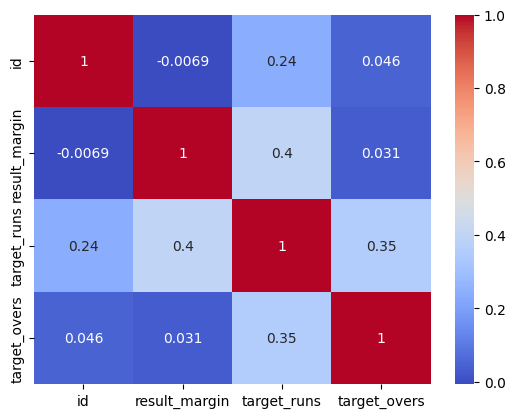

In [16]:
# correlation matrix for categorical columns
cat_corr = df_matches[num_cols].corr()
sns.heatmap(cat_corr, annot=True, cmap='coolwarm')
plt.show()

Missing Value Handling:

In [17]:
# Fill the missing values
df_matches.fillna(0, inplace=True)
df_matches.isnull().sum()

,0
id,0
season,0
city,0
date,0
match_type,0
player_of_match,0
venue,0
team1,0
team2,0
toss_winner,0


# Match Data Boxplots

Four key variables visualized:

1. Match ID (top left):
   - IDs mostly between 0.6-1.2 million
   - Median ~0.9 million
   - Even distribution

2. Result Margin (top right):
   - Right-skewed distribution
   - Most matches have small margins (<20 runs)
   - Many outliers up to ~140 runs

3. Target Runs (bottom left):
   - Centered around 150 runs
   - Range typically 130-170 runs
   - Outliers at both extremes

4. Target Overs (bottom right):
   - Sparse distribution
   - Values scattered between 2.5-20 overs
   - Suggests different match formats

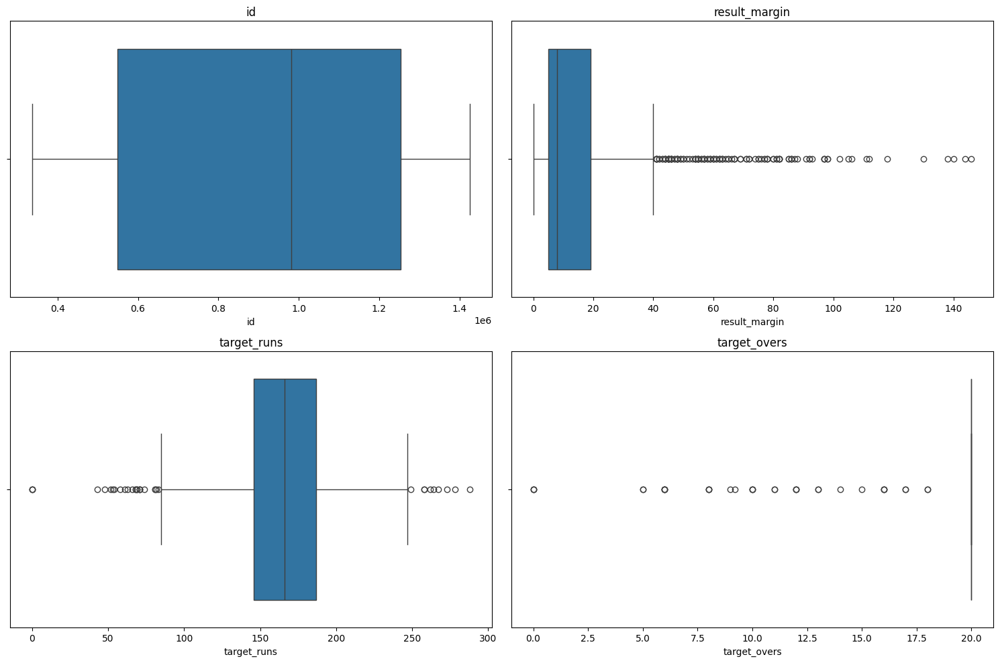

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the number of rows and columns for the grid
num_plots = len(num_cols)
num_rows = int(num_plots**0.5)  # Square root for a roughly square grid
num_cols_grid = (num_plots + num_rows - 1) // num_rows  # Adjust for remainder

# Create the grid of subplots
fig, axes = plt.subplots(num_rows, num_cols_grid, figsize=(15, 5 * num_rows))

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Iterate through the numerical columns and create box plots
for i, col in enumerate(num_cols):
    sns.boxplot(x=df_matches[col], ax=axes[i])
    axes[i].set_title(col)  # Set title for each subplot

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

### Outlier Detection and Removal:
#### Removing Outliers Using the IQR Method  

The **Interquartile Range (IQR) method** is a statistical technique used to detect and remove outliers from a dataset. It identifies values that lie beyond **1.5 times the IQR** from the **first quartile (Q1)** and **third quartile (Q3)**.

### 🔹 Steps:
1. Calculate **Q1 (25th percentile)** and **Q3 (75th percentile)**.
2. Compute **IQR = Q3 - Q1**.
3. Define **lower bound = Q1 - 1.5 × IQR** and **upper bound = Q3 + 1.5 × IQR**.
4. Remove data points that fall outside these bounds.
![IQR Method](https://miro.medium.com/v2/resize:fit:1100/format:webp/1*0MPDTLn8KoLApoFvI0P2vQ.png)
This method ensures a cleaner dataset by eliminating extreme values that could skew the analysis.


In [20]:
# remove outliers using the IQR method
import pandas as pd

def remove_outliers_iqr(df, columns):
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
    return df

# Assuming 'num_cols' contains the numerical columns want to clean
df_matches_cleaned = remove_outliers_iqr(df_matches.copy(), num_cols)

####After Removing the outliers

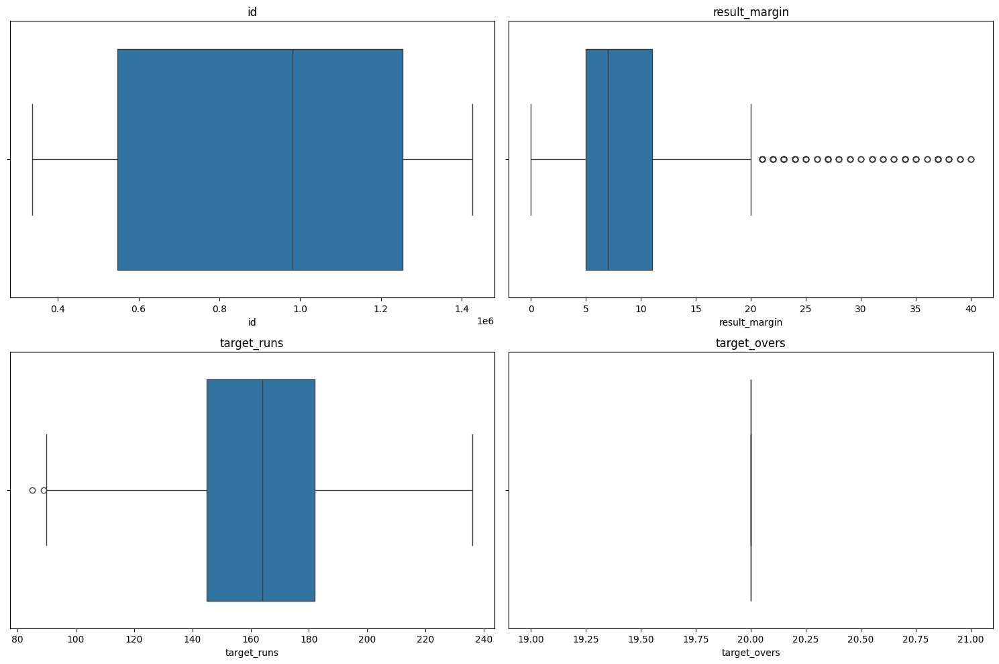

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the number of rows and columns for the grid
num_plots = len(num_cols)
num_rows = int(num_plots**0.5)  # Square root for a roughly square grid
num_cols_grid = (num_plots + num_rows - 1) // num_rows  # Adjust for remainder

# Create the grid of subplots
fig, axes = plt.subplots(num_rows, num_cols_grid, figsize=(15, 5 * num_rows))

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Iterate through the numerical columns and create box plots
for i, col in enumerate(num_cols):
    sns.boxplot(x=df_matches_cleaned[col], ax=axes[i])
    axes[i].set_title(col)  # Set title for each subplot

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

#Plot Matches Played and Winning Percentages

In [22]:
#count matches played
matches_played = df_matches_cleaned.groupby('season')['id'].count().reset_index()
matches_played.columns = ['season', 'matches_played']
print(matches_played)

     season  matches_played
0   2007/08              46
1      2009              48
2   2009/10              52
3      2011              59
4      2012              65
5      2013              61
6      2014              52
7      2015              49
8      2016              52
9      2017              50
10     2018              51
11     2019              54
12  2020/21              47
13     2021              54
14     2022              63
15     2023              59
16     2024              59


<ipython-input-23-457713660999>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="season", y="matches_played", data=df, palette=colors)


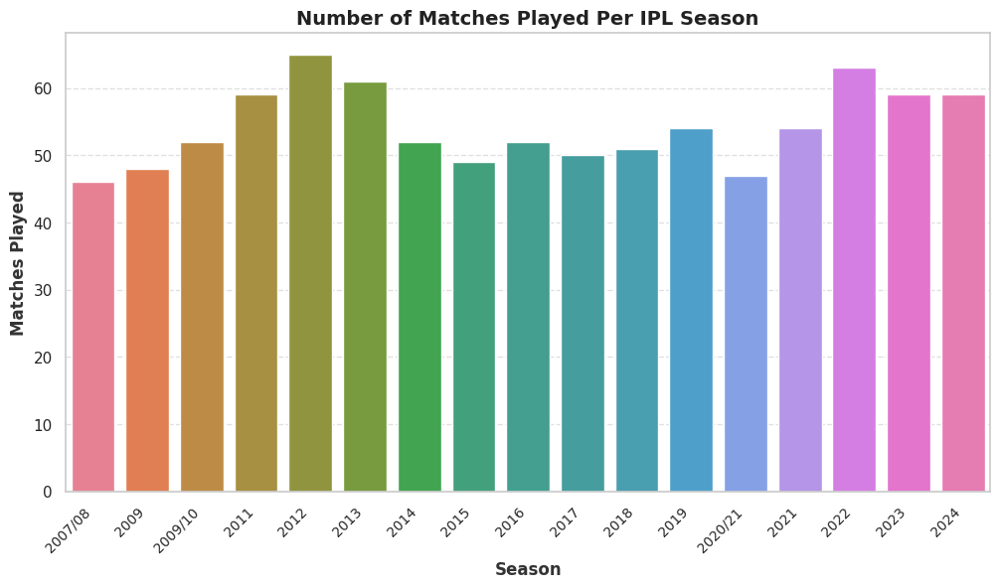

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Creating the DataFrame
data = {
    "season": ["2007/08", "2009", "2009/10", "2011", "2012", "2013", "2014", "2015", "2016",
               "2017", "2018", "2019", "2020/21", "2021", "2022", "2023", "2024"],
    "matches_played": [46, 48, 52, 59, 65, 61, 52, 49, 52, 50, 51, 54, 47, 54, 63, 59, 59]
}

df = pd.DataFrame(data)

# Set the style
sns.set_theme(style="whitegrid", palette="pastel")

# Figure size
plt.figure(figsize=(12, 6))

# Create barplot with vibrant colors
colors = sns.color_palette("husl", len(df))
sns.barplot(x="season", y="matches_played", data=df, palette=colors)

# Beautify the plot
plt.xticks(rotation=45, fontsize=10, ha='right')
plt.xlabel("Season", fontsize=12, fontweight='bold', color="#333")
plt.ylabel("Matches Played", fontsize=12, fontweight='bold', color="#333")
plt.title("Number of Matches Played Per IPL Season", fontsize=14, fontweight='bold', color="#222")
plt.grid(axis='y', linestyle="--", alpha=0.6)

# Show plot
plt.show()


## 🏏 Cricket Team Winning Percentage Analysis

This analysis tracks team performance across cricket seasons by calculating winning percentages:

1. **Group & Count** ⟶ Organize matches by season and count wins per team
2. **Structure Data** ⟶ Create a table with seasons as rows and teams as columns  
3. **Calculate Totals** ⟶ Sum matches per season across all teams
4. **Determine Success Rates** ⟶ Calculate winning percentage for the primary team

The resulting visualization reveals performance patterns and dominance trends throughout cricket seasons, helping identify consistently strong teams and potential competitive shifts over time.

In [ ]:
# calculate winning percentage for each player
matches_won = df_matches_cleaned.groupby('season')['winner'].value_counts().unstack().fillna(0)
matches_won['total_matches'] = matches_won.sum(axis=1)
matches_won['winning_percentage'] = (matches_won.iloc[:, 0] / matches_won['total_matches']) * 100
matches_won

winner,0,Chennai Super Kings,Deccan Chargers,Delhi Capitals,Delhi Daredevils,Gujarat Lions,Gujarat Titans,Kings XI Punjab,Kochi Tuskers Kerala,Kolkata Knight Riders,...,Pune Warriors,Punjab Kings,Rajasthan Royals,Rising Pune Supergiant,Rising Pune Supergiants,Royal Challengers Bangalore,Royal Challengers Bengaluru,Sunrisers Hyderabad,total_matches,winning_percentage
season,,,,,,,,,,,,,,,,,,,,,
2007/08,0.0,7.0,2.0,0.0,7.0,0.0,0.0,7.0,0.0,4.0,...,0.0,0.0,10.0,0.0,0.0,4.0,0.0,0.0,46.0,0.000000
2009,0.0,5.0,8.0,0.0,9.0,0.0,0.0,7.0,0.0,2.0,...,0.0,0.0,5.0,0.0,0.0,8.0,0.0,0.0,48.0,0.000000
2009/10,0.0,7.0,8.0,0.0,6.0,0.0,0.0,4.0,0.0,7.0,...,0.0,0.0,6.0,0.0,0.0,7.0,0.0,0.0,52.0,0.000000
2011,0.0,9.0,4.0,0.0,4.0,0.0,0.0,4.0,5.0,6.0,...,4.0,0.0,6.0,0.0,0.0,7.0,0.0,0.0,59.0,0.000000
2012,0.0,8.0,4.0,0.0,10.0,0.0,0.0,8.0,0.0,10.0,...,4.0,0.0,4.0,0.0,0.0,7.0,0.0,0.0,65.0,0.000000
2013,0.0,9.0,0.0,0.0,3.0,0.0,0.0,7.0,0.0,4.0,...,4.0,0.0,10.0,0.0,0.0,7.0,0.0,9.0,61.0,0.000000
2014,0.0,8.0,0.0,0.0,2.0,0.0,0.0,10.0,0.0,10.0,...,0.0,0.0,5.0,0.0,0.0,5.0,0.0,5.0,52.0,0.000000
2015,1.0,8.0,0.0,0.0,5.0,0.0,0.0,2.0,0.0,7.0,...,0.0,0.0,7.0,0.0,0.0,4.0,0.0,6.0,49.0,2.040816
2016,0.0,0.0,0.0,0.0,7.0,9.0,0.0,4.0,0.0,7.0,...,0.0,0.0,0.0,0.0,3.0,6.0,0.0,10.0,52.0,0.000000


## 🏆 Team Performance Analysis & Visualization

This code performs a comprehensive analysis of cricket team winning patterns:

The resulting bar chart provides a clear visual comparison of team dominance across the dataset, highlighting which teams have been most successful by percentage of total matches won. The analysis filters out matches with no declared winner to ensure data accuracy.

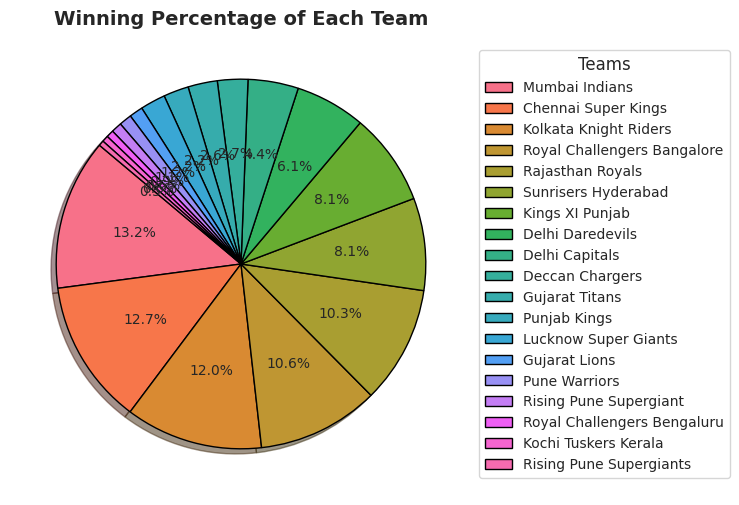

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns

# Remove rows where 'winner' is 0
df_matches = df_matches[df_matches['winner'] != 0]

# Calculate winning percentage
winning_percentage = df_matches['winner'].value_counts(normalize=True) * 100

# Define colors using Seaborn
colors = sns.color_palette("husl", len(winning_percentage))

# Create figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Plot pie chart without labels
wedges, texts, autotexts = ax.pie(
    winning_percentage.values,
    autopct='%1.1f%%',
    startangle=140,
    colors=colors,
    shadow=True,
    wedgeprops={'edgecolor': 'black'},
    textprops={'fontsize': 10}  # Reduce label font size
)

# Add legend (index) on the right side
ax.legend(
    wedges, winning_percentage.index,
    title="Teams",
    loc="center left",
    bbox_to_anchor=(1, 0.5),
    fontsize=10
)

plt.title("Winning Percentage of Each Team", fontsize=14, fontweight="bold")
plt.show()


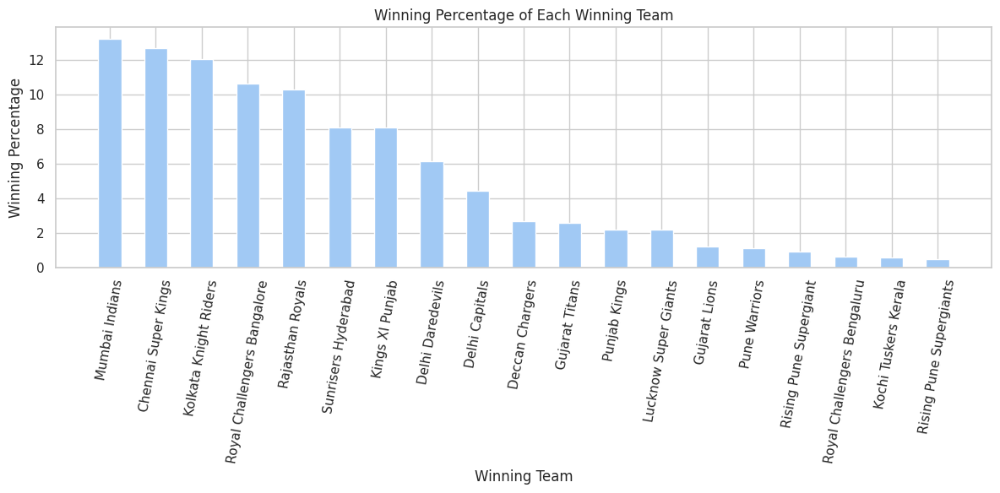

In [24]:
#plot winning percentage of each winning team
#group each winner and calculate their percentage

#remove the rows where df_matches['winner'] = 0
df_matches = df_matches[df_matches['winner'] != 0]
winning_percentage = df_matches['winner'].value_counts(normalize=True) * 100
winning_percentage



#plot the players vs winning percentage
plt.figure(figsize=(12, 6))

# Convert index to strings
winning_percentage.index = winning_percentage.index.astype(str)

# Increase gap between bars
plt.bar(winning_percentage.index, winning_percentage.values, width=0.5, align='center')

plt.xlabel('Winning Team')
plt.ylabel('Winning Percentage')
plt.title('Winning Percentage of Each Winning Team')
plt.xticks(rotation=80) # Rotate x-axis labels for better visibility if needed
plt.tight_layout() # Adjust layout for better spacing
plt.show()


In [29]:
# calculate each team played how many matches
team_matches = df_matches_cleaned['team1'].value_counts() + df_matches_cleaned['team2'].value_counts()
team_matches.size

19

In [30]:
winning_percentage


,proportion
winner,
Mumbai Indians,13.211009
Chennai Super Kings,12.660550
Kolkata Knight Riders,12.018349
Royal Challengers Bangalore,10.642202
Rajasthan Royals,10.275229
Sunrisers Hyderabad,8.073394
Kings XI Punjab,8.073394
Delhi Daredevils,6.146789
Delhi Capitals,4.403670


In [31]:
team_matches

,count
Chennai Super Kings,199
Deccan Chargers,67
Delhi Capitals,75
Delhi Daredevils,137
Gujarat Lions,29
Gujarat Titans,39
Kings XI Punjab,160
Kochi Tuskers Kerala,12
Kolkata Knight Riders,205
Lucknow Super Giants,36


In [32]:
team_matches_dict = team_matches.to_dict()
print(team_matches_dict)

{'Chennai Super Kings': 199, 'Deccan Chargers': 67, 'Delhi Capitals': 75, 'Delhi Daredevils': 137, 'Gujarat Lions': 29, 'Gujarat Titans': 39, 'Kings XI Punjab': 160, 'Kochi Tuskers Kerala': 12, 'Kolkata Knight Riders': 205, 'Lucknow Super Giants': 36, 'Mumbai Indians': 222, 'Pune Warriors': 41, 'Punjab Kings': 50, 'Rajasthan Royals': 186, 'Rising Pune Supergiant': 13, 'Rising Pune Supergiants': 11, 'Royal Challengers Bangalore': 194, 'Royal Challengers Bengaluru': 12, 'Sunrisers Hyderabad': 154}


In [33]:
winning_percentage_dict = winning_percentage.to_dict()
print(winning_percentage_dict)

{'Mumbai Indians': 13.211009174311927, 'Chennai Super Kings': 12.660550458715598, 'Kolkata Knight Riders': 12.018348623853212, 'Royal Challengers Bangalore': 10.642201834862385, 'Rajasthan Royals': 10.275229357798166, 'Sunrisers Hyderabad': 8.073394495412845, 'Kings XI Punjab': 8.073394495412845, 'Delhi Daredevils': 6.146788990825688, 'Delhi Capitals': 4.4036697247706424, 'Deccan Chargers': 2.6605504587155964, 'Gujarat Titans': 2.5688073394495414, 'Punjab Kings': 2.2018348623853212, 'Lucknow Super Giants': 2.2018348623853212, 'Gujarat Lions': 1.1926605504587156, 'Pune Warriors': 1.1009174311926606, 'Rising Pune Supergiant': 0.9174311926605505, 'Royal Challengers Bengaluru': 0.6422018348623854, 'Kochi Tuskers Kerala': 0.5504587155963303, 'Rising Pune Supergiants': 0.45871559633027525}


In [34]:
# sort winning_percentage_dic and team_matches according to keys
winning_percentage_sorted = {k: winning_percentage_dict[k] for k in sorted(winning_percentage_dict)}
team_matches_sorted = {k: team_matches_dict[k] for k in sorted(team_matches_dict)}


In [35]:
print(winning_percentage_sorted)
print(team_matches_sorted)

{'Chennai Super Kings': 12.660550458715598, 'Deccan Chargers': 2.6605504587155964, 'Delhi Capitals': 4.4036697247706424, 'Delhi Daredevils': 6.146788990825688, 'Gujarat Lions': 1.1926605504587156, 'Gujarat Titans': 2.5688073394495414, 'Kings XI Punjab': 8.073394495412845, 'Kochi Tuskers Kerala': 0.5504587155963303, 'Kolkata Knight Riders': 12.018348623853212, 'Lucknow Super Giants': 2.2018348623853212, 'Mumbai Indians': 13.211009174311927, 'Pune Warriors': 1.1009174311926606, 'Punjab Kings': 2.2018348623853212, 'Rajasthan Royals': 10.275229357798166, 'Rising Pune Supergiant': 0.9174311926605505, 'Rising Pune Supergiants': 0.45871559633027525, 'Royal Challengers Bangalore': 10.642201834862385, 'Royal Challengers Bengaluru': 0.6422018348623854, 'Sunrisers Hyderabad': 8.073394495412845}
{'Chennai Super Kings': 199, 'Deccan Chargers': 67, 'Delhi Capitals': 75, 'Delhi Daredevils': 137, 'Gujarat Lions': 29, 'Gujarat Titans': 39, 'Kings XI Punjab': 160, 'Kochi Tuskers Kerala': 12, 'Kolkata Kn

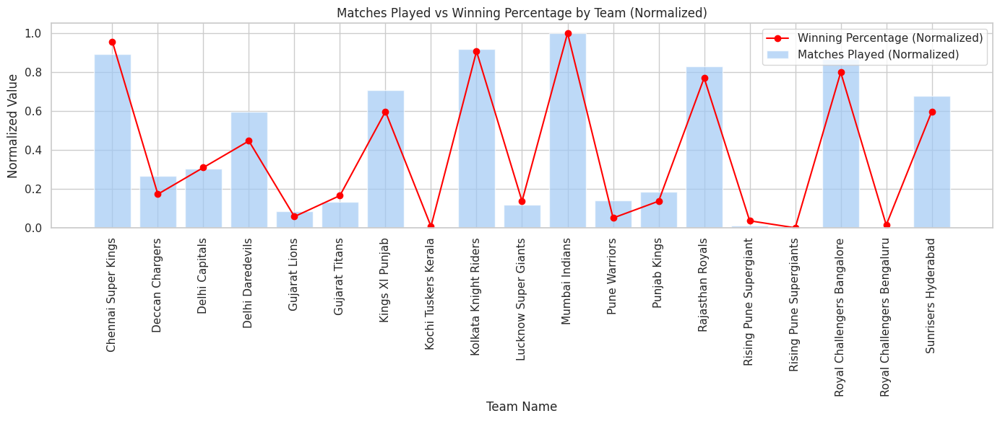

In [36]:
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Get the team names (keys)
team_names = list(team_matches_sorted.keys())

# Get the values for plotting
team_matches_values = list(team_matches_sorted.values())
winning_percentage_values = list(winning_percentage_sorted.values())

# Normalize the values using MinMaxScaler
scaler = MinMaxScaler()
team_matches_values_normalized = scaler.fit_transform(np.array(team_matches_values).reshape(-1, 1)).flatten()
winning_percentage_values_normalized = scaler.fit_transform(np.array(winning_percentage_values).reshape(-1, 1)).flatten()

# Plotting
plt.figure(figsize=(14, 6))  # Increase figure size

# Plot 'matches_played' with bars
plt.bar(team_names, team_matches_values_normalized, label='Matches Played (Normalized)', alpha=0.7)

# Plot 'winning_percentage' with a line and markers
plt.plot(team_names, winning_percentage_values_normalized, marker='o', color='red', label='Winning Percentage (Normalized)')

plt.xlabel('Team Name')
plt.ylabel('Normalized Value')
plt.title('Matches Played vs Winning Percentage by Team (Normalized)')
plt.xticks(rotation=90)  # Rotate x-axis labels for readability
plt.legend()
plt.tight_layout()
plt.show()

### **Plot Run Rate and Economy Rate**

In [43]:
df_matches_cleaned.keys()

Index(['id', 'season', 'city', 'date', 'match_type', 'player_of_match',
       'venue', 'team1', 'team2', 'toss_winner', 'toss_decision', 'winner',
       'result', 'result_margin', 'target_runs', 'target_overs', 'super_over',
       'method', 'umpire1', 'umpire2'],
      dtype='object')

In [44]:
# Group by 'winner' and sum up total runs and total overs
team_runs = df_matches_cleaned.groupby('winner')['target_runs'].sum()
team_overs = df_matches_cleaned.groupby('winner')['target_overs'].sum()

# Calculate Run Rate
run_rate = team_runs / team_overs

# Display the result
print(run_rate)


winner
Chennai Super Kings            8.172477
Deccan Chargers                7.886538
Delhi Capitals                 8.393023
Delhi Daredevils               8.035000
Gujarat Lions                  8.315385
Gujarat Titans                 8.508333
Kings XI Punjab                8.153333
Kochi Tuskers Kerala           7.120000
Kolkata Knight Riders          7.967290
Lucknow Super Giants           9.007143
Mumbai Indians                 8.212083
Pune Warriors                  7.562500
Punjab Kings                   8.702500
Rajasthan Royals               8.262371
Rising Pune Supergiant         8.218750
Rising Pune Supergiants        7.633333
Royal Challengers Bangalore    8.191237
Royal Challengers Bengaluru    9.520000
Sunrisers Hyderabad            8.017333
dtype: float64


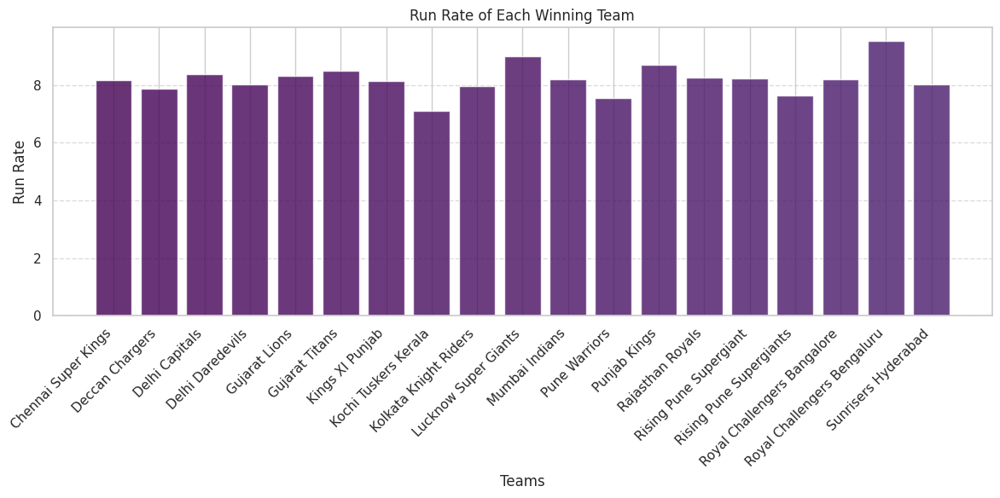

In [55]:
import matplotlib.pyplot as plt

# Group by 'winner' and sum up total runs and total overs
team_runs = df_matches_cleaned.groupby('winner')['target_runs'].sum()
team_overs = df_matches_cleaned.groupby('winner')['target_overs'].sum()

# Calculate Run Rate
run_rate = team_runs / team_overs

# Plot
plt.figure(figsize=(12, 6))
colors = plt.cm.viridis(range(len(run_rate)))  # Generate colors

bars = plt.bar(run_rate.index, run_rate.values, color=colors, alpha=0.8)

plt.xlabel('Teams')
plt.ylabel('Run Rate')
plt.title('Run Rate of Each Winning Team')

# Rotate x-axis labels
plt.xticks(rotation=45, ha='right')

# Add grid for readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


In [51]:
# Remove rows where the winner is 0 (invalid entries)
df_matches_cleaned = df_matches_cleaned[df_matches_cleaned['winner'] != 0]

# Compute total target runs for each winning team
target_run = df_matches_cleaned.groupby('winner')['target_runs'].sum()

# Display the result
target_run


,target_runs
winner,
Chennai Super Kings,17816.0
Deccan Chargers,4101.0
Delhi Capitals,7218.0
Delhi Daredevils,9642.0
Gujarat Lions,2162.0
Gujarat Titans,4084.0
Kings XI Punjab,12230.0
Kochi Tuskers Kerala,712.0
Kolkata Knight Riders,17050.0


In [52]:
# create dict from target_runs
target_run_dict = target_run.to_dict()
print(target_run_dict)

{'Chennai Super Kings': 17816.0, 'Deccan Chargers': 4101.0, 'Delhi Capitals': 7218.0, 'Delhi Daredevils': 9642.0, 'Gujarat Lions': 2162.0, 'Gujarat Titans': 4084.0, 'Kings XI Punjab': 12230.0, 'Kochi Tuskers Kerala': 712.0, 'Kolkata Knight Riders': 17050.0, 'Lucknow Super Giants': 3783.0, 'Mumbai Indians': 19709.0, 'Pune Warriors': 1815.0, 'Punjab Kings': 3481.0, 'Rajasthan Royals': 16029.0, 'Rising Pune Supergiant': 1315.0, 'Rising Pune Supergiants': 458.0, 'Royal Challengers Bangalore': 15891.0, 'Royal Challengers Bengaluru': 952.0, 'Sunrisers Hyderabad': 12026.0}


<function matplotlib.pyplot.show(close=None, block=None)>

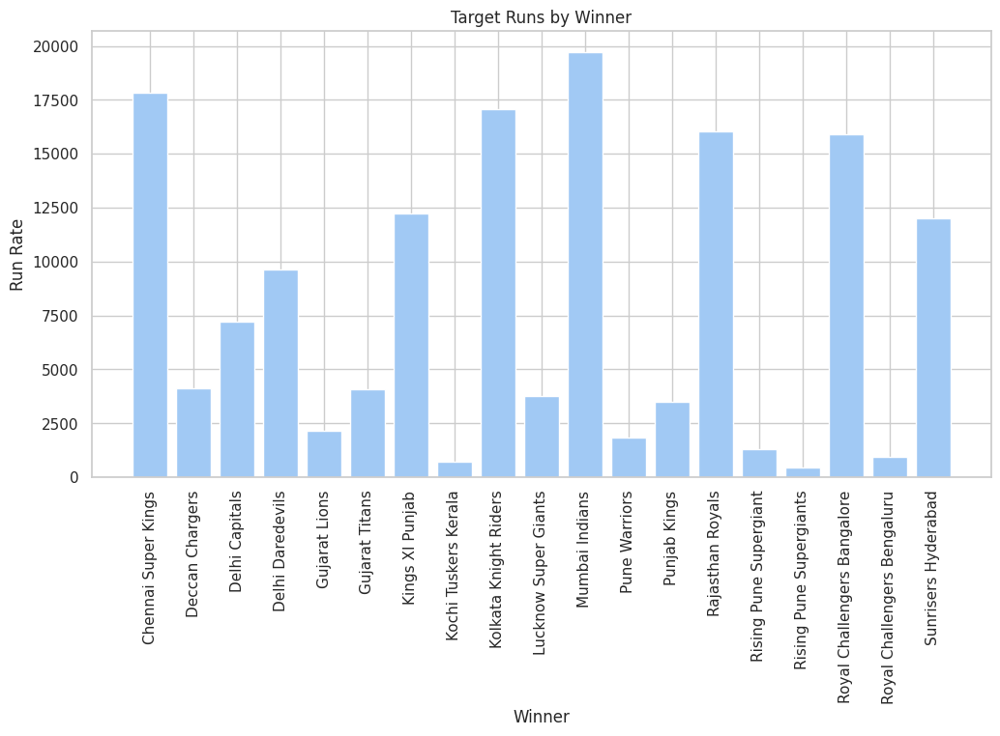

In [53]:
# plot target_run
plt.figure(figsize=(12, 6))
plt.bar(target_run_dict.keys(), target_run_dict.values())
plt.xlabel('Winner')
plt.ylabel('Run Rate')
plt.title('Target Runs by Winner')
plt.xticks(rotation=90)
plt.show

In [82]:
# calculate Economy rate
df_deliveries = pd.read_csv('deliveries.csv')


In [83]:
# calculate average of total_runs given by a bowler in one over
df_deliveries_economy = df_deliveries.groupby(['bowler', 'over'])['total_runs'].sum().reset_index()
df_deliveries_economy

# do the average based on bowler
df_deliveries_economy = df_deliveries_economy.groupby('bowler')['total_runs'].mean().reset_index()
df_deliveries_economy

,bowler,total_runs
0,A Ashish Reddy,26.666667
1,A Badoni,9.250000
2,A Chandila,27.222222
3,A Choudhary,12.000000
4,A Dananjaya,11.750000
...,...,...
525,Yash Dayal,49.105263
526,Yash Thakur,39.000000
527,Yudhvir Singh,13.888889
528,Yuvraj Singh,83.923077


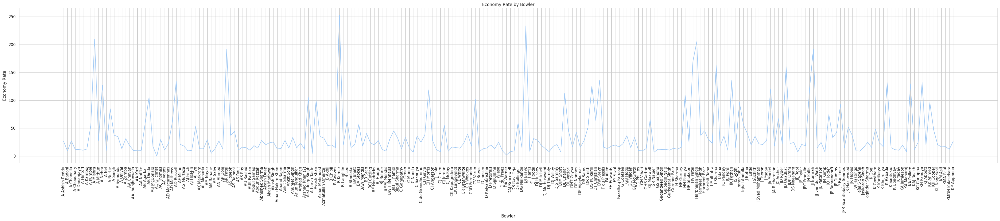

In [84]:
# plot df_deliveries_economy
plt.figure(figsize=(50, 8))

# Assuming you want to skip the last 5 points
num_points_to_skip = 300
plt.plot(df_deliveries_economy['bowler'][:-num_points_to_skip],
         df_deliveries_economy['total_runs'][:-num_points_to_skip])

plt.xlabel('Bowler')
plt.ylabel('Economy Rate')
plt.title('Economy Rate by Bowler')
plt.xticks(rotation=90)
plt.show()


In [56]:
# calculate Economy rate
df_deliveries_cleaned=df_deliveries

In [57]:
# calculate average of total_runs given by a bowler in one over
df_deliveries_economy = df_deliveries_cleaned.groupby(['bowler', 'over'])['total_runs'].sum().reset_index()
df_deliveries_economy

# do the average based on bowler
df_deliveries_economy = df_deliveries_economy.groupby('bowler')['total_runs'].mean().reset_index()
df_deliveries_economy

,bowler,total_runs
0,A Flintoff,10.600000
1,A Kumble,39.789474
2,A Mishra,34.058824
3,A Mithun,10.500000
4,A Nehra,39.500000
...,...,...
159,Y Venugopal Rao,20.000000
160,YA Abdulla,18.294118
161,YK Pathan,29.277778
162,Yuvraj Singh,23.083333


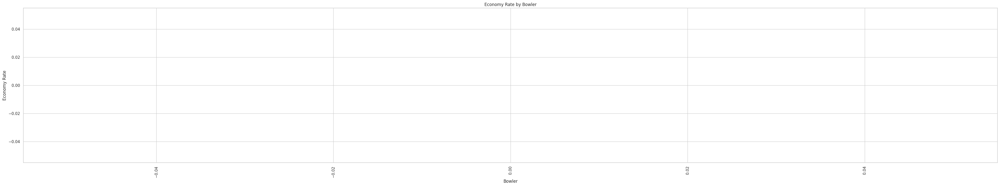

In [58]:
# plot df_deliveries_economy
plt.figure(figsize=(50, 8))

# Assuming you want to skip the last 5 points
num_points_to_skip = 300
plt.plot(df_deliveries_economy['bowler'][:-num_points_to_skip],
         df_deliveries_economy['total_runs'][:-num_points_to_skip])

plt.xlabel('Bowler')
plt.ylabel('Economy Rate')
plt.title('Economy Rate by Bowler')
plt.xticks(rotation=90)
plt.show()


In [59]:
df_matches = pd.read_csv('matches.csv')
df_matches['target_runs']

,target_runs
0,223.0
1,241.0
2,130.0
3,166.0
4,111.0
...,...
1090,215.0
1091,160.0
1092,173.0
1093,176.0


# **Plot Highest and Lowest Scores**

In [61]:
df_matches.keys()

Index(['id', 'season', 'city', 'date', 'match_type', 'player_of_match',
       'venue', 'team1', 'team2', 'toss_winner', 'toss_decision', 'winner',
       'result', 'result_margin', 'target_runs', 'target_overs', 'super_over',
       'method', 'umpire1', 'umpire2'],
      dtype='object')

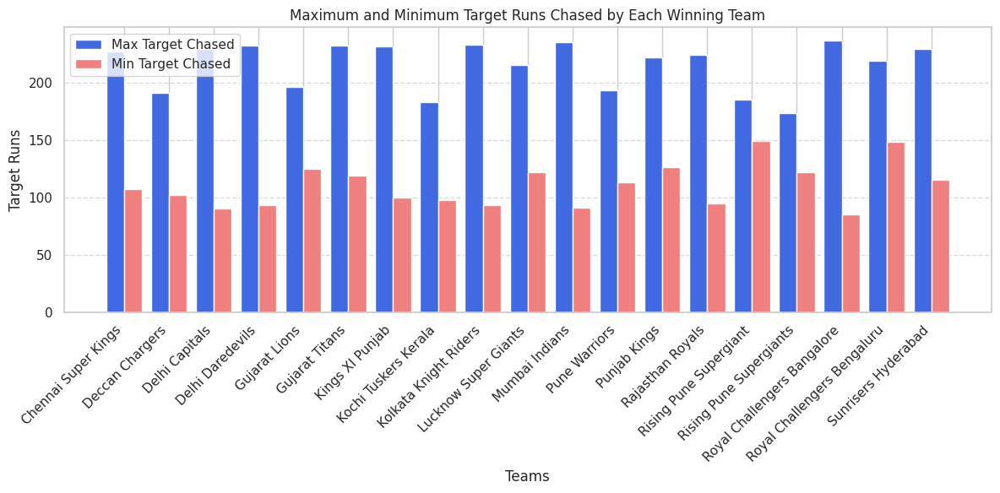

In [62]:
import matplotlib.pyplot as plt
import numpy as np

# Remove rows where 'winner' is 0
df_matches_cleaned = df_matches_cleaned[df_matches_cleaned['winner'] != 0]

# Group by 'winner' and find max and min target runs chased
max_target = df_matches_cleaned.groupby('winner')['target_runs'].max()
min_target = df_matches_cleaned.groupby('winner')['target_runs'].min()

# Plot
teams = max_target.index  # Get team names
x = np.arange(len(teams))  # X-axis positions

plt.figure(figsize=(12, 6))

# Bar width
bar_width = 0.4

# Plot max target
plt.bar(x - bar_width/2, max_target, width=bar_width, label='Max Target Chased', color='royalblue')

# Plot min target
plt.bar(x + bar_width/2, min_target, width=bar_width, label='Min Target Chased', color='lightcoral')

# X-axis labels (team names) rotated
plt.xticks(x, teams, rotation=45, ha='right')

# Labels and title
plt.xlabel('Teams')
plt.ylabel('Target Runs')
plt.title('Maximum and Minimum Target Runs Chased by Each Winning Team')

# Grid and legend
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()

plt.tight_layout()
plt.show()


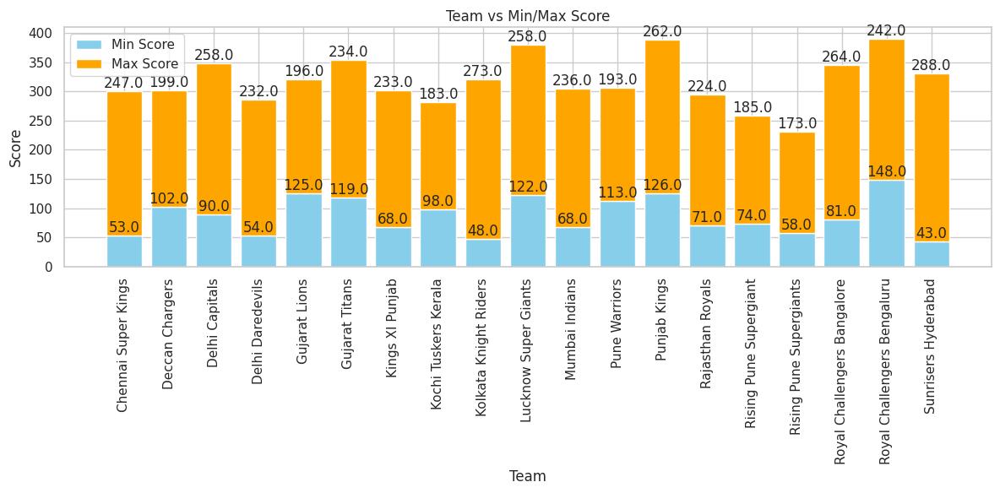

In [63]:
import matplotlib.pyplot as plt
import pandas as pd

# Group by 'winner' and get min/max target_runs
team_stats = df_matches.groupby('winner')['target_runs'].agg(['min', 'max'])

# Reset index to access 'winner' as a column
team_stats = team_stats.reset_index()

# Plotting
plt.figure(figsize=(12, 6))
plt.bar(team_stats['winner'], team_stats['min'], color='skyblue', label='Min Score')
plt.bar(team_stats['winner'], team_stats['max'], color='orange', bottom=team_stats['min'], label='Max Score')

# Annotations (optional)
for i, row in team_stats.iterrows():
    plt.text(i, row['min'], str(row['min']), ha='center', va='bottom')
    plt.text(i, row['max'] + row['min'], str(row['max']), ha='center', va='bottom')

# Customize the plot
plt.xlabel('Team')
plt.ylabel('Score')
plt.title('Team vs Min/Max Score')
plt.xticks(rotation=90)
plt.legend()
plt.tight_layout()
plt.show()

# **Plot Total 4s and 6s**

In [64]:
df_deliveries.columns

Index(['match_id', 'inning', 'batting_team', 'bowling_team', 'over', 'ball',
       'batter', 'bowler', 'non_striker', 'batsman_runs', 'extra_runs',
       'total_runs', 'extras_type', 'is_wicket', 'player_dismissed',
       'dismissal_kind', 'fielder'],
      dtype='object')

In [65]:
# find out unique values for batsman_runsdf
df_deliveries['batsman_runs'].unique()

array([ 0.,  4.,  6.,  1.,  2.,  5.,  3., nan])

In [66]:
# Group by 'batting_team' and get value counts of 'batsman_runs'
batting_team_runs = df_deliveries.groupby('batting_team')['batsman_runs'].value_counts()

# Display the result
print(batting_team_runs)

batting_team                 batsman_runs
Chennai Super Kings          0.0             1617
                             1.0             1421
                             4.0              476
                             2.0              239
                             6.0              184
                             3.0               13
Deccan Chargers              0.0             1683
                             1.0             1402
                             4.0              426
                             2.0              256
                             6.0              214
                             3.0               13
                             5.0                2
Delhi Daredevils             0.0             1444
                             1.0             1389
                             4.0              469
                             2.0              281
                             6.0              118
                             3.0               14
Kings XI

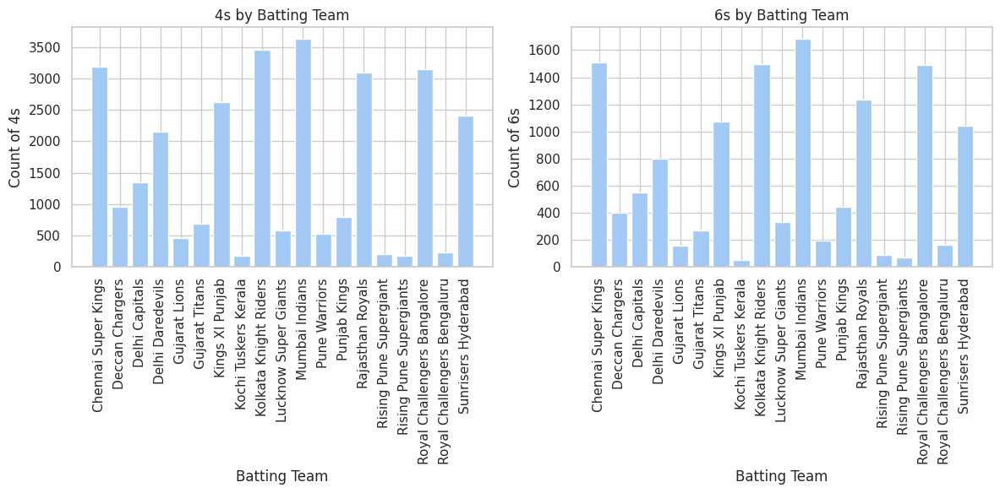

In [85]:
# Filter for 4s and 6s separately
fours = df_deliveries[df_deliveries['batsman_runs'] == 4]
sixes = df_deliveries[df_deliveries['batsman_runs'] == 6]

# Group by 'batting_team' and count occurrences
fours_by_team = fours.groupby('batting_team')['batsman_runs'].count()
sixes_by_team = sixes.groupby('batting_team')['batsman_runs'].count()

# Plotting
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)  # Subplot for 4s
plt.bar(fours_by_team.index, fours_by_team.values)
plt.xlabel('Batting Team')
plt.ylabel('Count of 4s')
plt.title('4s by Batting Team')
plt.xticks(rotation=90)

plt.subplot(1, 2, 2)  # Subplot for 6s
plt.bar(sixes_by_team.index, sixes_by_team.values)
plt.xlabel('Batting Team')
plt.ylabel('Count of 6s')
plt.title('6s by Batting Team')
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

# **Plot Average Powerplay and Death Overs Score**

In [68]:
df_deliveries['match_id'].value_counts()

,count
match_id,
392190,267
335989,255
392218,255
419110,254
419107,254
...,...
336025,175
336021,136
336022,123


In [73]:
df_deliveries = pd.read_csv('deliveries.csv')
#group by match_id
df_deliveries_cleaned = df_deliveries.groupby('match_id')
print('no_of_matches: ',df_deliveries_cleaned.size())

#group by batting_team and over
df_deliveries_cleaned = df_deliveries.groupby(['batting_team', 'over'])['total_runs'].sum().reset_index()
df_deliveries_cleaned

no_of_matches:  match_id
335982     225
335983     248
335984     219
335985     246
335986     240
          ... 
1426307    247
1426309    208
1426310    241
1426311    251
1426312    184
Length: 1095, dtype: int64


,batting_team,over,total_runs
0,Chennai Super Kings,0,1252
1,Chennai Super Kings,1,1608
2,Chennai Super Kings,2,1838
3,Chennai Super Kings,3,2010
4,Chennai Super Kings,4,2093
...,...,...,...
375,Sunrisers Hyderabad,15,1435
376,Sunrisers Hyderabad,16,1480
377,Sunrisers Hyderabad,17,1589
378,Sunrisers Hyderabad,18,1710


In [74]:
# calculate average total_runs where over=[17,18,19,20] for each team and plot
df_deliveries_cleaned = df_deliveries_cleaned[df_deliveries_cleaned['over'].isin([0,1,2,3,4,5])]
df_deliveries_cleaned

,batting_team,over,total_runs
0,Chennai Super Kings,0,1252
1,Chennai Super Kings,1,1608
2,Chennai Super Kings,2,1838
3,Chennai Super Kings,3,2010
4,Chennai Super Kings,4,2093
...,...,...,...
361,Sunrisers Hyderabad,1,1468
362,Sunrisers Hyderabad,2,1570
363,Sunrisers Hyderabad,3,1489
364,Sunrisers Hyderabad,4,1644


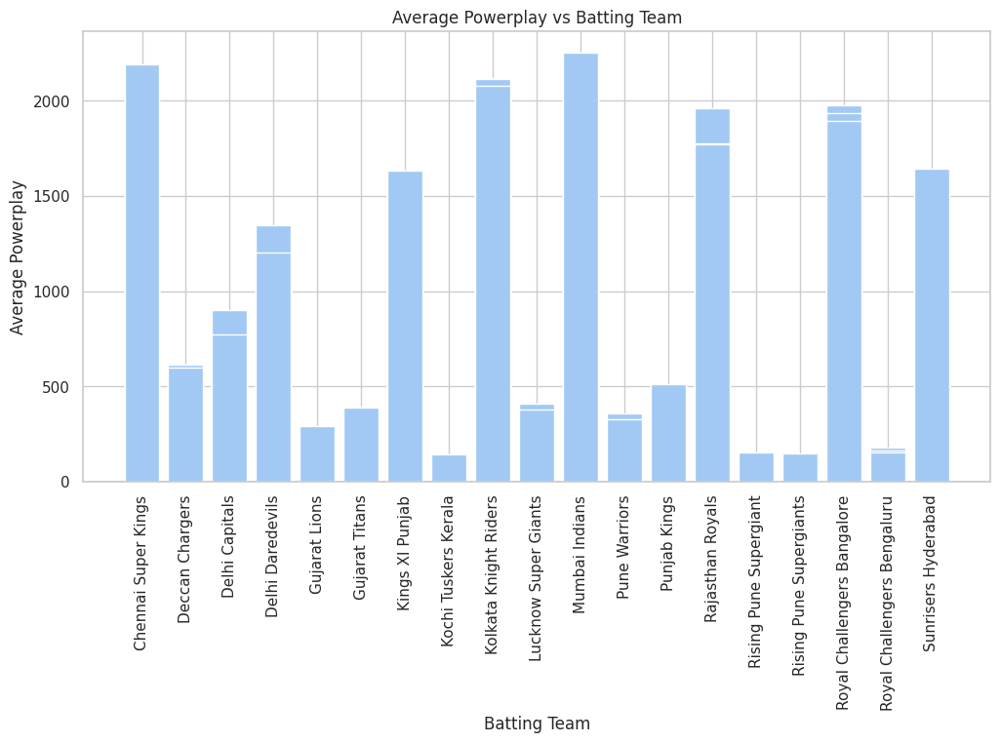

In [75]:
# now plot batting_team vs total_runs
plt.figure(figsize=(12, 6))
plt.bar(df_deliveries_cleaned['batting_team'], df_deliveries_cleaned['total_runs'])
plt.xlabel('Batting Team')
plt.ylabel('Average Powerplay')
plt.title('Average Powerplay vs Batting Team')
plt.xticks(rotation=90)
plt.show()

Calculate powerplay

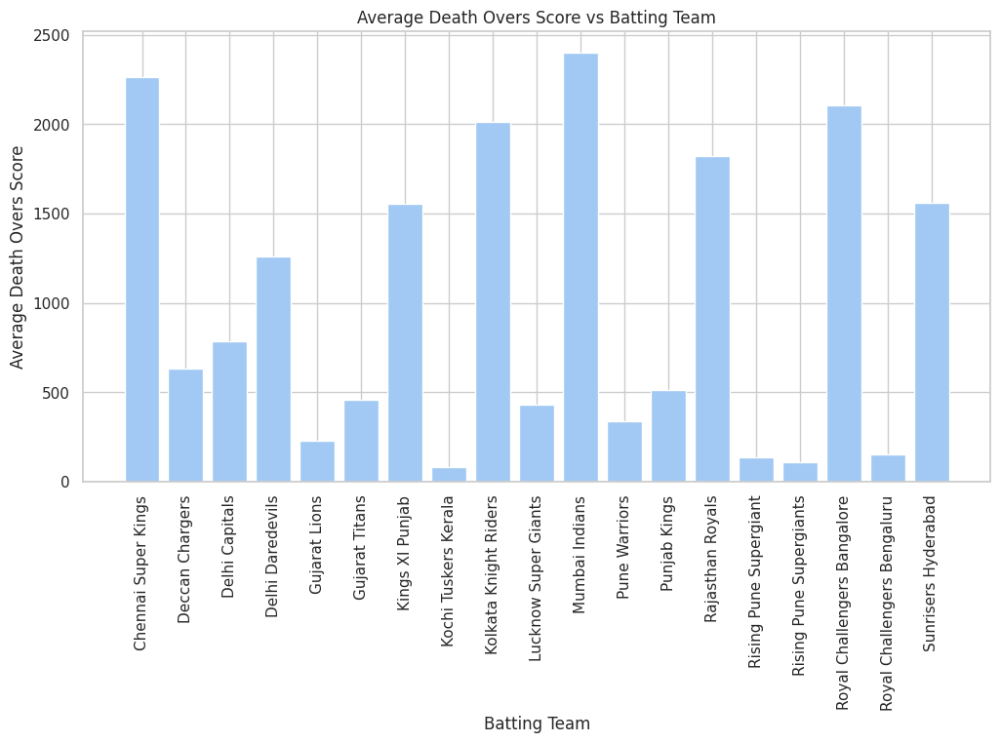

In [78]:
df_deliveries = pd.read_csv('deliveries.csv')
#group by match_id
df_deliveries_cleaned = df_deliveries.groupby('match_id')
#print('no_of_matches: ',df_deliveries_cleaned.size())

#group by batting_team and over
df_deliveries_cleaned = df_deliveries.groupby(['batting_team', 'over'])['total_runs'].sum().reset_index()
#df_deliveries_cleaned


df_deliveries_cleaned = df_deliveries_cleaned[df_deliveries_cleaned['over'].isin([16,17,18,19])]

df_deliveries_cleaned = df_deliveries_cleaned.groupby('batting_team')['total_runs'].mean().reset_index()


plt.figure(figsize=(12, 6))
plt.bar(df_deliveries_cleaned['batting_team'], df_deliveries_cleaned['total_runs'])
plt.xlabel('Batting Team')
plt.ylabel('Average Death Overs Score')
plt.title('Average Death Overs Score vs Batting Team')
plt.xticks(rotation=90)
plt.show()

In [79]:
# Average run per over of each team
df_deliveries = pd.read_csv('deliveries.csv')
df_deliveries_cleaned = df_deliveries.groupby(['batting_team', 'over'])['total_runs'].sum().reset_index()

In [80]:
df_deliveries_cleaned['average_runs'] = df_deliveries_cleaned['total_runs'] / 20
print(df_deliveries_cleaned)

            batting_team  over  total_runs  average_runs
0    Chennai Super Kings     0        1252         62.60
1    Chennai Super Kings     1        1608         80.40
2    Chennai Super Kings     2        1838         91.90
3    Chennai Super Kings     3        2010        100.50
4    Chennai Super Kings     4        2093        104.65
..                   ...   ...         ...           ...
375  Sunrisers Hyderabad    15        1435         71.75
376  Sunrisers Hyderabad    16        1480         74.00
377  Sunrisers Hyderabad    17        1589         79.45
378  Sunrisers Hyderabad    18        1710         85.50
379  Sunrisers Hyderabad    19        1458         72.90

[380 rows x 4 columns]


# **👤 Player Performance:**

Get the top 20 run-scorers

In [86]:
#match_id, batter, total_runs
#groupby match_id, batter and sum total_runs
df_deliveries = pd.read_csv('deliveries.csv')
df_deliveries_cleaned = df_deliveries.groupby(['match_id', 'batter'])['total_runs'].sum().reset_index()
df_deliveries_cleaned

,match_id,batter,total_runs
0,335982,AA Noffke,11
1,335982,B Akhil,0
2,335982,BB McCullum,169
3,335982,CL White,6
4,335982,DJ Hussey,12
...,...,...,...
16510,1426312,SP Narine,6
16511,1426312,SS Iyer,6
16512,1426312,Shahbaz Ahmed,8
16513,1426312,TM Head,0


In [87]:
# sort df_deliveries_cleaned according to total_runs
df_deliveries_cleaned = df_deliveries_cleaned.sort_values(by='total_runs', ascending=False)
df_deliveries_cleaned

,match_id,batter,total_runs
5302,598027,CH Gayle,181
2,335982,BB McCullum,169
14108,1304112,Q de Kock,141
11583,1216510,KL Rahul,140
7528,829795,AB de Villiers,138
...,...,...,...
1801,419108,TM Dilshan,0
1788,419108,DPMD Jayawardene,0
16430,1426306,RD Gaikwad,0
1718,392237,PJ Sangwan,0


In [88]:
# find out top 20 run-scorers from df_deliveries_cleaned
df_deliveries_top20 = df_deliveries_cleaned[:20]
df_deliveries_top20


,match_id,batter,total_runs
5302,598027,CH Gayle,181
2,335982,BB McCullum,169
14108,1304112,Q de Kock,141
11583,1216510,KL Rahul,140
7528,829795,AB de Villiers,138
14915,1359516,YBK Jaiswal,134
15383,1370352,Shubman Gill,133
8359,980987,AB de Villiers,132
12571,1254085,JC Buttler,131
3571,501260,AC Gilchrist,130


Plot top wicket-takers

In [89]:
df_deliveries = pd.read_csv('deliveries.csv')
df_deliveries_cleaned = df_deliveries.groupby(['bowling_team', 'bowler'])['is_wicket'].sum().reset_index()
df_deliveries_cleaned.sort_values(by='is_wicket', ascending=False)

,bowling_team,bowler,is_wicket
456,Kolkata Knight Riders,SP Narine,200
595,Mumbai Indians,SL Malinga,188
542,Mumbai Indians,JJ Bumrah,182
940,Sunrisers Hyderabad,B Kumar,170
14,Chennai Super Kings,DJ Bravo,158
...,...,...,...
962,Sunrisers Hyderabad,KS Williamson,0
77,Chennai Super Kings,V Shankar,0
998,Sunrisers Hyderabad,Y Venugopal Rao,0
103,Deccan Chargers,LPC Silva,0


In [90]:
# Find the index of the bowler with the highest wickets for each team
idx = df_deliveries_cleaned.groupby('bowling_team')['is_wicket'].idxmax()

# Use these indices to get the corresponding bowlers
top_bowlers = df_deliveries_cleaned.loc[idx].reset_index(drop=True)

print(top_bowlers)


                   bowling_team          bowler  is_wicket
0           Chennai Super Kings        DJ Bravo        158
1               Deccan Chargers         PP Ojha         66
2                Delhi Capitals        K Rabada         77
3              Delhi Daredevils        A Mishra         91
4                 Gujarat Lions     DS Kulkarni         23
5                Gujarat Titans     Rashid Khan         58
6               Kings XI Punjab       PP Chawla         89
7          Kochi Tuskers Kerala   R Vinay Kumar         17
8         Kolkata Knight Riders       SP Narine        200
9          Lucknow Super Giants    Ravi Bishnoi         41
10               Mumbai Indians      SL Malinga        188
11                Pune Warriors        R Sharma         35
12                 Punjab Kings  Arshdeep Singh         70
13             Rajasthan Royals      SK Trivedi         73
14       Rising Pune Supergiant      JD Unadkat         27
15      Rising Pune Supergiants        AB Dinda         

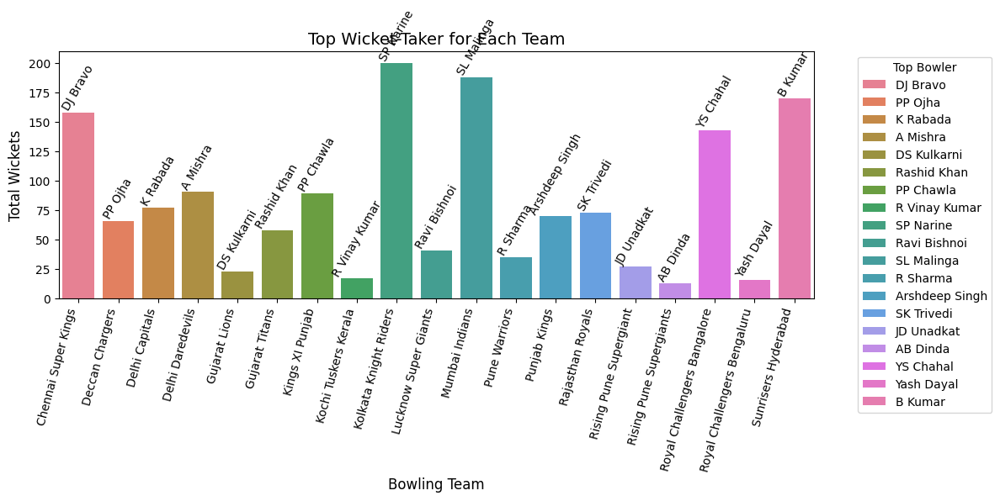

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set figure size
plt.figure(figsize=(12, 6))

# Create bar plot
ax = sns.barplot(data=top_bowlers, x='bowling_team', y='is_wicket', hue='bowler', dodge=False)

# Annotate each bar with the bowler's name
for index, row in top_bowlers.iterrows():
    plt.text(index, row.is_wicket + 2, row.bowler,
             ha='center', fontsize=10, color='black', rotation=60)

# Improve readability
plt.xlabel("Bowling Team", fontsize=12)
plt.ylabel("Total Wickets", fontsize=12)
plt.title("Top Wicket-Taker for Each Team", fontsize=14)
plt.xticks(rotation=75, ha='right')  # Rotate & align labels

# Adjust legend placement
plt.legend(title="Top Bowler", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

# Show the plot
plt.tight_layout()  # Prevent labels from being cut off
plt.show();


Plot top highest individual scores

<ipython-input-91-36c6c987af57>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='batsman_runs', y='batter', data=top_scores, palette='viridis')


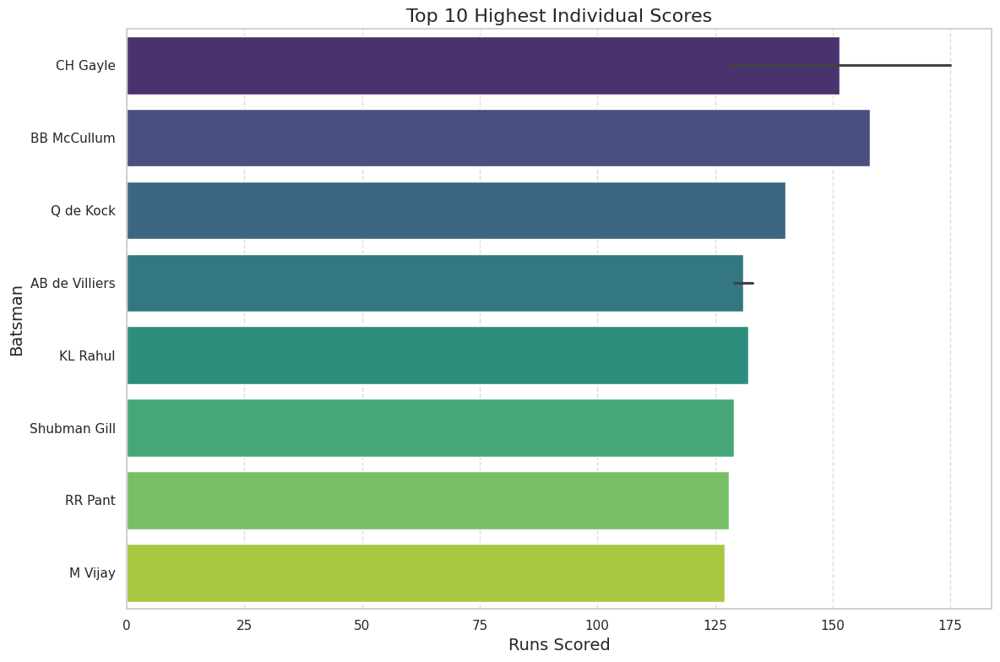

In [91]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_highest_individual_scores(df_deliveries, top_n=10):
    # Group by match_id and batter to get individual scores per match
    batsman_scores = df_deliveries.groupby(['match_id', 'batter'])['batsman_runs'].sum().reset_index()

    # Sort by runs in descending order and get top N
    top_scores = batsman_scores.sort_values('batsman_runs', ascending=False).head(top_n)

    plt.figure(figsize=(12, 8))
    sns.barplot(x='batsman_runs', y='batter', data=top_scores, palette='viridis')
    plt.title(f'Top {top_n} Highest Individual Scores', fontsize=16)
    plt.xlabel('Runs Scored', fontsize=14)
    plt.ylabel('Batsman', fontsize=14)
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    return top_scores


top_scores = plot_highest_individual_scores(df_deliveries)

Man of the Match Count Analysis

<ipython-input-92-cc170482ae94>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='MoM Count', y='Player', data=top_mom, palette='magma')


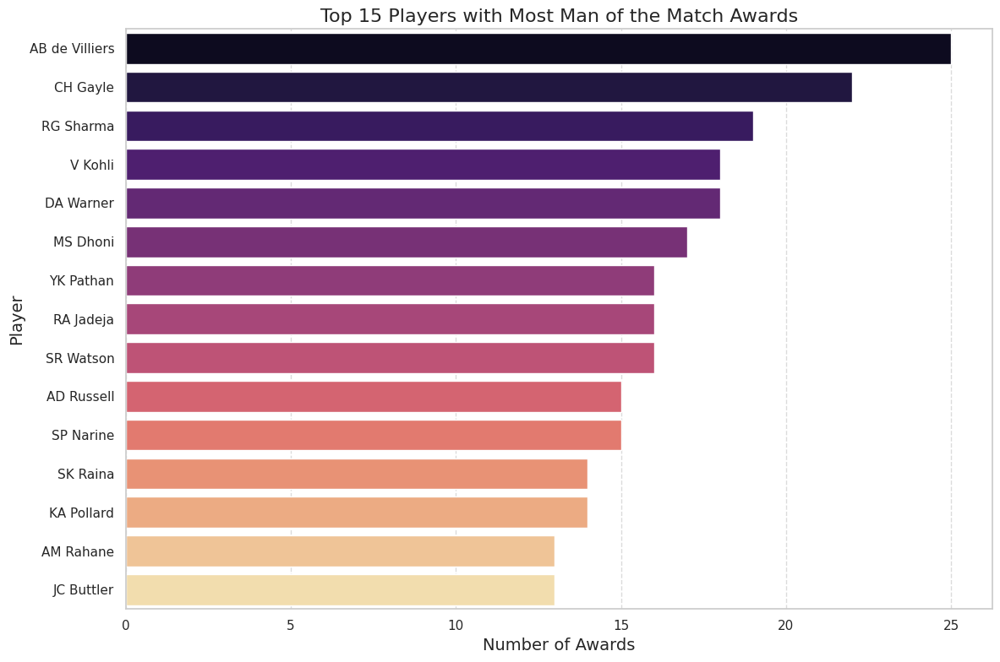

In [92]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_man_of_match_count(df_matches, top_n=15):
    # Count man of the match awards for each player
    mom_counts = df_matches['player_of_match'].value_counts().reset_index()
    mom_counts.columns = ['Player', 'MoM Count']

    # Get top N players with most MoM awards
    top_mom = mom_counts.head(top_n)

    plt.figure(figsize=(12, 8))
    sns.barplot(x='MoM Count', y='Player', data=top_mom, palette='magma')
    plt.title(f'Top {top_n} Players with Most Man of the Match Awards', fontsize=16)
    plt.xlabel('Number of Awards', fontsize=14)
    plt.ylabel('Player', fontsize=14)
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    return top_mom
top_mom = plot_man_of_match_count(df_matches)

Use K-Means Clustering to plot Batting Average vs Bowling Economy Rate for number of clusters = 3 (Batsman, Bowler, All Rounder)


<ipython-input-93-08fe77968299>:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  qualified_players['cluster'] = kmeans.fit_predict(X)
<ipython-input-93-08fe77968299>:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  qualified_players['role'] = qualified_players['cluster'].map(cluster_role_map)


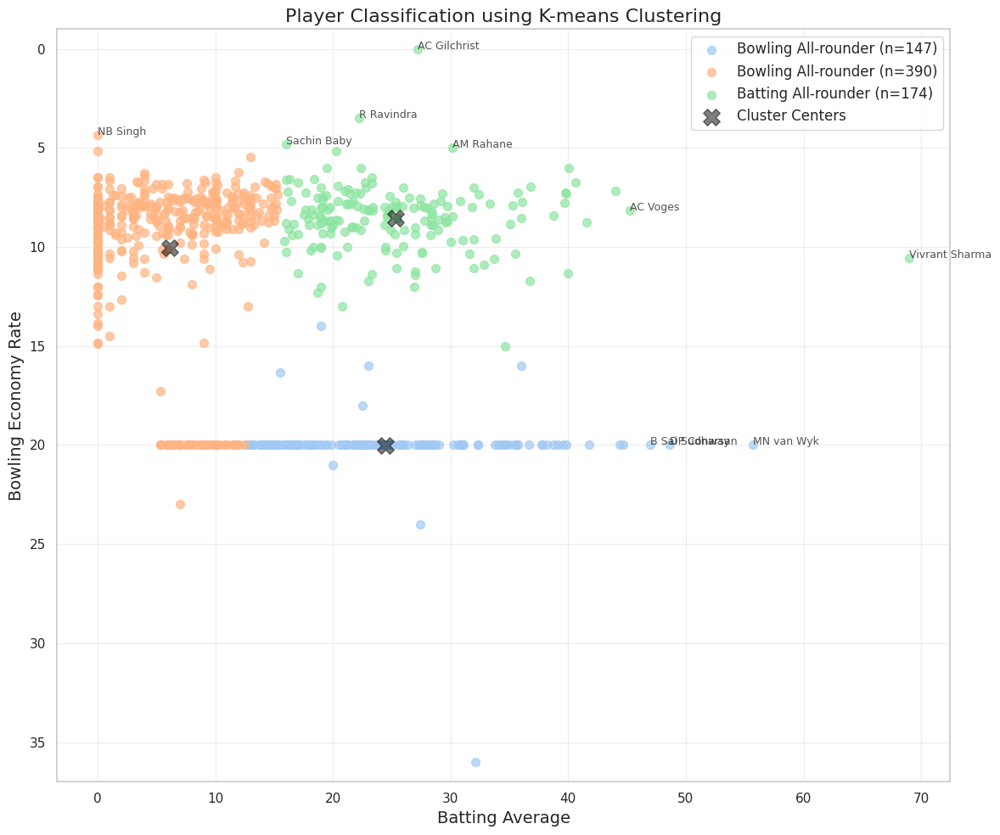

In [93]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

def plot_player_clustering(df_deliveries, n_clusters=3):
    # Calculate batting averages
    # First get total runs for each batsman
    batsman_runs = df_deliveries.groupby('batter')['batsman_runs'].sum().reset_index()

    # Get dismissal count for each batsman
    dismissals = df_deliveries[df_deliveries['is_wicket'] == 1].groupby('player_dismissed').size().reset_index()
    dismissals.columns = ['batter', 'dismissals']

    # Merge runs and dismissals
    batting_stats = pd.merge(batsman_runs, dismissals, on='batter', how='left')
    batting_stats['dismissals'] = batting_stats['dismissals'].fillna(0)

    # Calculate batting average (runs/dismissals)
    batting_stats['batting_avg'] = batting_stats['batsman_runs'] / batting_stats['dismissals'].replace(0, 1)

    # Calculate bowling economy rate
    # First get total runs conceded by each bowler
    bowling_runs = df_deliveries.groupby('bowler')['total_runs'].sum().reset_index()

    # Get total balls bowled by each bowler
    bowling_balls = df_deliveries.groupby('bowler').size().reset_index()
    bowling_balls.columns = ['bowler', 'balls']

    # Merge runs and balls
    bowling_stats = pd.merge(bowling_runs, bowling_balls, on='bowler', how='left')

    # Calculate economy rate (runs per over = runs / (balls/6))
    bowling_stats['economy_rate'] = (bowling_stats['total_runs'] / (bowling_stats['balls']/6)).round(2)

    # Merge batting and bowling stats
    # Use outer join to include all players
    player_stats = pd.merge(batting_stats[['batter', 'batting_avg']],
                          bowling_stats[['bowler', 'economy_rate']],
                          left_on='batter', right_on='bowler',
                          how='outer')

    # Clean up and prepare for clustering
    player_stats['name'] = player_stats['batter'].fillna(player_stats['bowler'])
    player_stats['batting_avg'] = player_stats['batting_avg'].fillna(0)
    player_stats['economy_rate'] = player_stats['economy_rate'].fillna(20)  # High economy for pure batsmen

    # Filter for minimum qualification (players with some meaningful stats)
    qualified_players = player_stats[(player_stats['batting_avg'] > 5) | (player_stats['economy_rate'] < 15)]

    # Prepare data for clustering
    X = qualified_players[['batting_avg', 'economy_rate']].copy()

    # Cap extremely high batting averages for better clustering
    X['batting_avg'] = X['batting_avg'].clip(upper=100)

    # Perform K-means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    qualified_players['cluster'] = kmeans.fit_predict(X)

    # Add role labels based on clustering
    # Determine roles based on cluster centroids
    centroids = kmeans.cluster_centers_
    roles = []
    for i in range(n_clusters):
        if centroids[i, 0] > 25 and centroids[i, 1] > 8:
            roles.append('Batting All-rounder')
        elif centroids[i, 0] > 25:
            roles.append('Batsman')
        elif centroids[i, 1] < 8:
            roles.append('Bowler')
        else:
            roles.append('Bowling All-rounder')

    # Map cluster to roles
    cluster_role_map = {i: role for i, role in enumerate(roles)}
    qualified_players['role'] = qualified_players['cluster'].map(cluster_role_map)

    # Visualization
    plt.figure(figsize=(12, 10))

    # Create scatter plot with different colors for different clusters
    for cluster, role in cluster_role_map.items():
        cluster_data = qualified_players[qualified_players['cluster'] == cluster]
        plt.scatter(cluster_data['batting_avg'], cluster_data['economy_rate'],
                    label=f'{role} (n={len(cluster_data)})', alpha=0.7, s=50)

    # Plot cluster centers
    plt.scatter(centroids[:, 0], centroids[:, 1], c='black', s=200, alpha=0.5, marker='X', label='Cluster Centers')

    # Annotate some notable players
    top_players = qualified_players.nlargest(5, 'batting_avg')
    for _, player in top_players.iterrows():
        plt.annotate(player['name'], (player['batting_avg'], player['economy_rate']),
                    fontsize=9, alpha=0.8)

    # Also annotate top bowlers
    top_bowlers = qualified_players.nsmallest(5, 'economy_rate')
    for _, player in top_bowlers.iterrows():
        plt.annotate(player['name'], (player['batting_avg'], player['economy_rate']),
                    fontsize=9, alpha=0.8)

    plt.title('Player Classification using K-means Clustering', fontsize=16)
    plt.xlabel('Batting Average', fontsize=14)
    plt.ylabel('Bowling Economy Rate', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, alpha=0.3)

    # Invert y-axis as lower economy rate is better
    plt.ylim(max(qualified_players['economy_rate'])+1, min(qualified_players['economy_rate'])-1)

    plt.tight_layout()
    plt.show()

    return qualified_players


player_clusters = plot_player_clustering(df_deliveries)

Identify Top 10 Batsmen in each run category:
Top 6’s scorer
Top 4’s scorer
Top 2’s scorer
Top 1’s scorer


<ipython-input-94-e39b34a81cff>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=f'Number of {category}', y='Batsman', data=top_batsmen, ax=axes[i], palette='Set2')
<ipython-input-94-e39b34a81cff>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=f'Number of {category}', y='Batsman', data=top_batsmen, ax=axes[i], palette='Set2')
<ipython-input-94-e39b34a81cff>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=f'Number of {category}', y='Batsman', data=top_batsmen, ax=axes[i], palette='Set2')
<ipython-input-94-e39b34a81cff>:30: FutureW

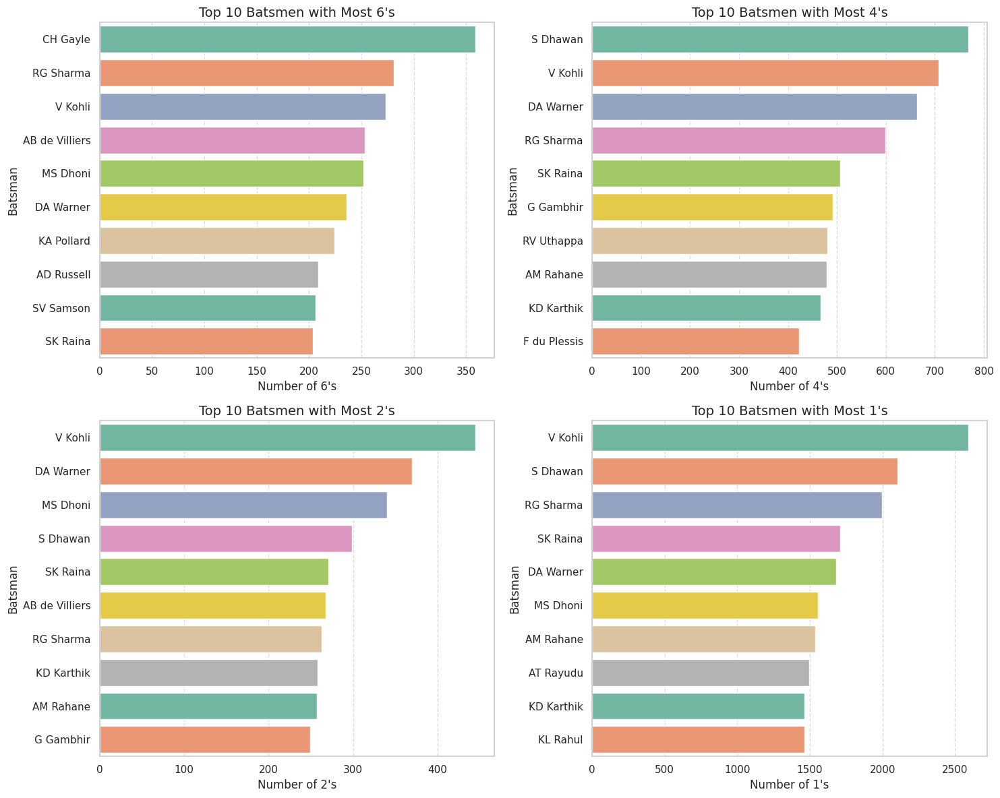

In [94]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_top_run_scorers_by_category(df_deliveries, top_n=10):
    # Create a dataframe to store the counts of different run categories
    run_categories = {
        "6's": 6,
        "4's": 4,
        "2's": 2,
        "1's": 1
    }

    # Create subplots
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    axes = axes.flatten()

    results = {}

    for i, (category, run_value) in enumerate(run_categories.items()):
        # Count the number of times each batsman scored this run value
        run_counts = df_deliveries[df_deliveries['batsman_runs'] == run_value]['batter'].value_counts().reset_index()
        run_counts.columns = ['Batsman', f'Number of {category}']

        # Get top N batsmen
        top_batsmen = run_counts.head(top_n)
        results[category] = top_batsmen

        # Plot
        sns.barplot(x=f'Number of {category}', y='Batsman', data=top_batsmen, ax=axes[i], palette='Set2')
        axes[i].set_title(f'Top {top_n} Batsmen with Most {category}', fontsize=14)
        axes[i].set_xlabel(f'Number of {category}', fontsize=12)
        axes[i].set_ylabel('Batsman', fontsize=12)
        axes[i].grid(axis='x', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

    return results

top_run_scorers = plot_top_run_scorers_by_category(df_deliveries)

Plot Batting Average vs Batting Strike Rate for the top 20 run-scorers

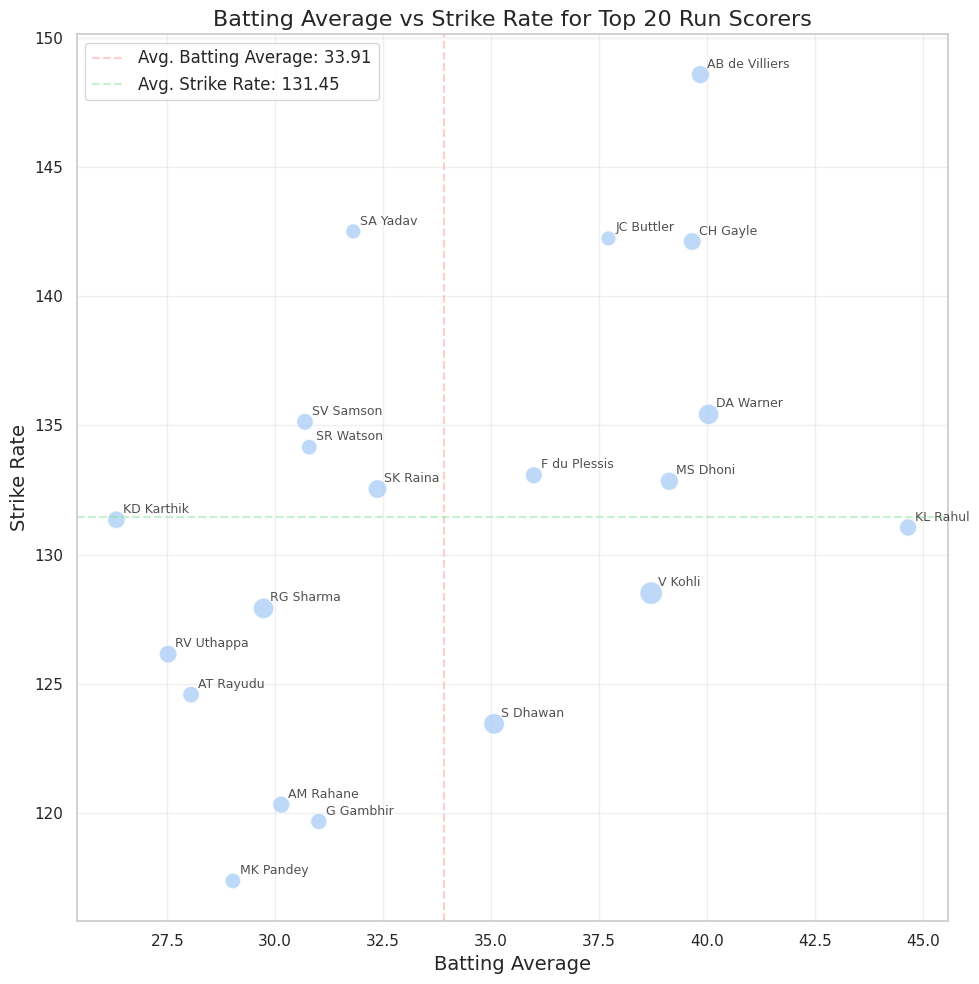

In [95]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_avg_vs_strike_rate(df_deliveries, top_n=20):
    # Calculate total runs for each batsman
    batsman_runs = df_deliveries.groupby('batter')['batsman_runs'].sum().reset_index()
    batsman_runs = batsman_runs.sort_values('batsman_runs', ascending=False)
    top_run_scorers = batsman_runs.head(top_n)['batter'].tolist()

    # Calculate batting average
    # Get dismissal count for each batsman
    dismissals = df_deliveries[df_deliveries['is_wicket'] == 1].groupby('player_dismissed').size().reset_index()
    dismissals.columns = ['batter', 'dismissals']

    # Calculate total balls faced by each batsman
    balls_faced = df_deliveries.groupby('batter').size().reset_index()
    balls_faced.columns = ['batter', 'balls_faced']

    # Merge all stats
    batting_stats = pd.merge(batsman_runs, dismissals, on='batter', how='left')
    batting_stats = pd.merge(batting_stats, balls_faced, on='batter', how='left')

    # Fill NaN values for dismissals (players who were never out)
    batting_stats['dismissals'] = batting_stats['dismissals'].fillna(1)

    # Calculate batting average and strike rate
    batting_stats['batting_avg'] = (batting_stats['batsman_runs'] / batting_stats['dismissals']).round(2)
    batting_stats['strike_rate'] = (batting_stats['batsman_runs'] / batting_stats['balls_faced'] * 100).round(2)

    # Filter for top run scorers only
    top_batsmen_stats = batting_stats[batting_stats['batter'].isin(top_run_scorers)]

    # Visualization
    plt.figure(figsize=(10, 10))

    # Create scatter plot
    sns.scatterplot(x='batting_avg', y='strike_rate', data=top_batsmen_stats,
                   s=top_batsmen_stats['batsman_runs']/30, alpha=0.7)

    # Add labels for each point
    for _, player in top_batsmen_stats.iterrows():
        plt.annotate(player['batter'],
                    (player['batting_avg'], player['strike_rate']),
                    fontsize=9, alpha=0.8,
                    xytext=(5, 5), textcoords='offset points')

    plt.title(f'Batting Average vs Strike Rate for Top {top_n} Run Scorers', fontsize=16)
    plt.xlabel('Batting Average', fontsize=14)
    plt.ylabel('Strike Rate', fontsize=14)
    plt.grid(True, alpha=0.3)

    # Add reference lines for average values
    plt.axvline(x=top_batsmen_stats['batting_avg'].mean(), color='r', linestyle='--', alpha=0.5,
               label=f'Avg. Batting Average: {top_batsmen_stats["batting_avg"].mean():.2f}')
    plt.axhline(y=top_batsmen_stats['strike_rate'].mean(), color='g', linestyle='--', alpha=0.5,
               label=f'Avg. Strike Rate: {top_batsmen_stats["strike_rate"].mean():.2f}')

    plt.legend(fontsize=12)
    plt.tight_layout()
    plt.show()

    return top_batsmen_stats

top_batsmen_stats = plot_avg_vs_strike_rate(df_deliveries)

Find Highest Average and Strike Rate for players with >50 matches

Found 157 players with 50+ matches


<ipython-input-96-7511fe5b2576>:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exp_batting_stats['batting_avg'] = (exp_batting_stats['batsman_runs'] / exp_batting_stats['dismissals']).round(2)
<ipython-input-96-7511fe5b2576>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exp_batting_stats['strike_rate'] = (exp_batting_stats['batsman_runs'] / exp_batting_stats['balls_faced'] * 100).round(2)
<ipython-input-96-7511fe5b2576>:77: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and 

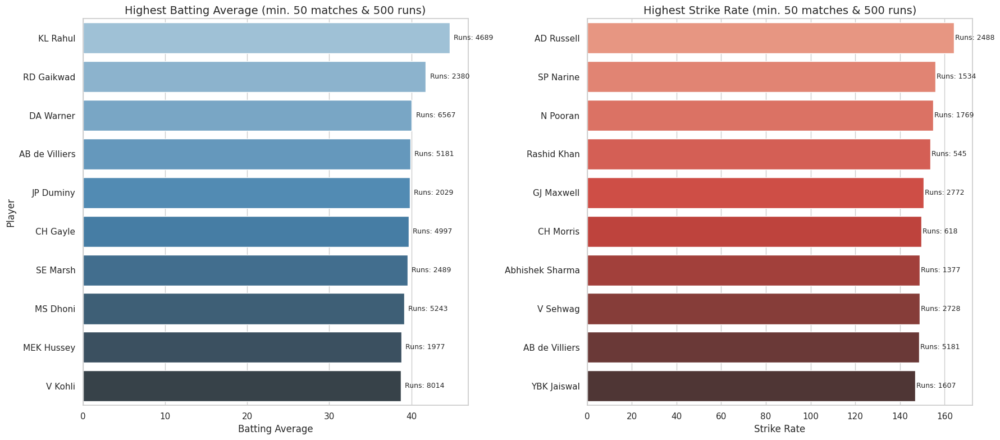

In [96]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def find_best_experienced_players(df_deliveries, df_matches, min_matches=50):
    # Find players who have played in more than min_matches
    # First, identify unique players in each match
    player_matches = set()

    # Add batsmen
    for batter in df_deliveries['batter'].unique():
        player_matches.add(batter)

    # Add bowlers
    for bowler in df_deliveries['bowler'].unique():
        player_matches.add(bowler)

    # Count matches for each player
    player_match_counts = {}

    for player in player_matches:
        # Count matches as batsman
        batsman_matches = df_deliveries[df_deliveries['batter'] == player]['match_id'].nunique()

        # Count matches as bowler
        bowler_matches = df_deliveries[df_deliveries['bowler'] == player]['match_id'].nunique()

        # Take maximum of the two (to avoid double counting)
        player_match_counts[player] = max(batsman_matches, bowler_matches)

    # Convert to DataFrame
    player_experience = pd.DataFrame(list(player_match_counts.items()), columns=['player', 'matches_played'])

    # Filter players with more than min_matches
    experienced_players = player_experience[player_experience['matches_played'] >= min_matches]['player'].tolist()

    print(f"Found {len(experienced_players)} players with {min_matches}+ matches")

    # Calculate batting stats for experienced players
    # Calculate total runs for each batsman
    batsman_runs = df_deliveries.groupby('batter')['batsman_runs'].sum().reset_index()

    # Get dismissal count for each batsman
    dismissals = df_deliveries[df_deliveries['is_wicket'] == 1].groupby('player_dismissed').size().reset_index()
    dismissals.columns = ['batter', 'dismissals']

    # Calculate total balls faced by each batsman
    balls_faced = df_deliveries.groupby('batter').size().reset_index()
    balls_faced.columns = ['batter', 'balls_faced']

    # Merge all stats
    batting_stats = pd.merge(batsman_runs, dismissals, on='batter', how='left')
    batting_stats = pd.merge(batting_stats, balls_faced, on='batter', how='left')

    # Fill NaN values for dismissals (players who were never out)
    batting_stats['dismissals'] = batting_stats['dismissals'].fillna(1)

    # Filter for experienced players only
    exp_batting_stats = batting_stats[batting_stats['batter'].isin(experienced_players)]

    # Calculate batting average and strike rate
    exp_batting_stats['batting_avg'] = (exp_batting_stats['batsman_runs'] / exp_batting_stats['dismissals']).round(2)
    exp_batting_stats['strike_rate'] = (exp_batting_stats['batsman_runs'] / exp_batting_stats['balls_faced'] * 100).round(2)

    # Find players with highest batting average and strike rate
    min_runs_threshold = 500  # Minimum runs to qualify
    qualified_stats = exp_batting_stats[exp_batting_stats['batsman_runs'] >= min_runs_threshold]

    # Sort by batting average and strike rate
    best_avg = qualified_stats.sort_values('batting_avg', ascending=False).head(10)
    best_sr = qualified_stats.sort_values('strike_rate', ascending=False).head(10)

    # Create visualization - two bar charts side by side
    fig, axes = plt.subplots(1, 2, figsize=(18, 8))

    # Plot for best batting average
    sns.barplot(x='batting_avg', y='batter', data=best_avg, palette='Blues_d', ax=axes[0])
    axes[0].set_title(f'Highest Batting Average (min. {min_matches} matches & {min_runs_threshold} runs)', fontsize=14)
    axes[0].set_xlabel('Batting Average', fontsize=12)
    axes[0].set_ylabel('Player', fontsize=12)

    # Add run information
    for i, row in enumerate(best_avg.itertuples()):
        axes[0].text(row.batting_avg + 0.5, i, f'Runs: {row.batsman_runs}',
                    va='center', fontsize=9)

    # Plot for best strike rate
    sns.barplot(x='strike_rate', y='batter', data=best_sr, palette='Reds_d', ax=axes[1])
    axes[1].set_title(f'Highest Strike Rate (min. {min_matches} matches & {min_runs_threshold} runs)', fontsize=14)
    axes[1].set_xlabel('Strike Rate', fontsize=12)
    axes[1].set_ylabel('', fontsize=12)  # No need to repeat y-label

    # Add run information
    for i, row in enumerate(best_sr.itertuples()):
        axes[1].text(row.strike_rate + 0.5, i, f'Runs: {row.batsman_runs}',
                    va='center', fontsize=9)

    plt.tight_layout()
    plt.show()

    return {
        'highest_average': best_avg,
        'highest_strike_rate': best_sr
    }

experienced_stats = find_best_experienced_players(df_deliveries, df_matches, min_matches=50)

# **Seasonal Analysis**

In [100]:
#merge by match_id and id
match=pd.read_csv('matches.csv')
delivery=pd.read_csv('/content/deliveries.csv')
total_score_df=delivery.groupby(['match_id','inning']).sum()['total_runs'].reset_index()
match_df=match.merge(total_score_df[['match_id','total_runs']],left_on='id',right_on='match_id')
season_dfs = {season: match_df[match_df["season"] == season] for season in match_df["season"].unique()}
season_dfs["2023"].head()

,id,season,city,date,match_type,player_of_match,venue,team1,team2,toss_winner,...,result,result_margin,target_runs,target_overs,super_over,method,umpire1,umpire2,match_id,total_runs
1928,1359475,2023,Ahmedabad,2023-03-31,League,Rashid Khan,"Narendra Modi Stadium, Ahmedabad",Chennai Super Kings,Gujarat Titans,Gujarat Titans,...,wickets,5.0,179.0,20.0,N,NaN,Nitin Menon,HAS Khalid,1359475,178
1929,1359475,2023,Ahmedabad,2023-03-31,League,Rashid Khan,"Narendra Modi Stadium, Ahmedabad",Chennai Super Kings,Gujarat Titans,Gujarat Titans,...,wickets,5.0,179.0,20.0,N,NaN,Nitin Menon,HAS Khalid,1359475,182
1930,1359476,2023,Chandigarh,2023-04-01,League,Arshdeep Singh,"Punjab Cricket Association IS Bindra Stadium, ...",Punjab Kings,Kolkata Knight Riders,Kolkata Knight Riders,...,runs,7.0,154.0,16.0,N,D/L,BNJ Oxenford,YC Barde,1359476,191
1931,1359476,2023,Chandigarh,2023-04-01,League,Arshdeep Singh,"Punjab Cricket Association IS Bindra Stadium, ...",Punjab Kings,Kolkata Knight Riders,Kolkata Knight Riders,...,runs,7.0,154.0,16.0,N,D/L,BNJ Oxenford,YC Barde,1359476,146
1932,1359477,2023,Lucknow,2023-04-01,League,MA Wood,Bharat Ratna Shri Atal Bihari Vajpayee Ekana C...,Lucknow Super Giants,Delhi Capitals,Delhi Capitals,...,runs,50.0,194.0,20.0,N,NaN,AK Chaudhary,NA Patwardhan,1359477,193


In [101]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
# Create a directory to store the plots
plot_dir = "ipl_season_plots"
os.makedirs(plot_dir, exist_ok=True)

def explore_season(season):
    season_df = match_df[match_df['season'] == season]
    season_filename = season.replace("/", "_")  # Replace '/' with '_'

    # Number of matches played in each stadium
    plt.figure(figsize=(12,6))
    sns.countplot(y=season_df['venue'], order=season_df['venue'].value_counts().index, palette='coolwarm')
    plt.title(f'Number of Matches Played in Each Stadium ({season})')
    plt.xlabel('Count')
    plt.ylabel('Stadium')
    plt.savefig(f"{plot_dir}/{season_filename}_matches_per_stadium.png")
    plt.close()

    # Wins by each team
    plt.figure(figsize=(10,6))
    sns.countplot(y=season_df['winner'], order=season_df['winner'].value_counts().index, palette='viridis')
    plt.title(f'Wins by Each Team in {season}')
    plt.xlabel('Count')
    plt.ylabel('Team')
    plt.savefig(f"{plot_dir}/{season_filename}_wins_by_team.png")
    plt.close()

    # Average score of teams
    avg_score = season_df.groupby('team1')['total_runs'].mean().sort_values()
    plt.figure(figsize=(10,6))
    sns.barplot(x=avg_score.values, y=avg_score.index, palette='plasma')
    plt.title(f'Average Score of Teams in {season}')
    plt.xlabel('Average Runs')
    plt.ylabel('Team')
    plt.savefig(f"{plot_dir}/{season_filename}_average_score.png")
    plt.close()

    # Total runs scored by each team in the season
    total_runs = season_df.groupby('team1')['total_runs'].sum().sort_values()
    plt.figure(figsize=(10,6))
    sns.barplot(x=total_runs.values, y=total_runs.index, palette='magma')
    plt.title(f'Total Runs by Each Team in {season}')
    plt.xlabel('Total Runs')
    plt.ylabel('Team')
    plt.savefig(f"{plot_dir}/{season_filename}_total_runs.png")
    plt.close()

    # Win margins distribution
    plt.figure(figsize=(12,6))
    sns.histplot(season_df['result_margin'], bins=30, kde=True, color='blue')
    plt.title(f'Win Margins Distribution in {season}')
    plt.xlabel('Win Margin')
    plt.ylabel('Frequency')
    plt.savefig(f"{plot_dir}/{season_filename}_win_margins.png")
    plt.close()

    # Toss decision count
    plt.figure(figsize=(8,6))
    sns.countplot(x=season_df['toss_decision'], palette='coolwarm')
    plt.title(f'Toss Decision Count in {season}')
    plt.xlabel('Toss Decision')
    plt.ylabel('Count')
    plt.savefig(f"{plot_dir}/{season_filename}_toss_decision.png")
    plt.close()

    # Top players of the match
    top_players = season_df['player_of_match'].value_counts().head(10)
    plt.figure(figsize=(12,6))
    sns.barplot(x=top_players.values, y=top_players.index, palette='inferno')
    plt.title(f'Top Players of the Match in {season}')
    plt.xlabel('Number of Times Won')
    plt.ylabel('Player')
    plt.savefig(f"{plot_dir}/{season_filename}_top_players.png")
    plt.close()

# List of seasons to analyze
seasons = ['2007/08', '2009', '2009/10', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020/21', '2021', '2022', '2023', '2024']

# Run the exploration for all seasons
for season in seasons:
    explore_season(season)

print("All plots saved in", plot_dir)


<ipython-input-101-4edaa6615570>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=season_df['venue'], order=season_df['venue'].value_counts().index, palette='coolwarm')
<ipython-input-101-4edaa6615570>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=season_df['winner'], order=season_df['winner'].value_counts().index, palette='viridis')
<ipython-input-101-4edaa6615570>:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=avg_score.values, y=avg_score.index, palette='plasma')
<ipython-input-101-4edaa6615570>:44: FutureWarning: 

Pass

All plots saved in ipl_season_plots


In [102]:
import shutil

shutil.make_archive("/content/ipl_season_plots", 'zip', "/content/ipl_season_plots")

'/content/ipl_season_plots.zip'


📊 Displaying plots for 2007_08 season:


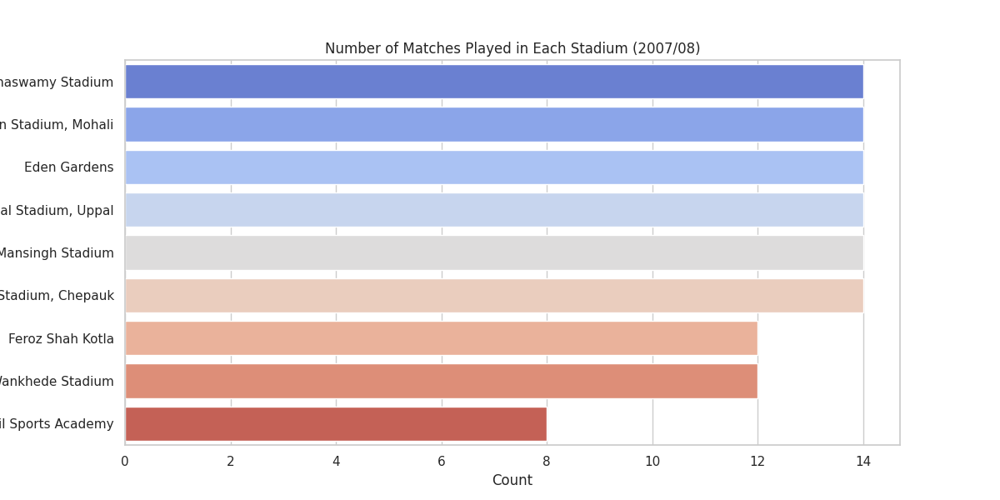

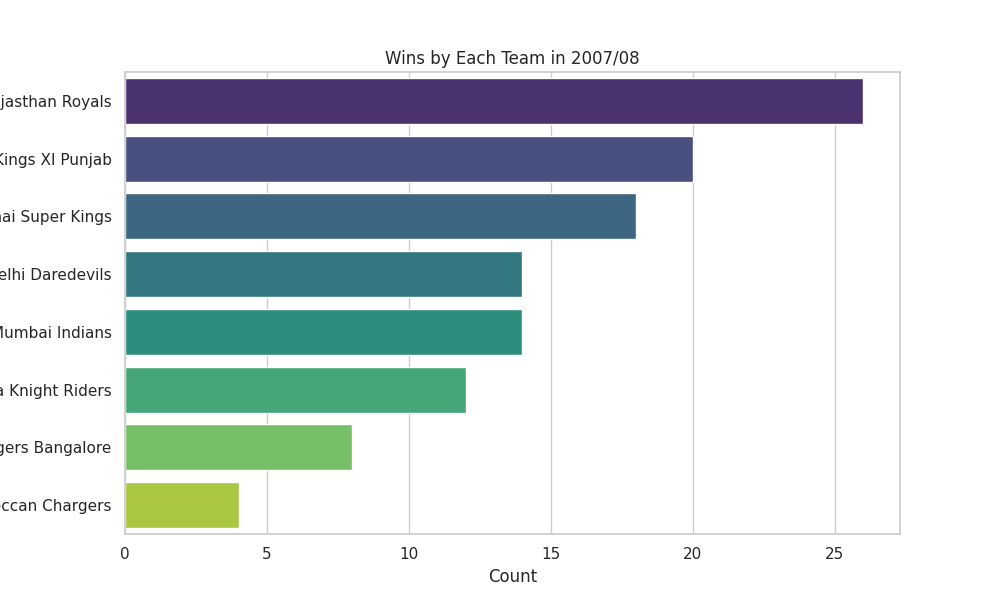

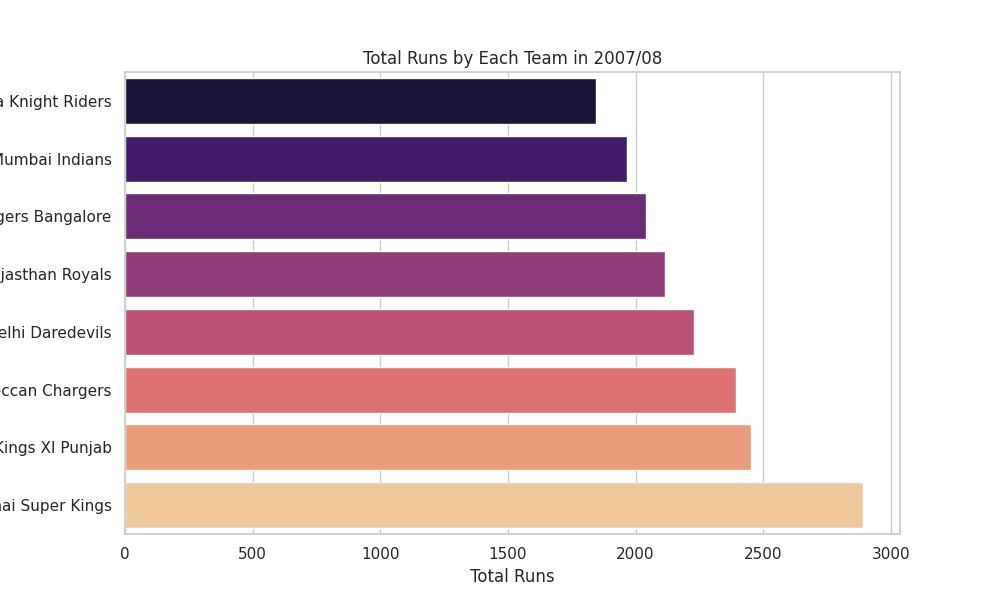

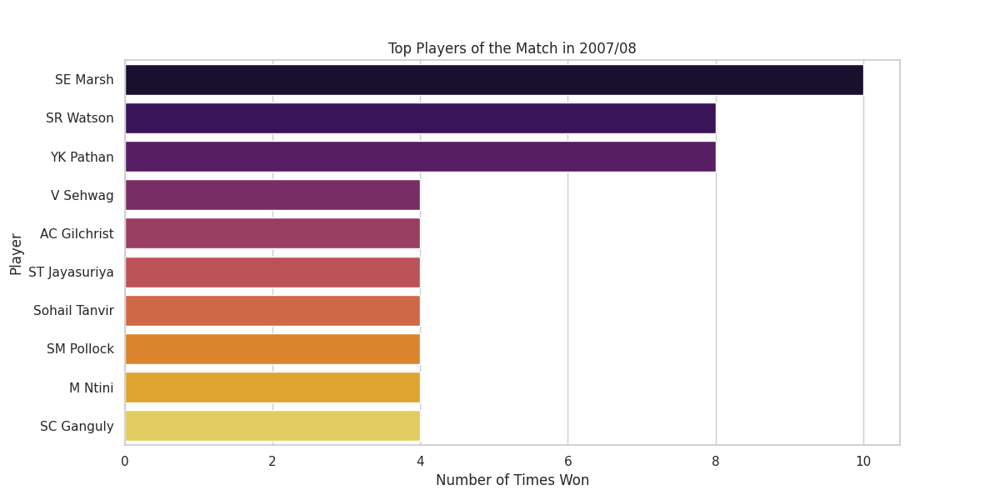

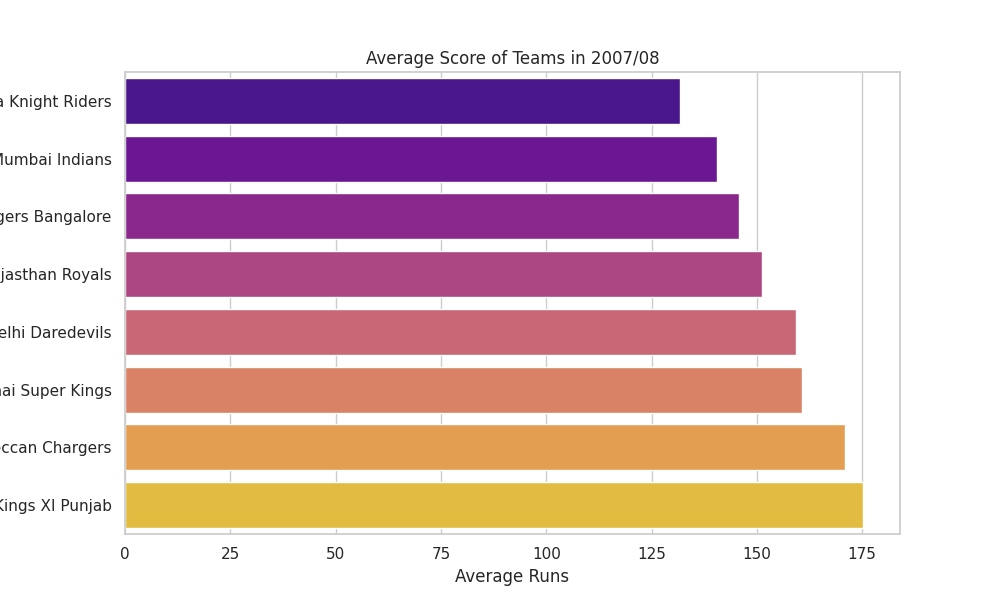

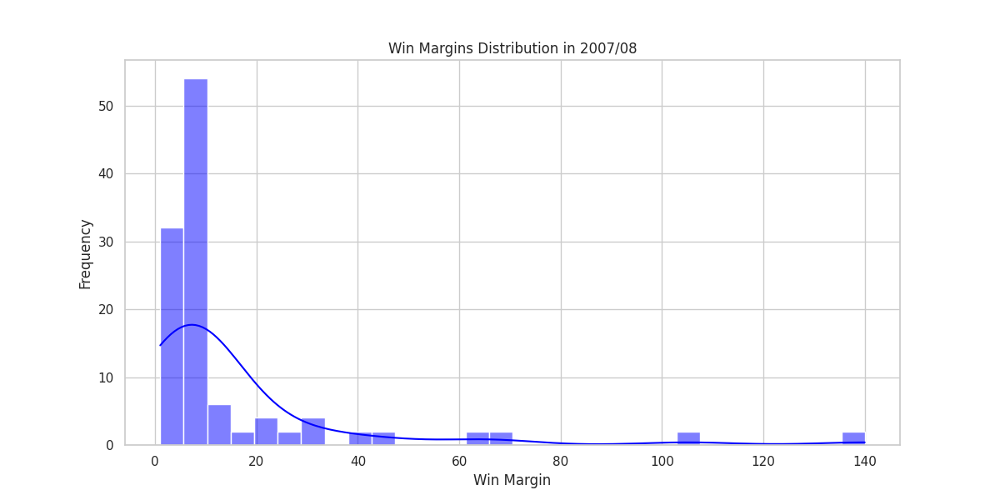


📊 Displaying plots for 2009 season:


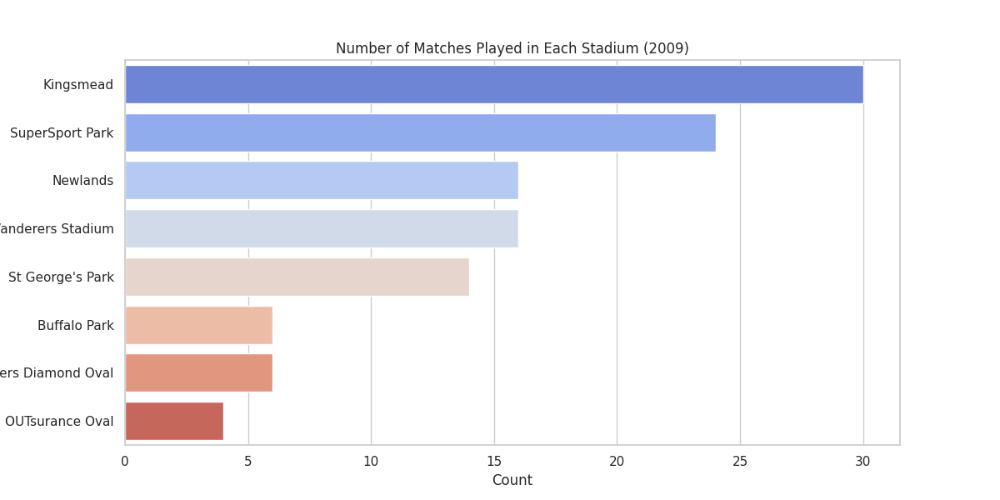

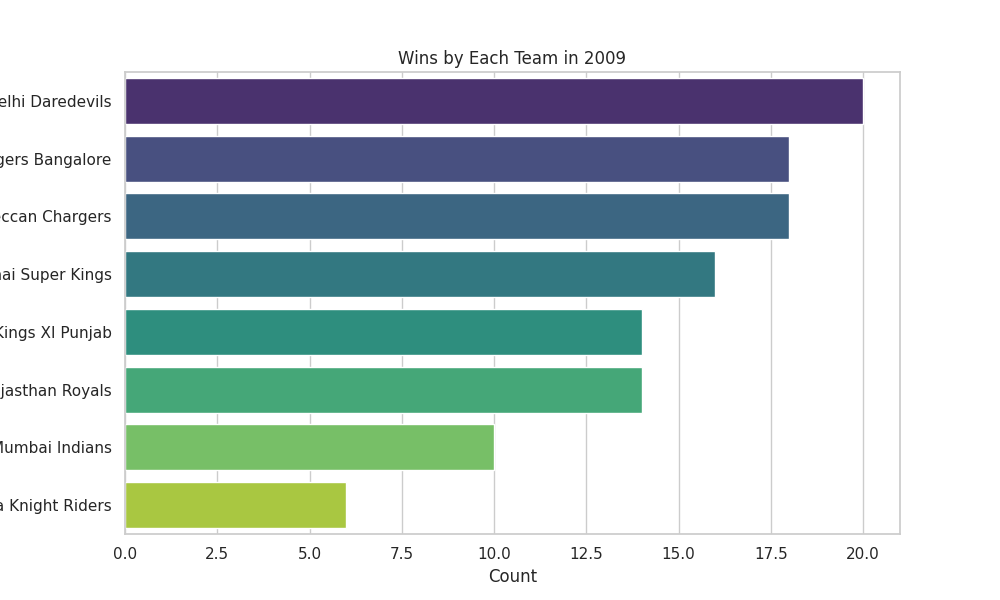

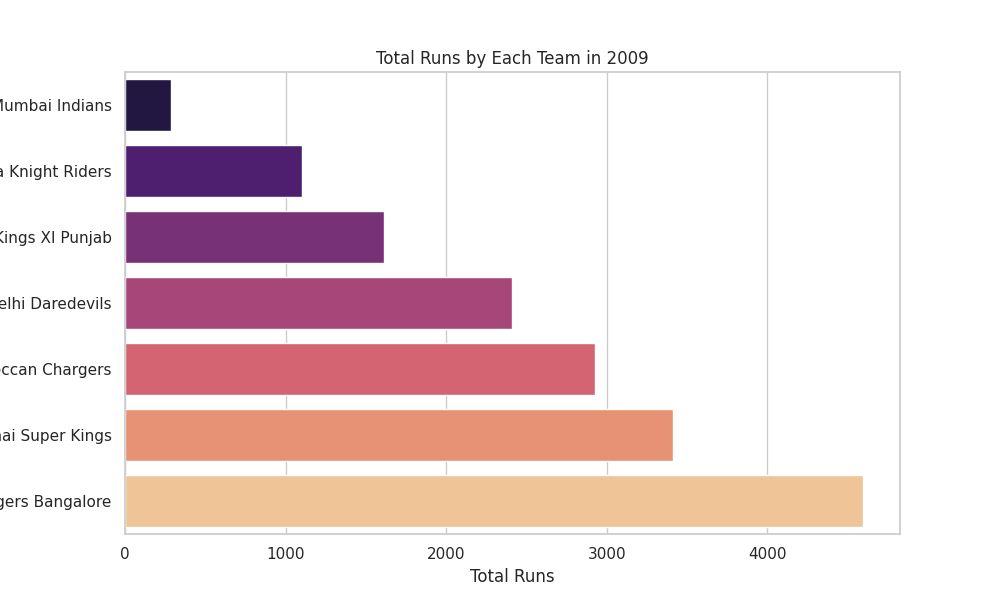

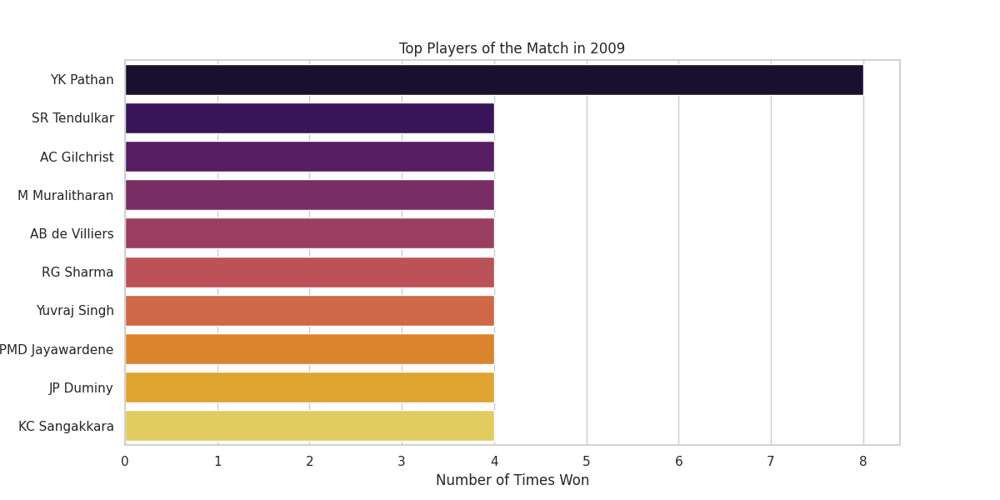

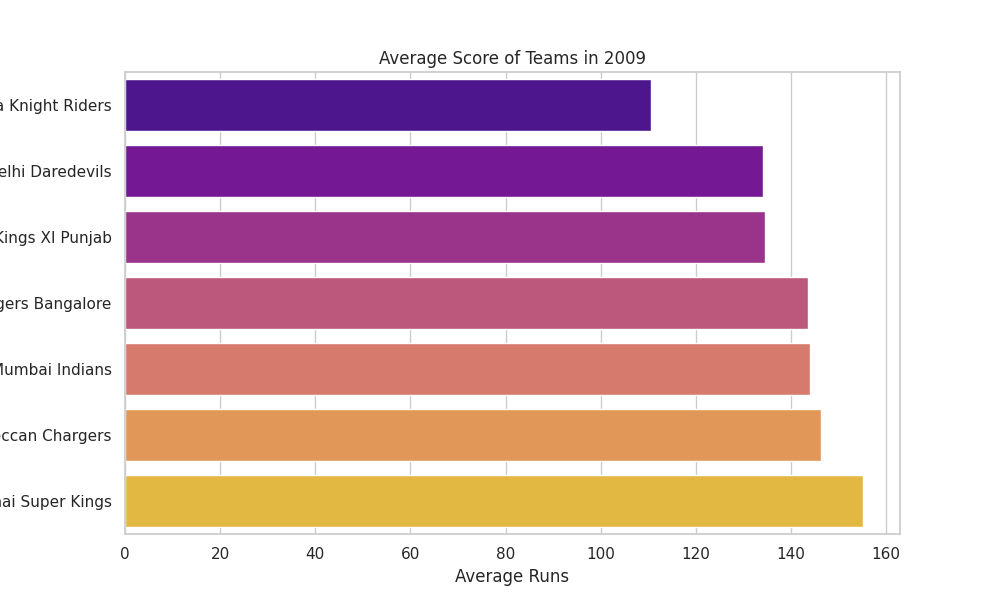

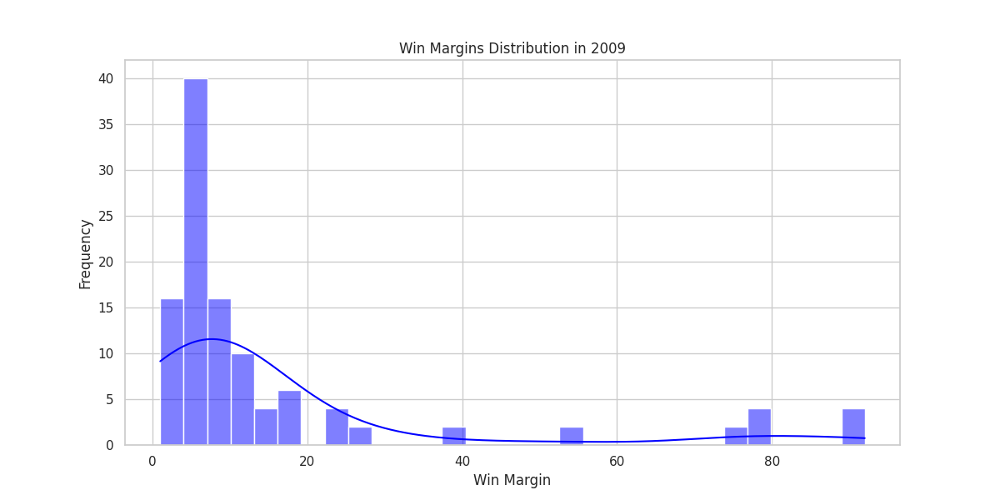


📊 Displaying plots for 2009_10 season:


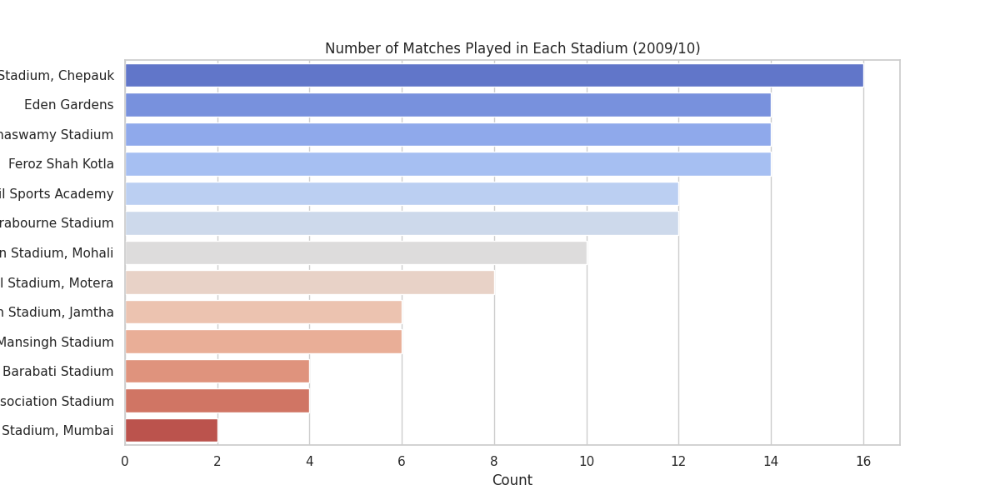

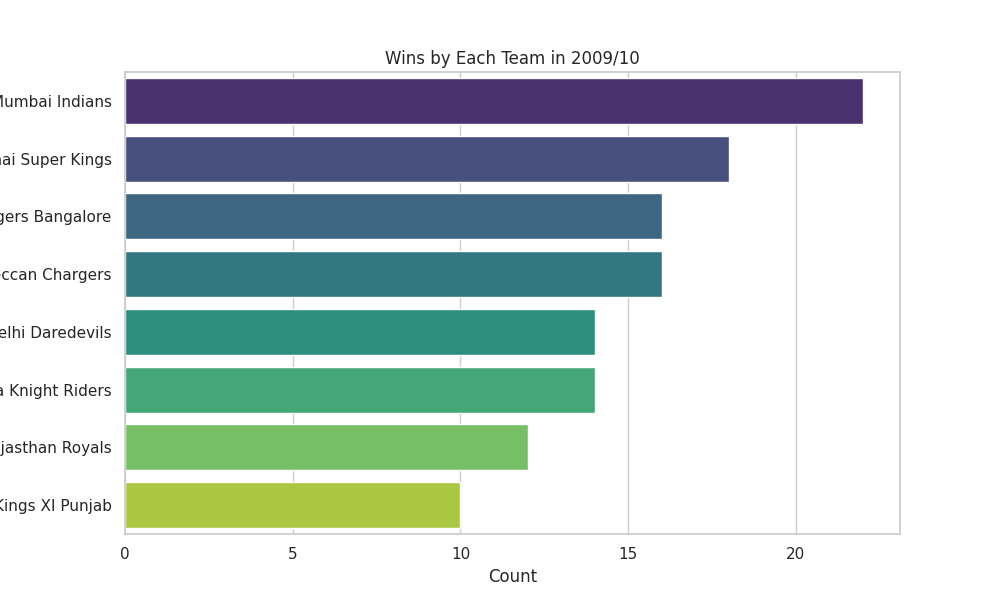

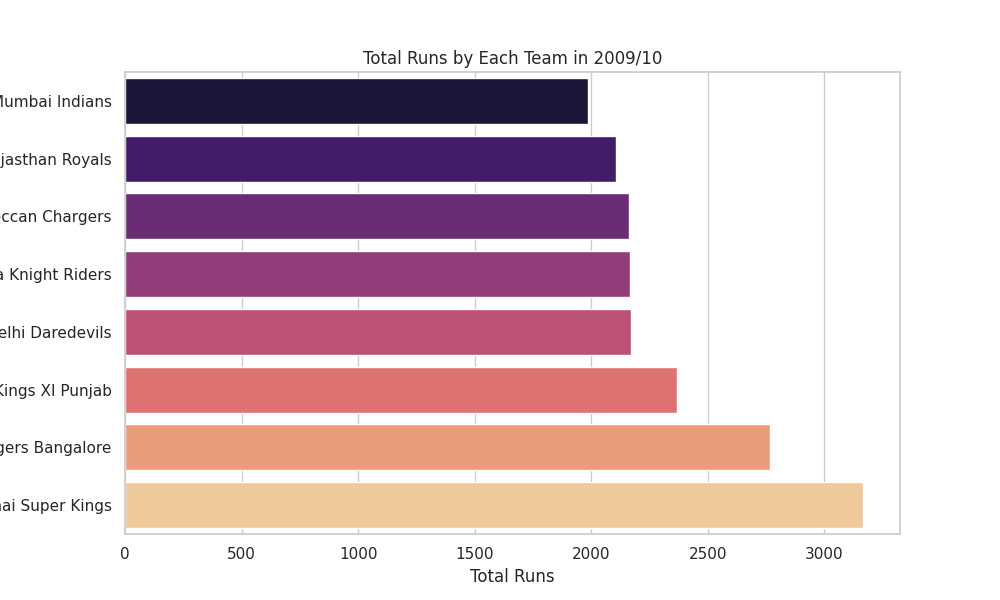

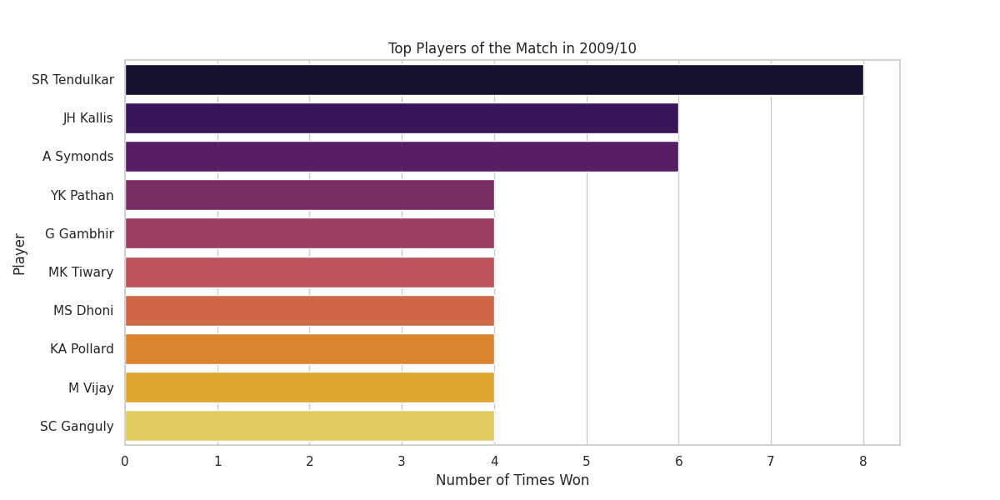

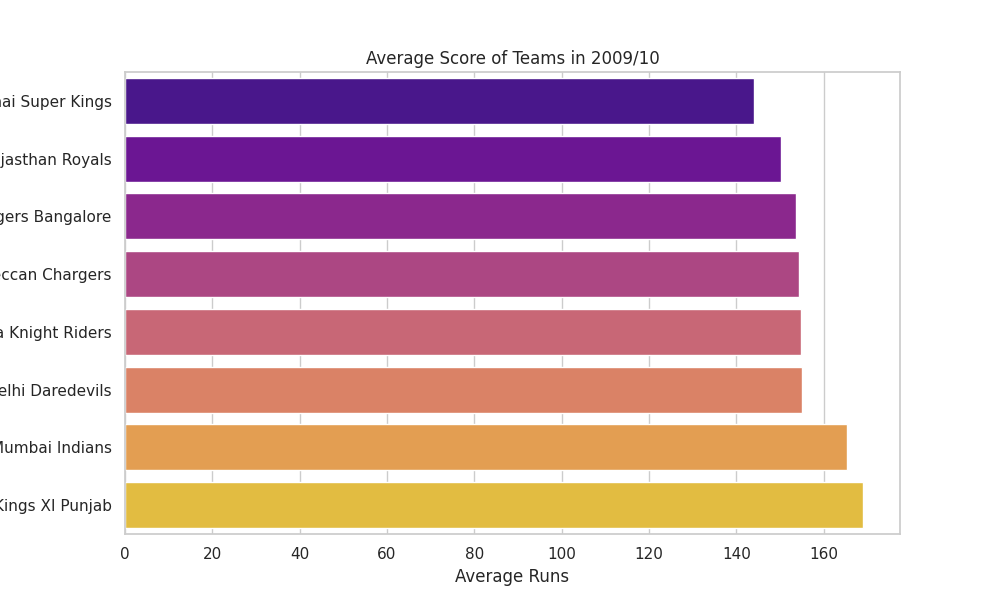

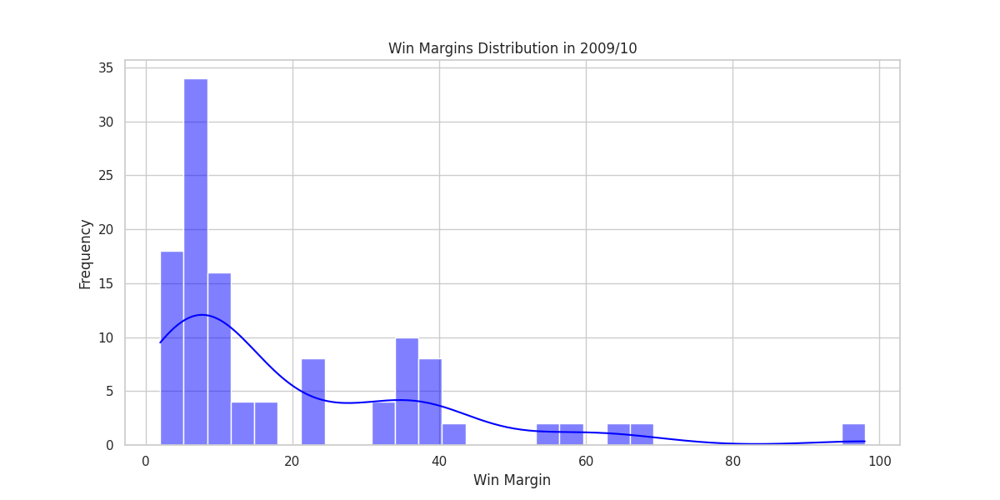


📊 Displaying plots for 2011 season:


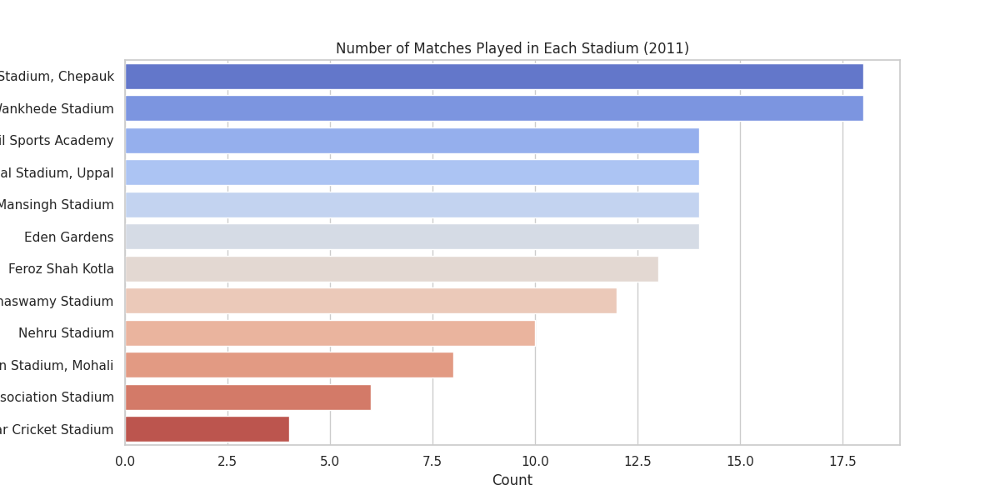

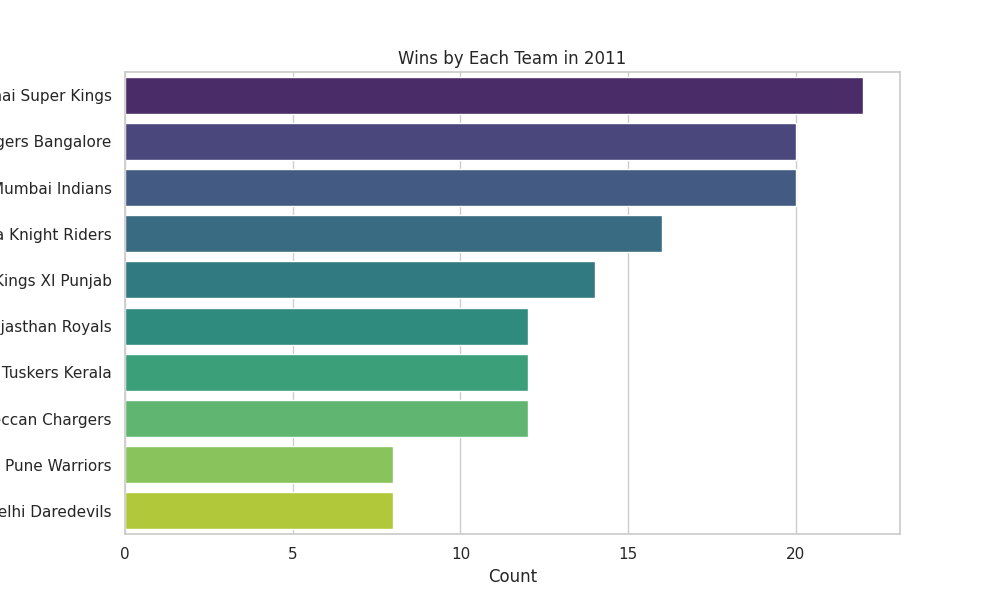

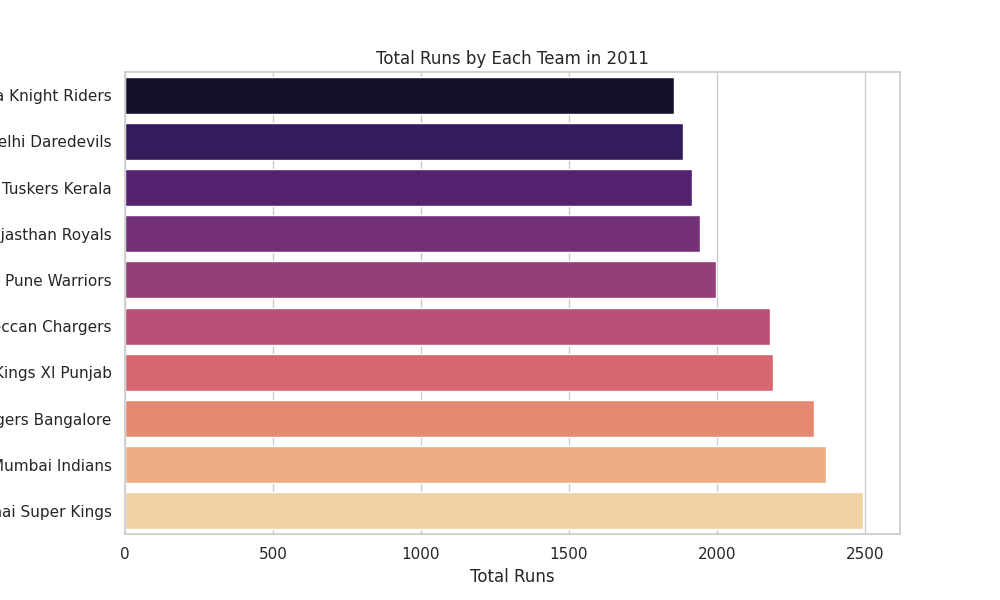

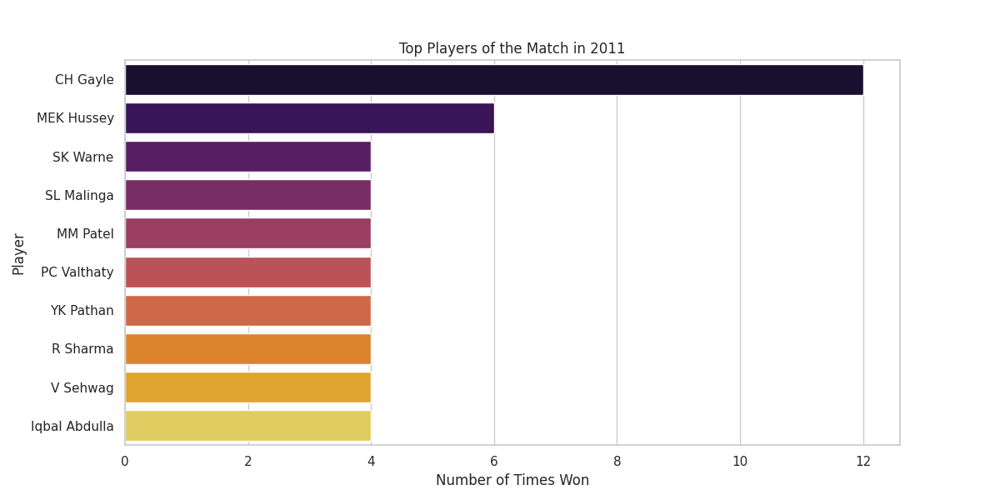

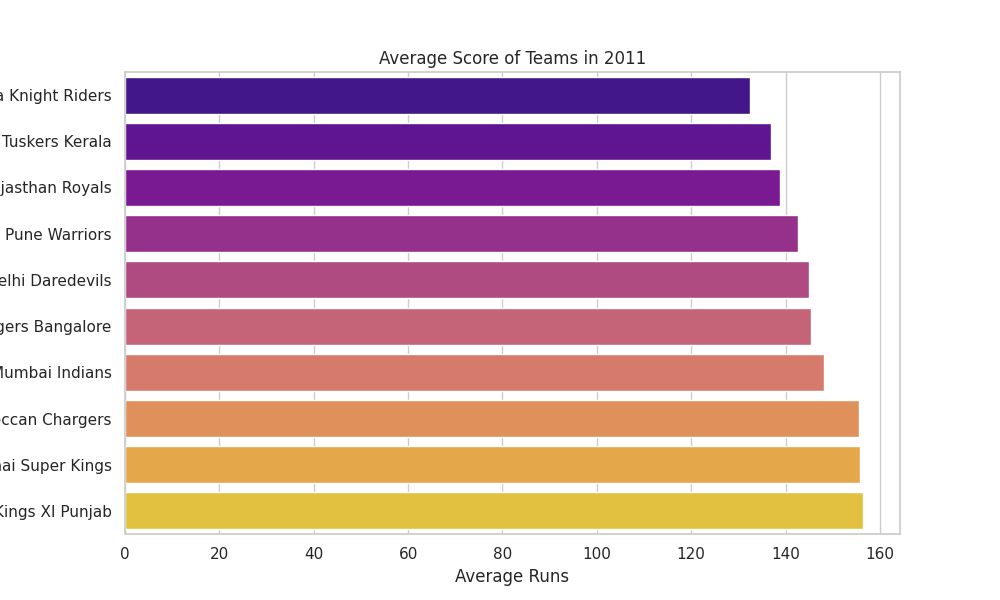

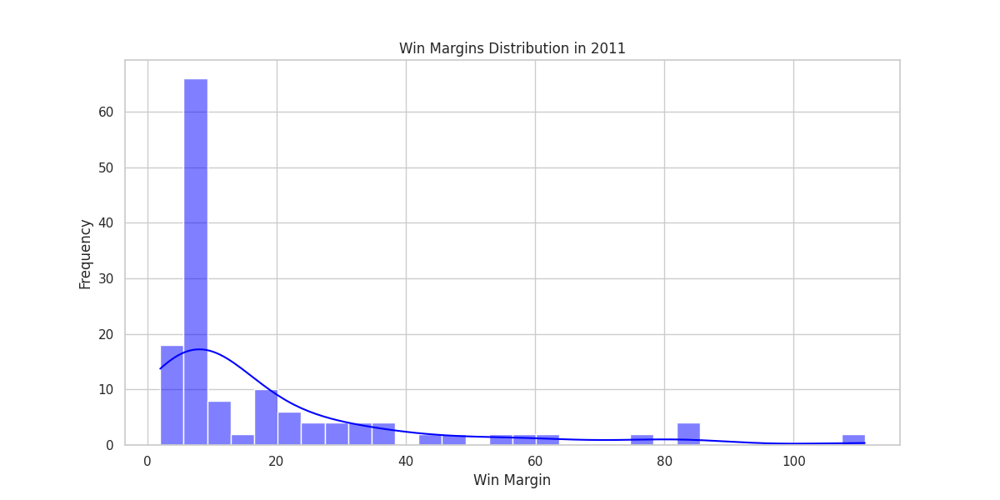


📊 Displaying plots for 2012 season:


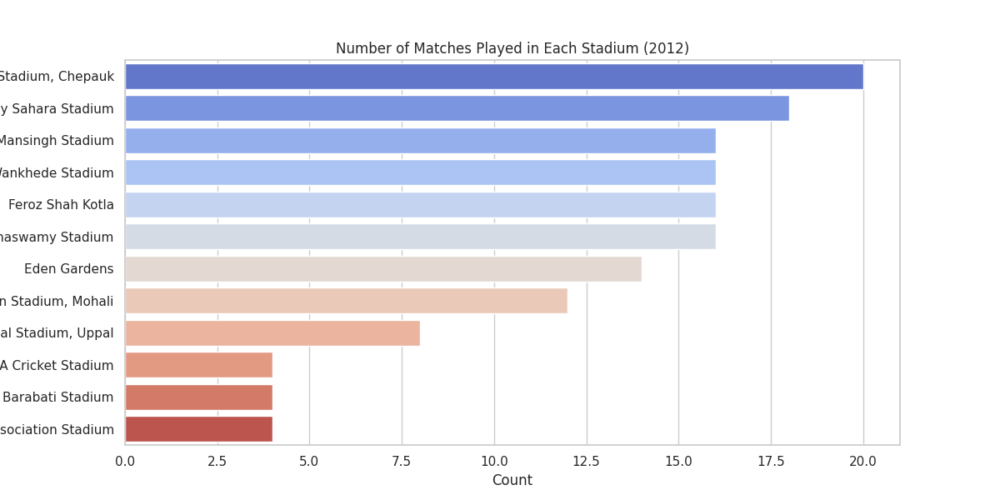

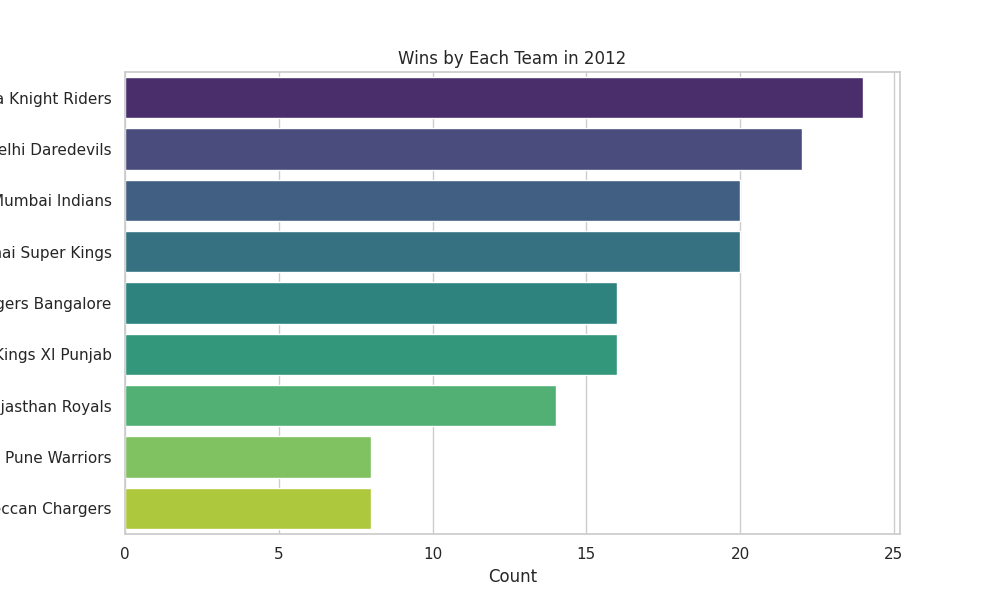

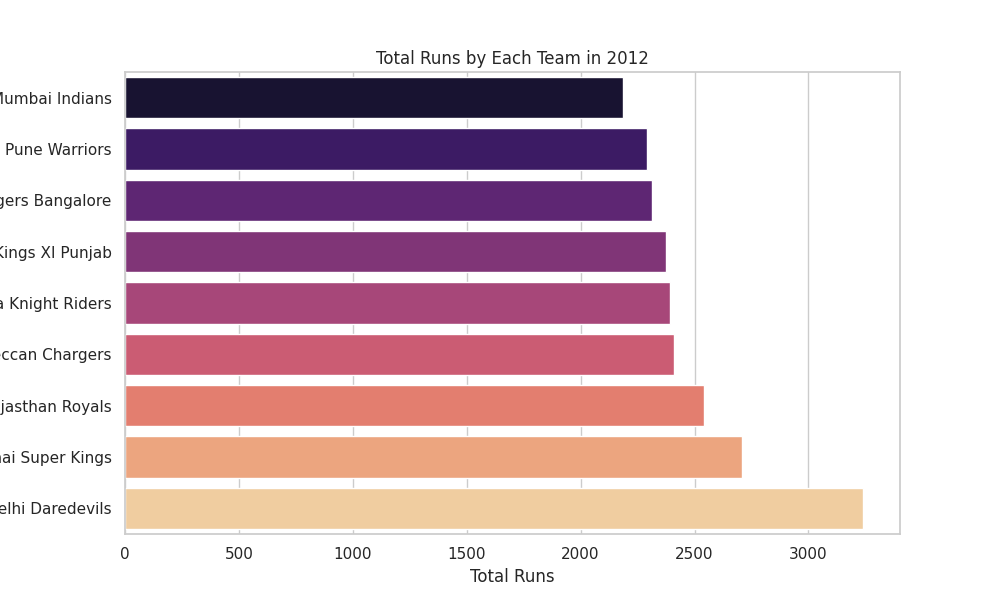

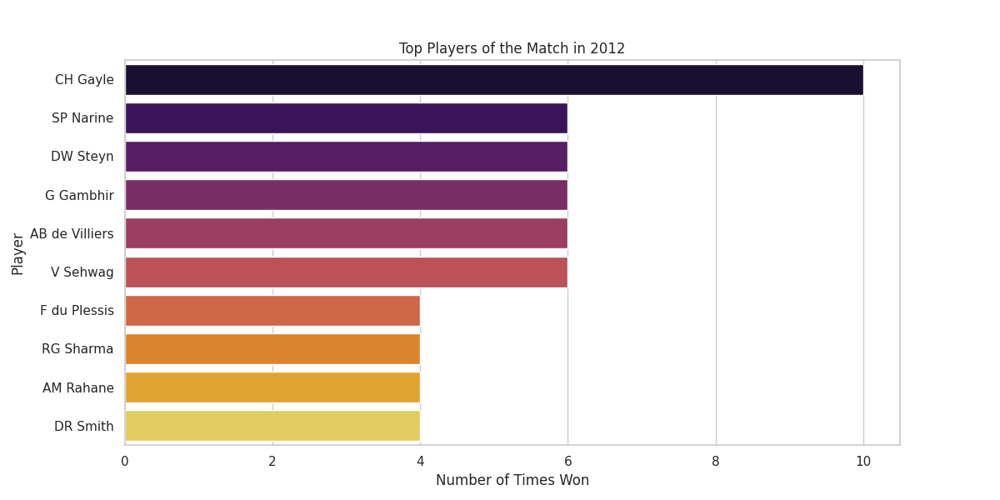

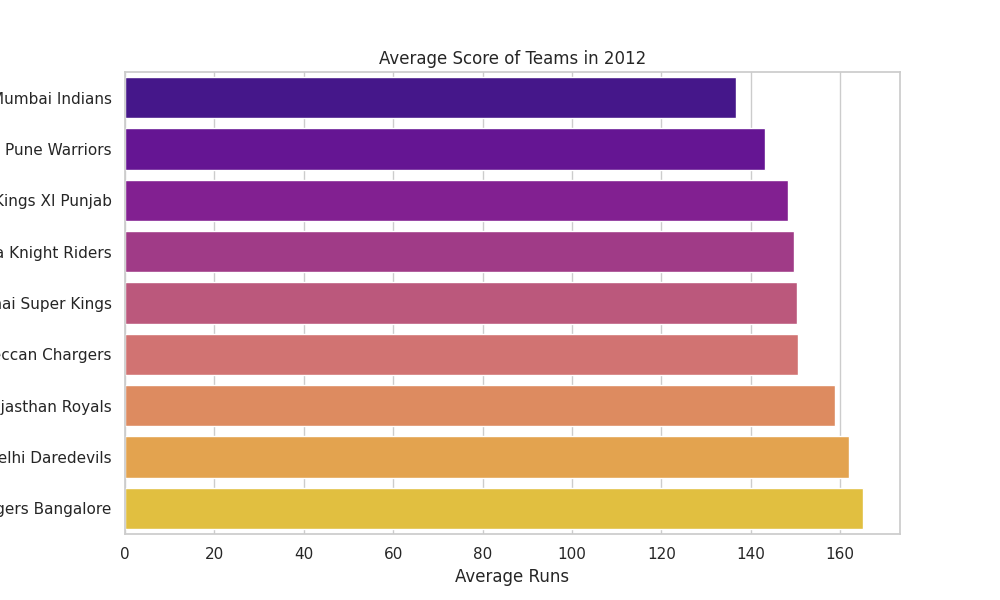

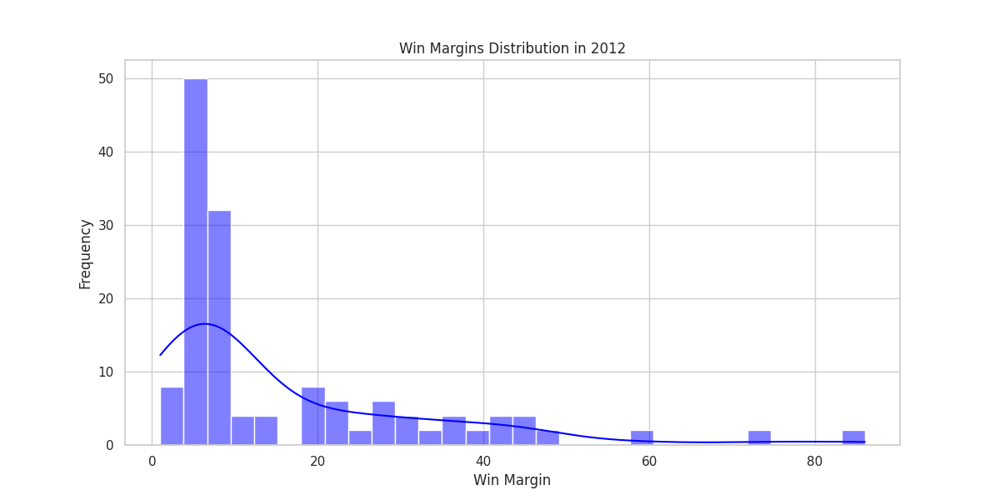


📊 Displaying plots for 2013 season:


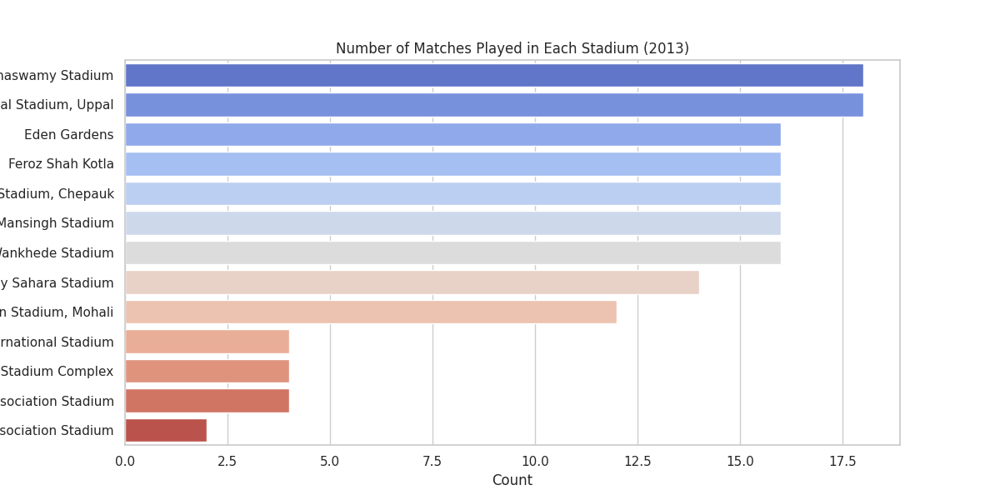

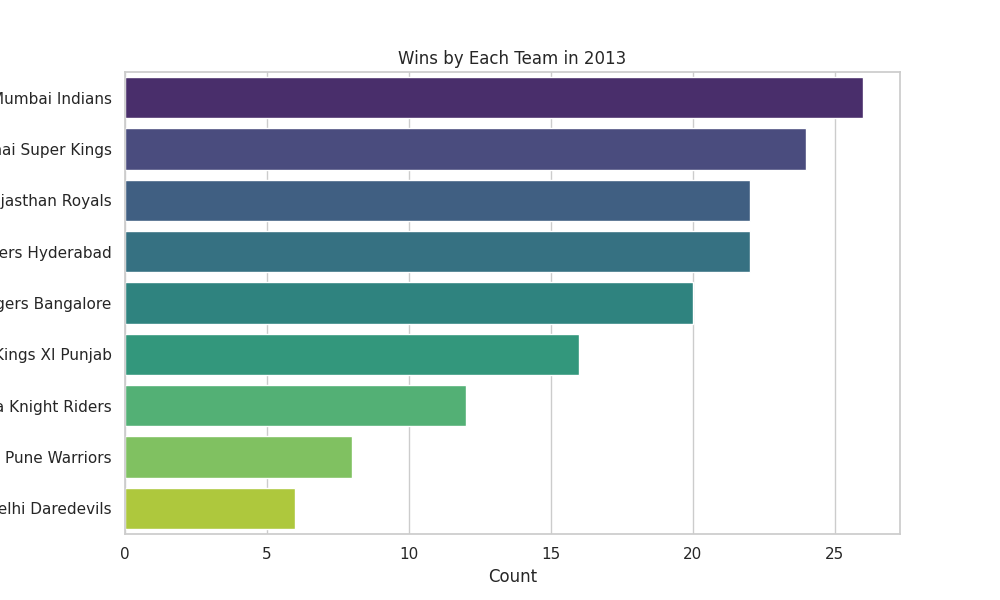

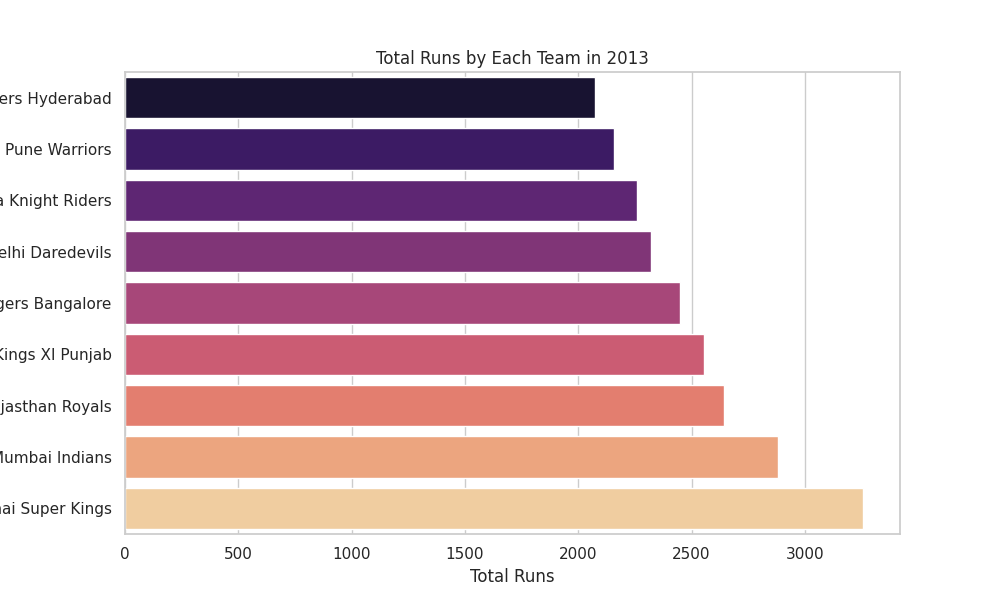

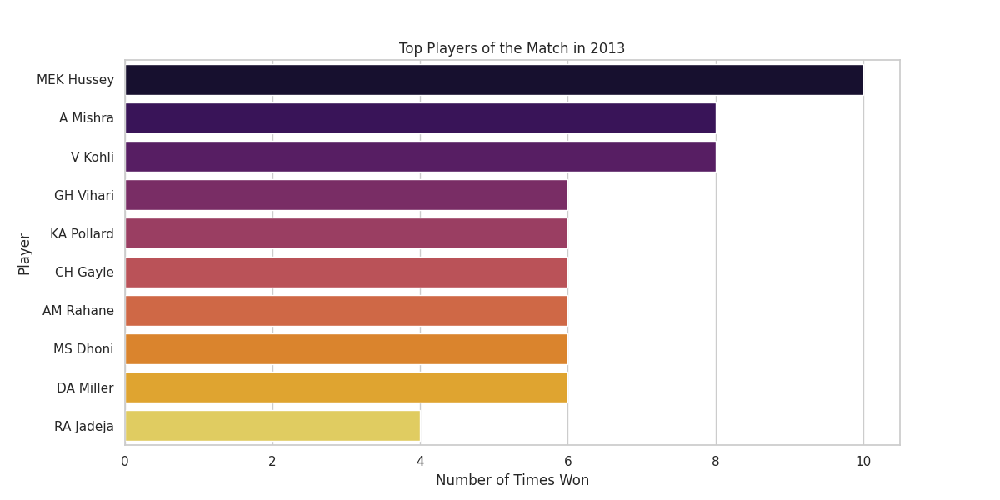

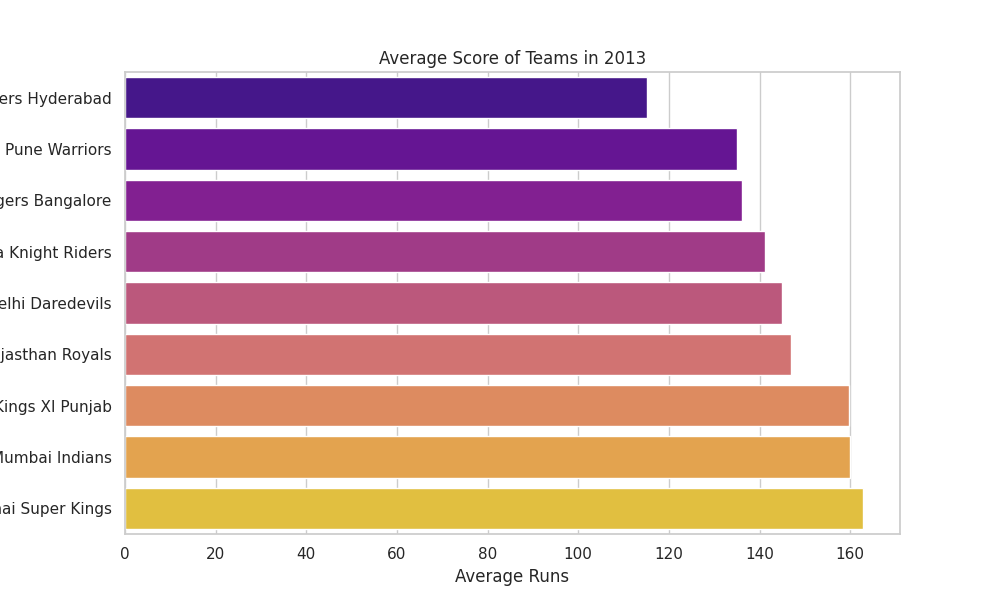

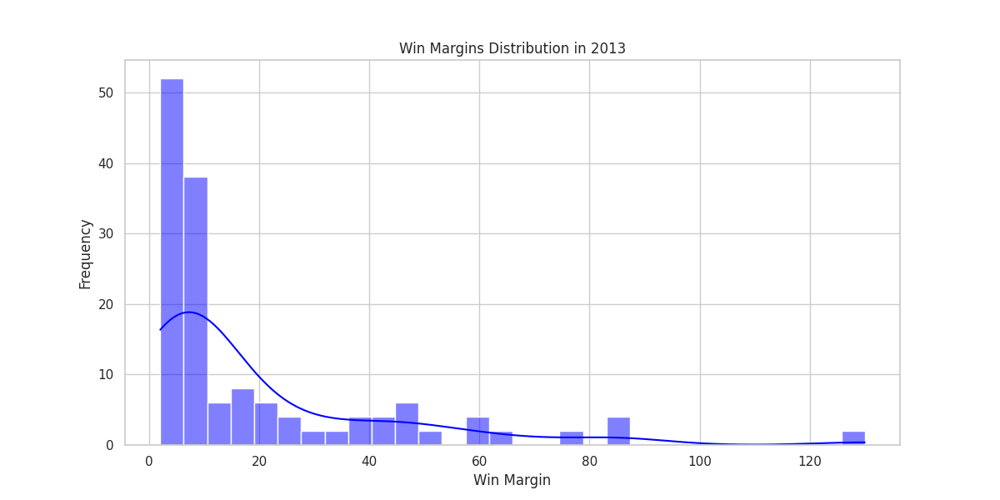


📊 Displaying plots for 2014 season:


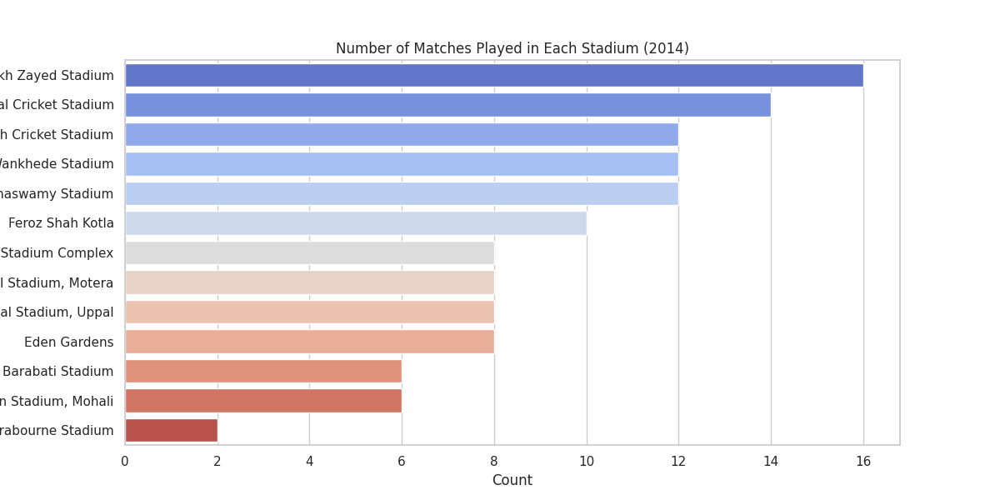

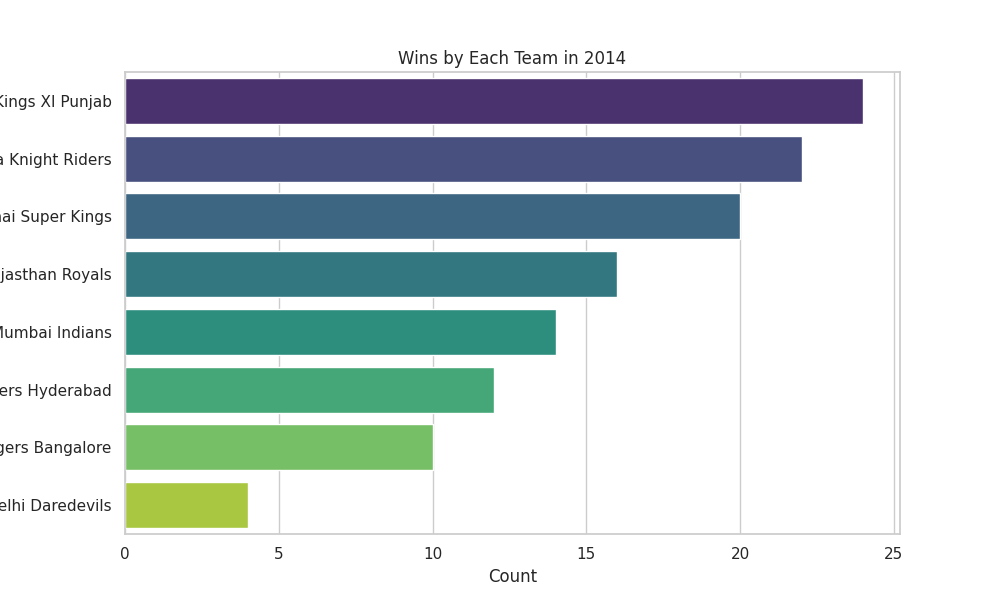

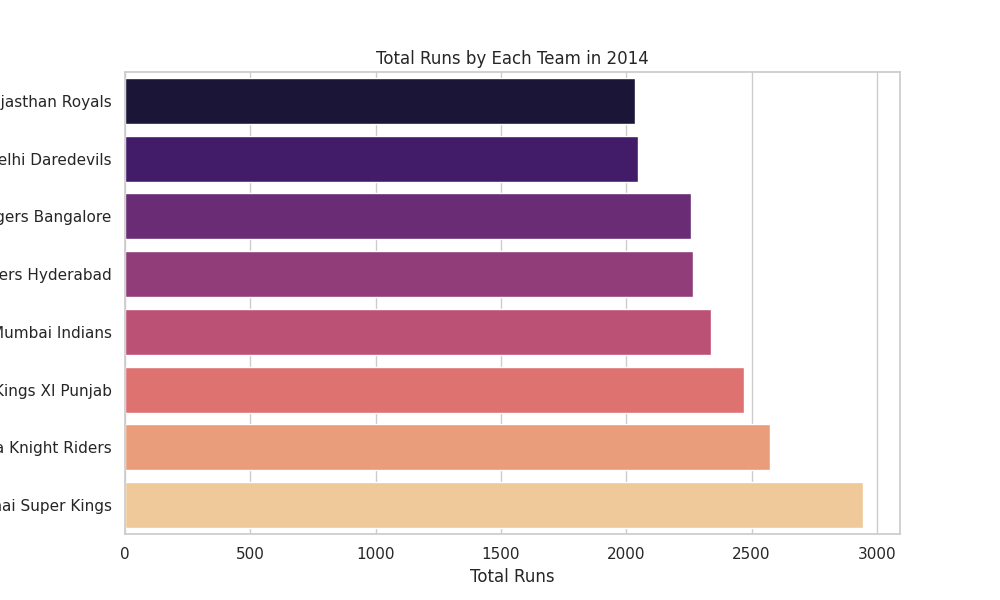

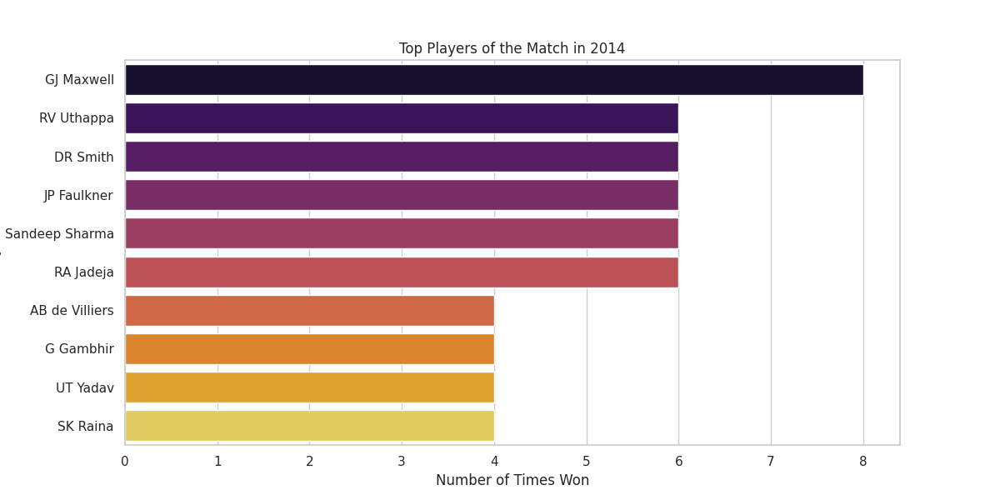

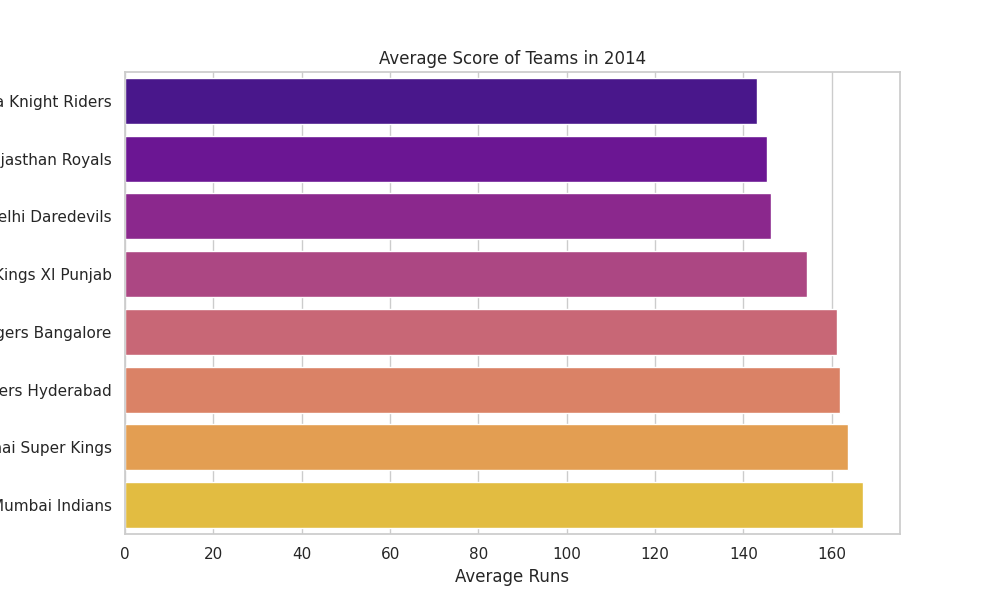

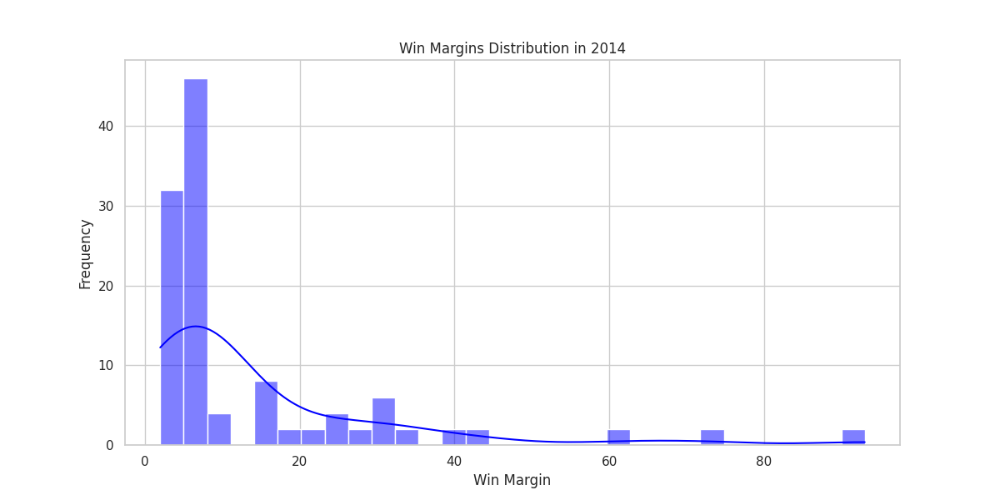


📊 Displaying plots for 2015 season:


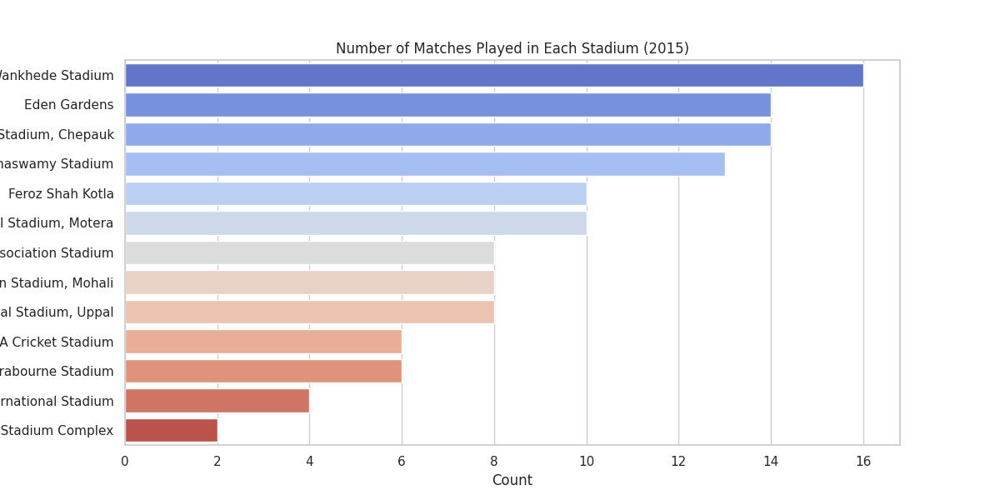

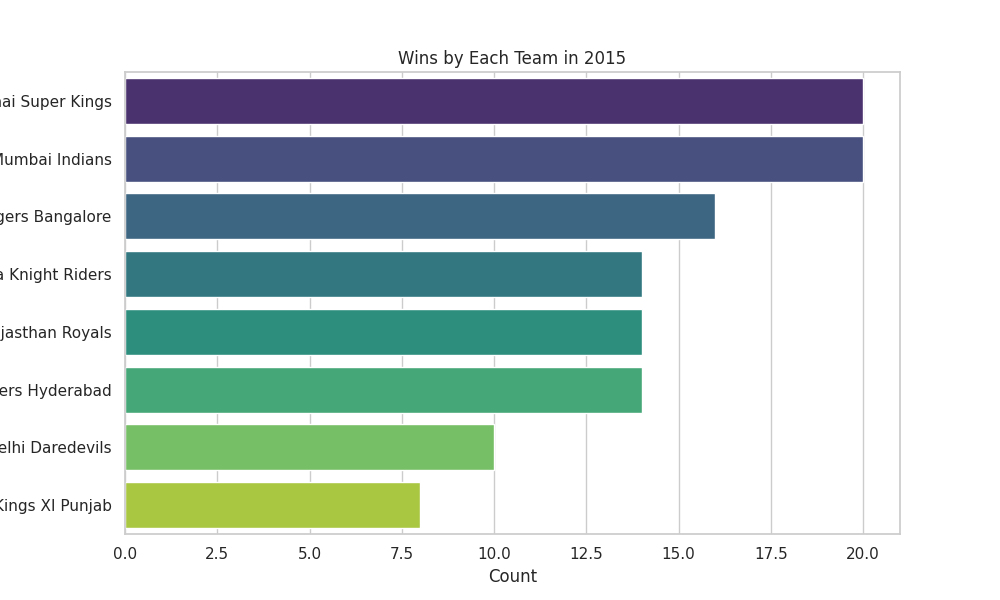

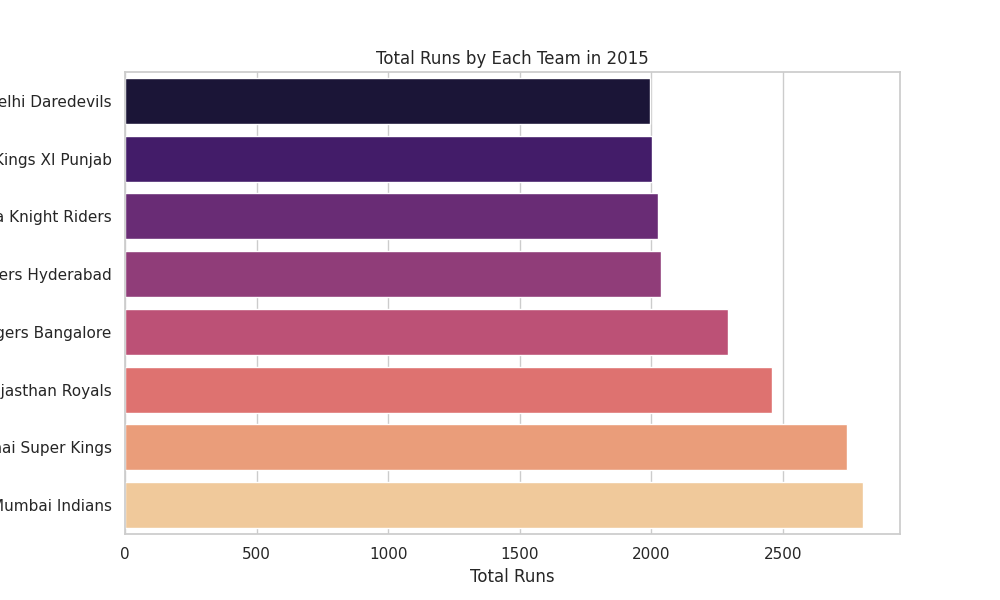

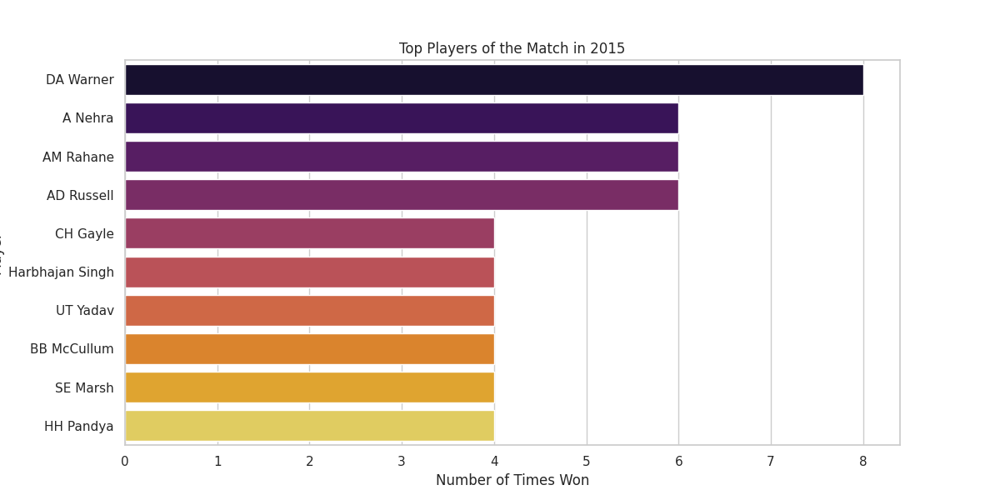

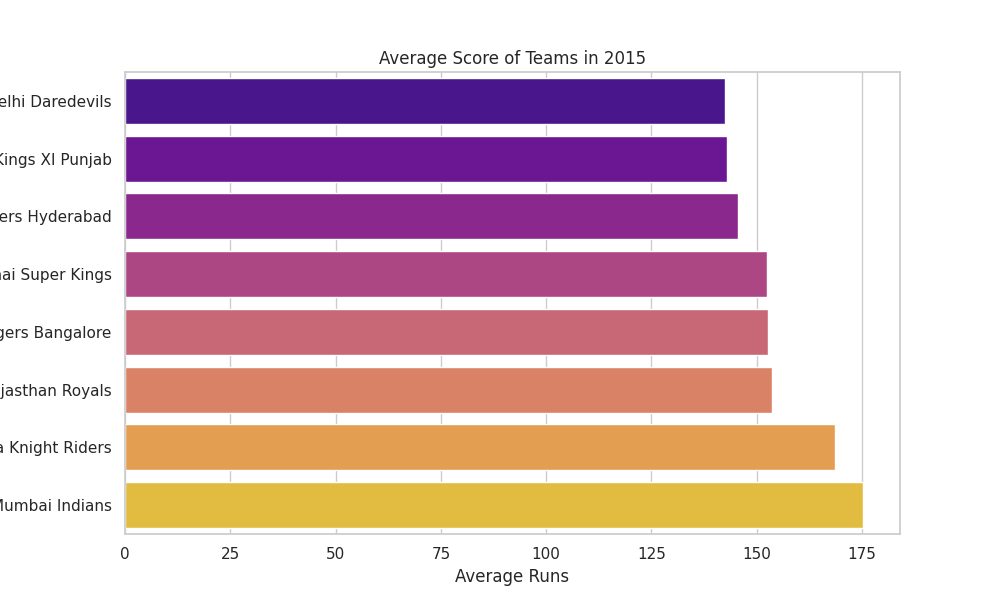

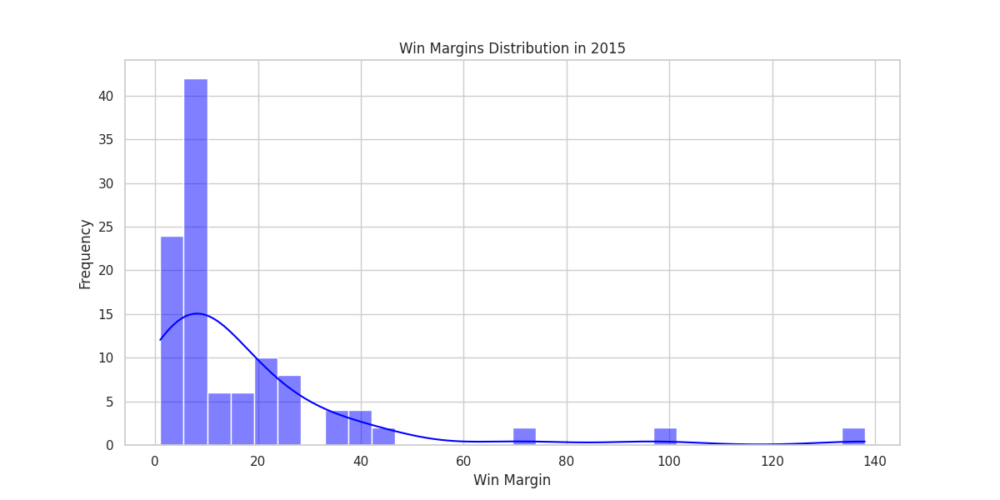


📊 Displaying plots for 2016 season:


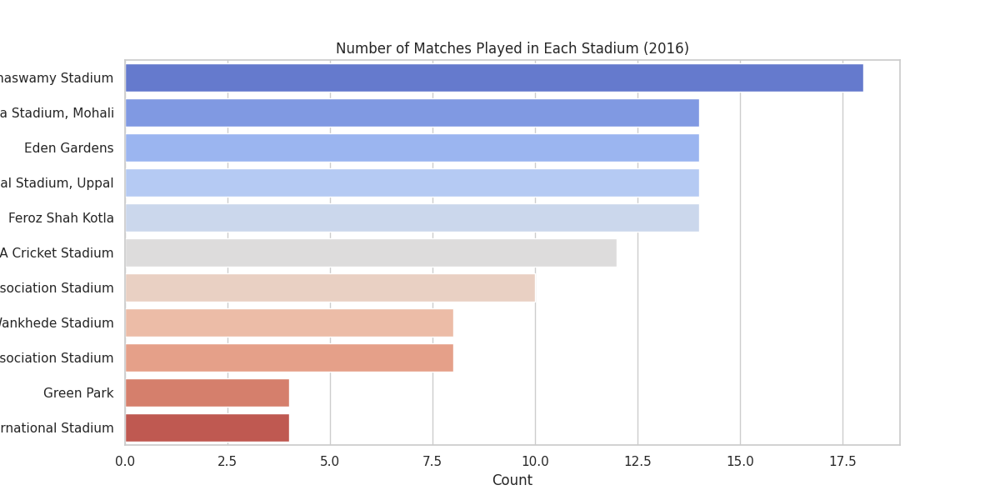

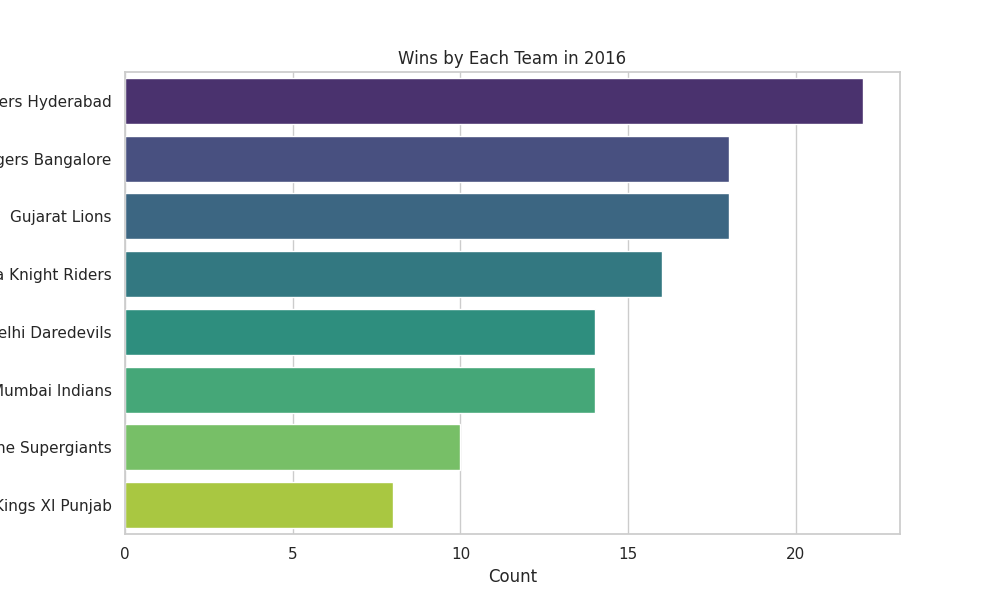

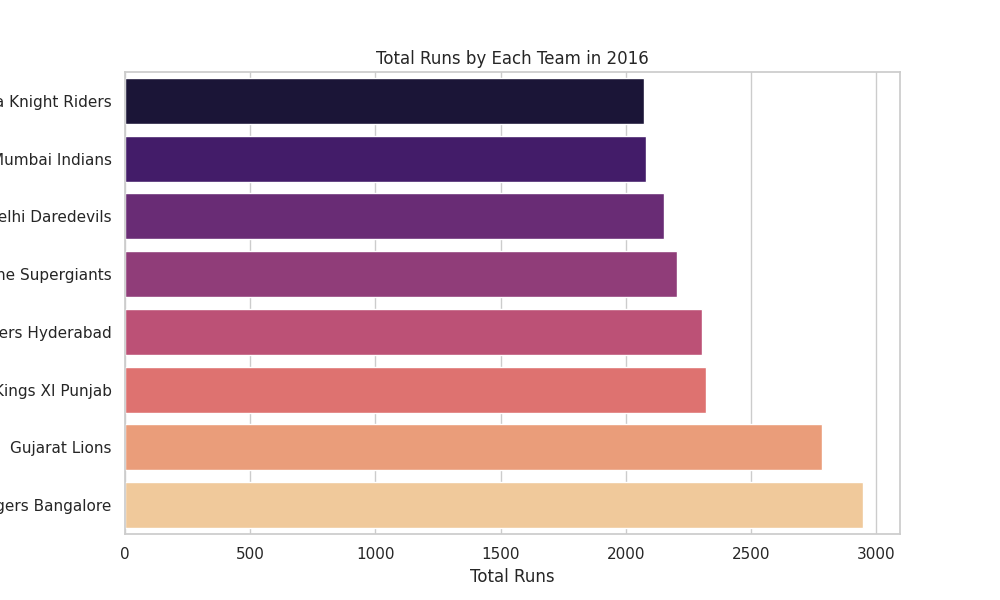

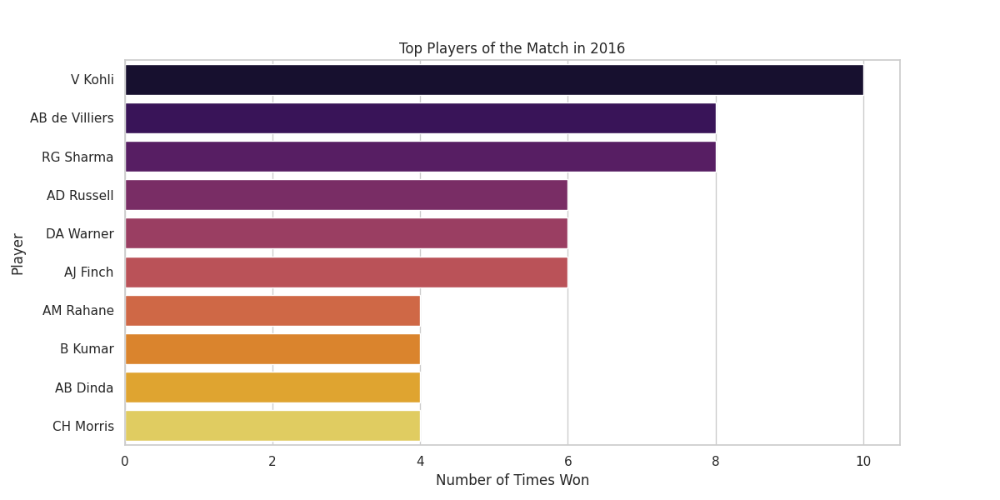

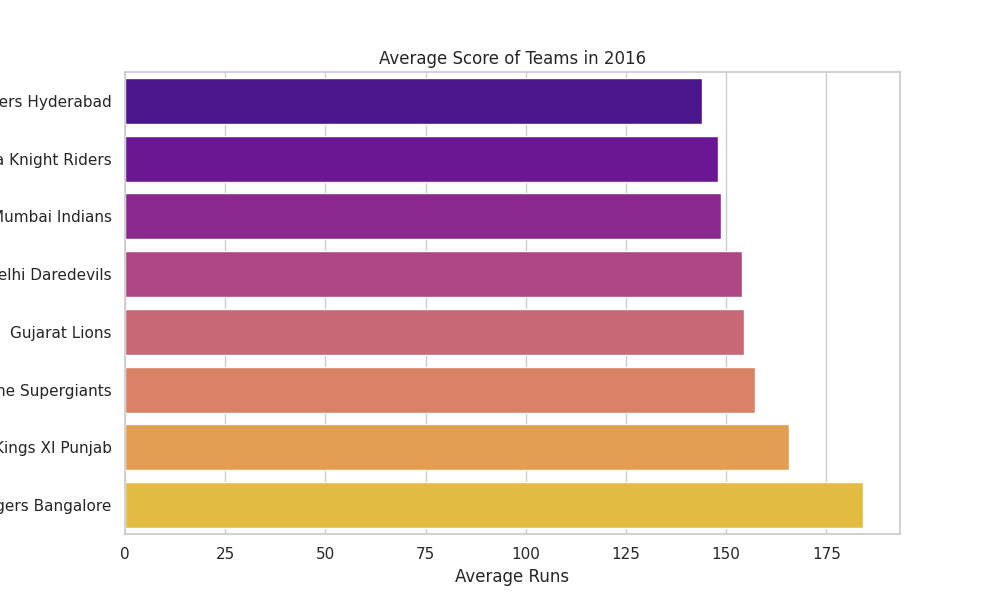

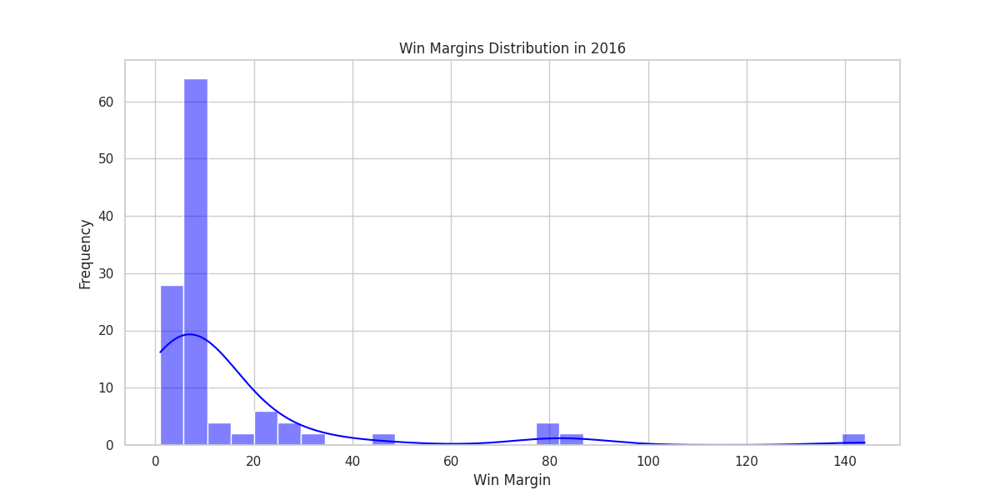


📊 Displaying plots for 2017 season:


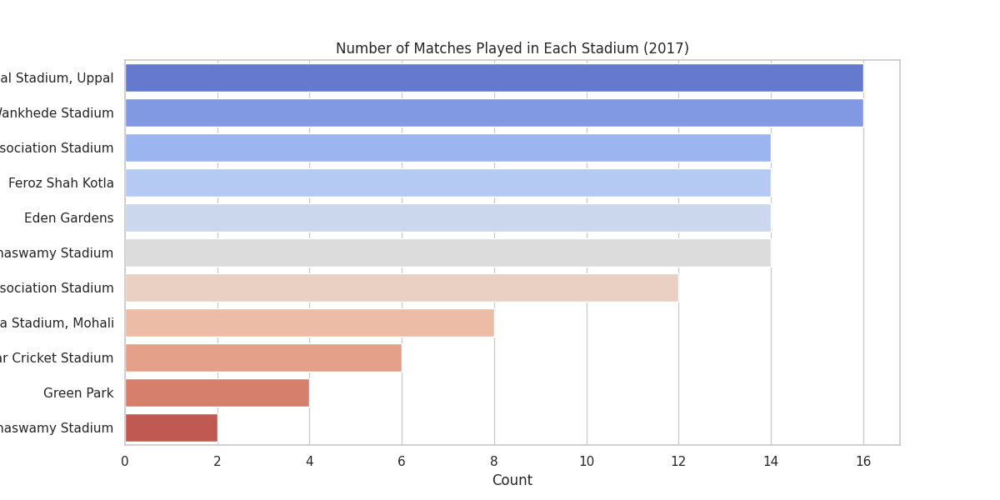

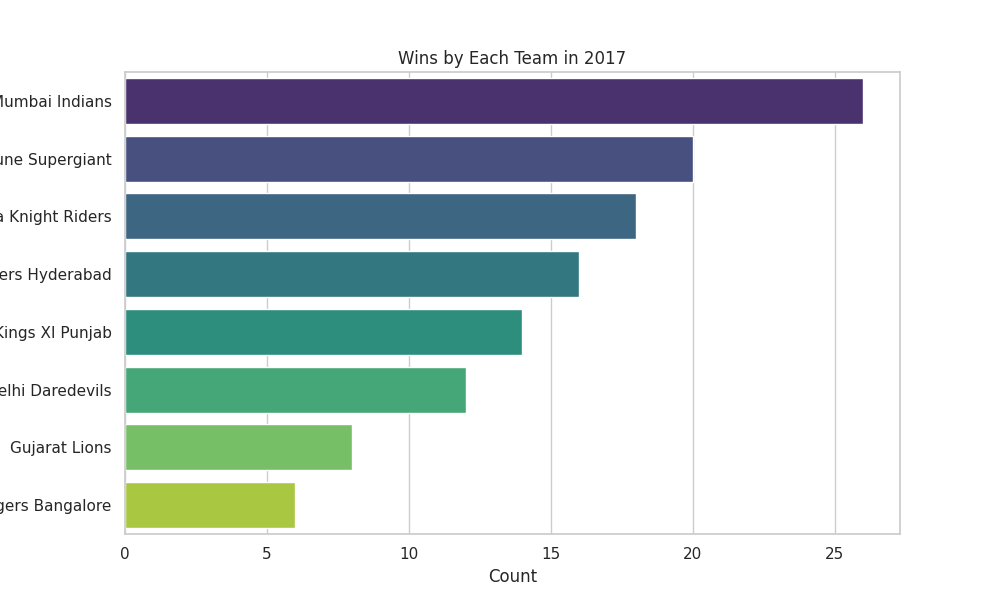

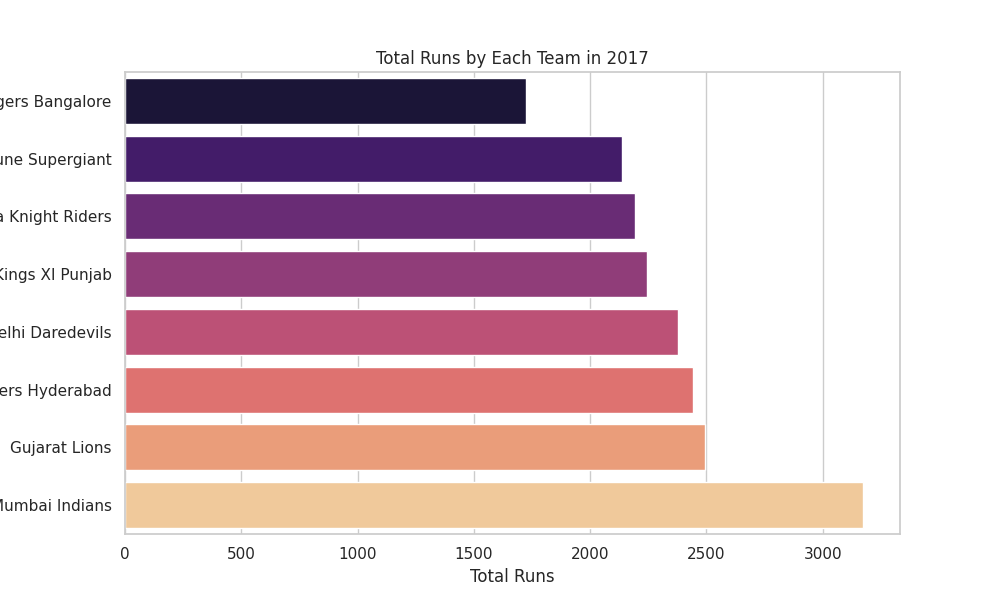

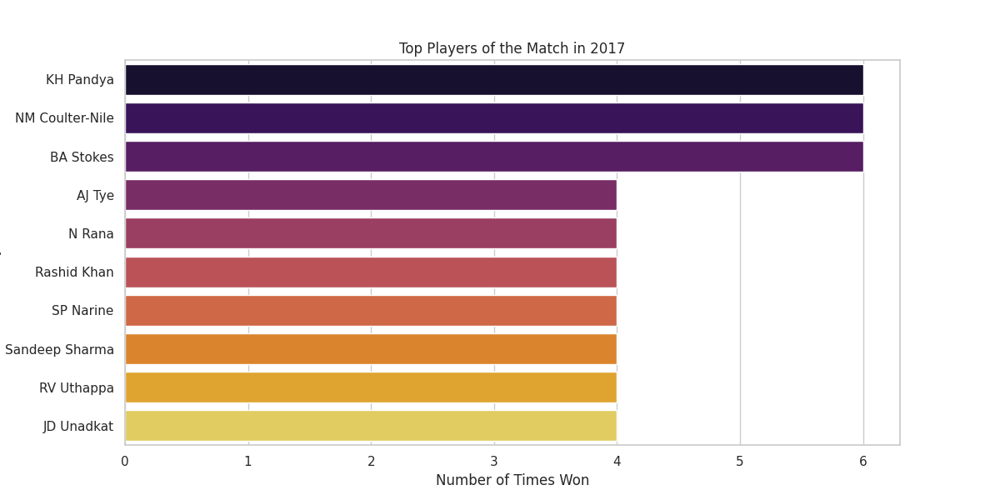

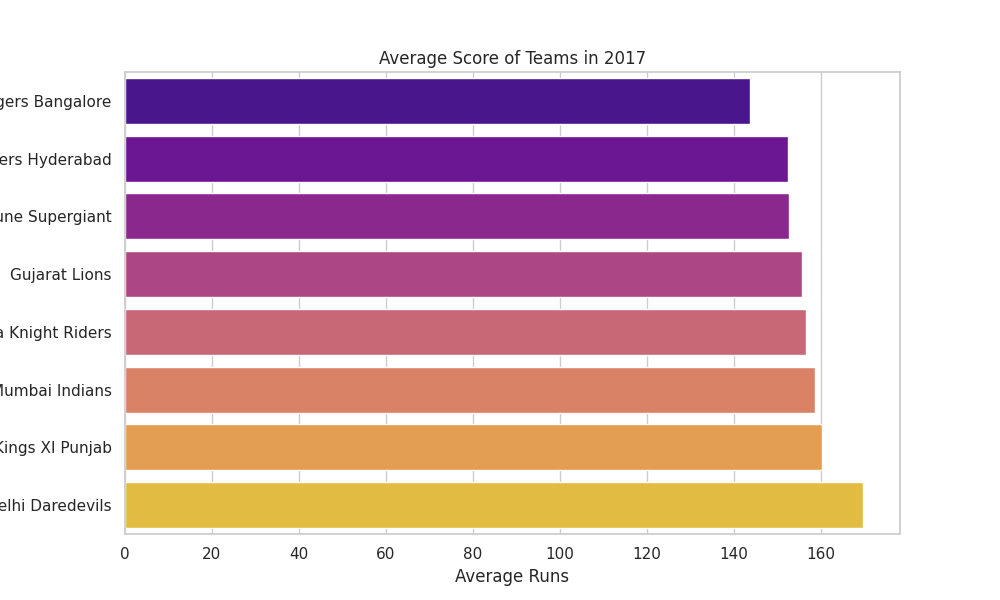

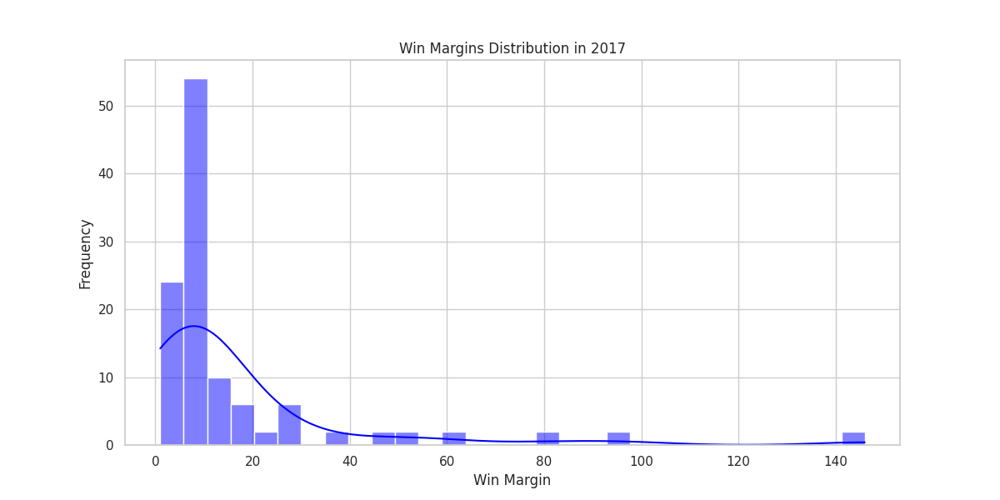


📊 Displaying plots for 2018 season:


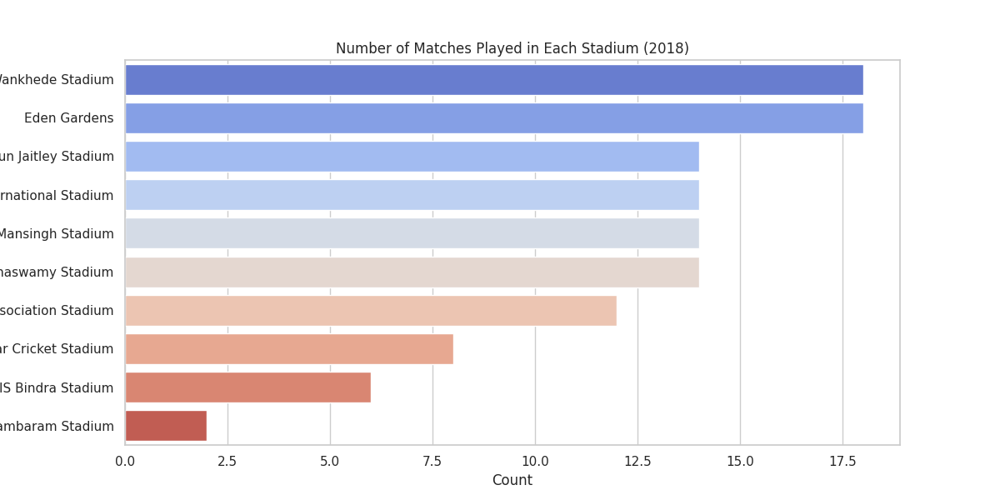

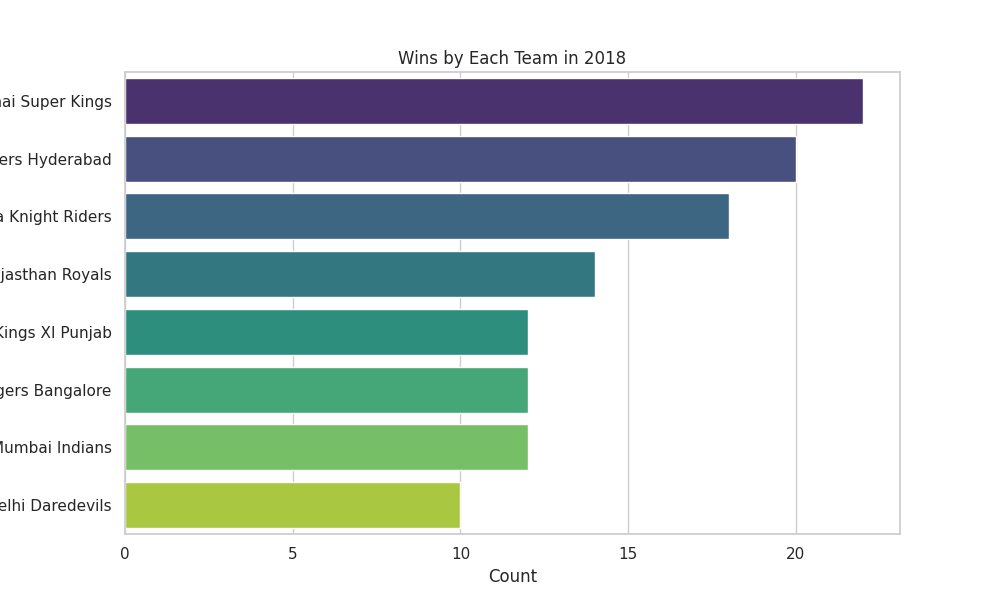

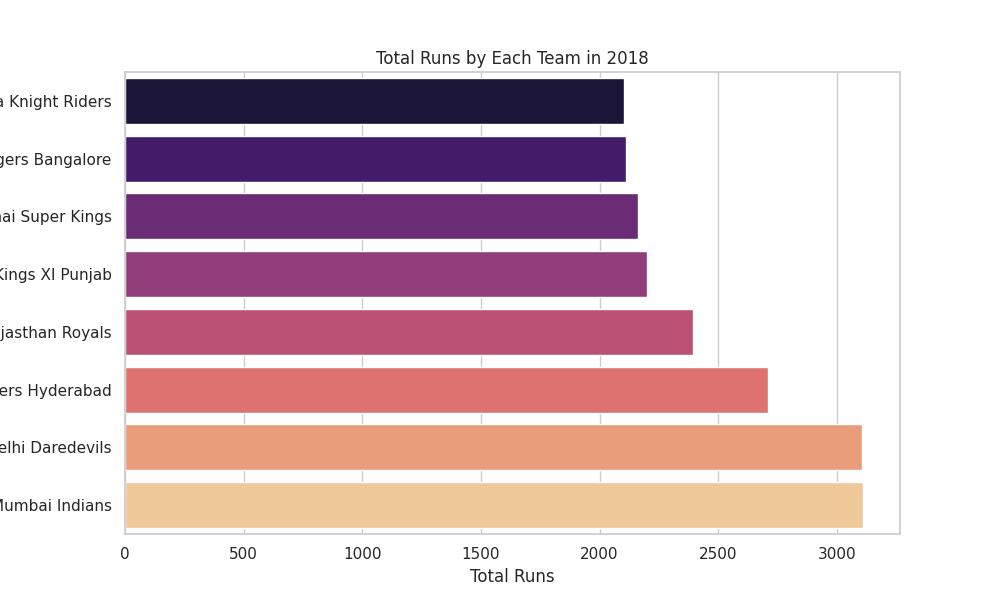

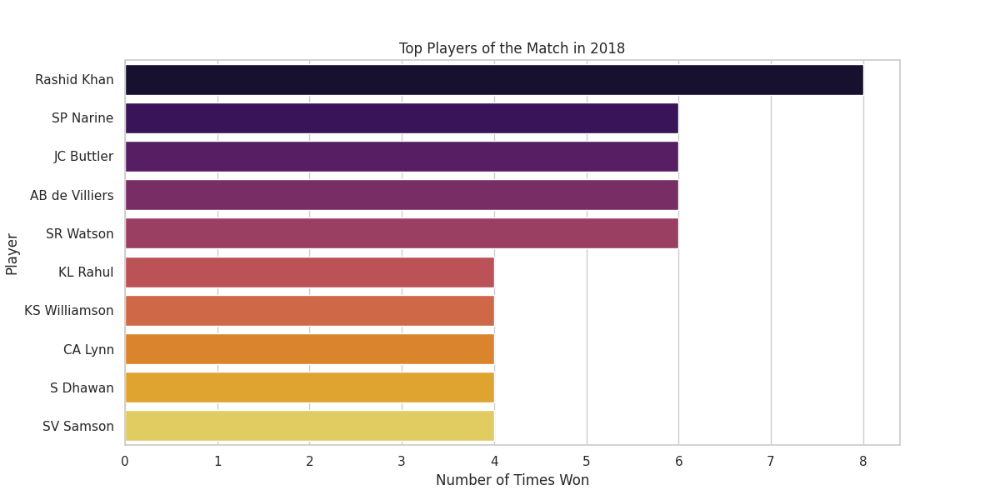

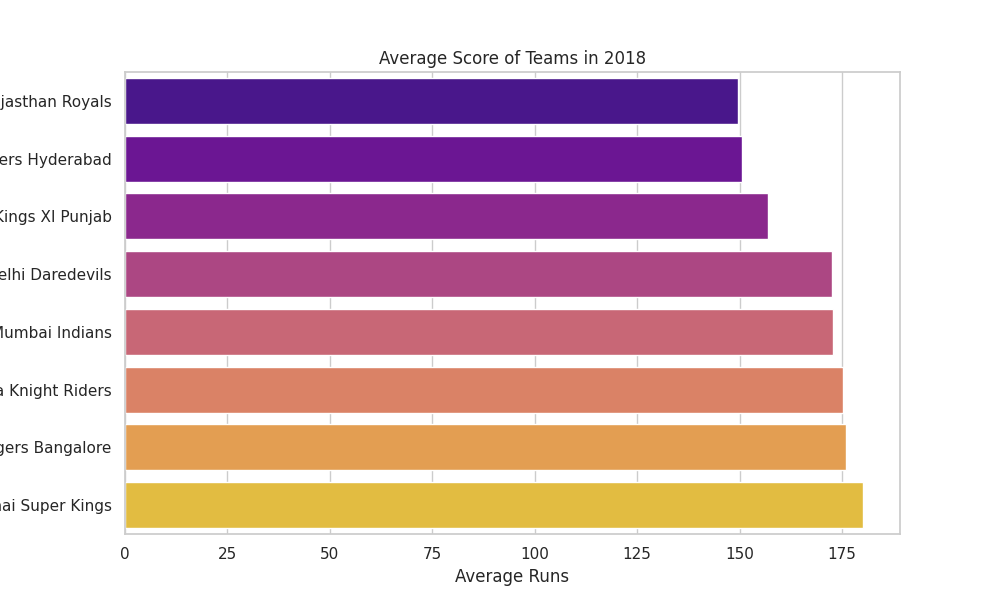

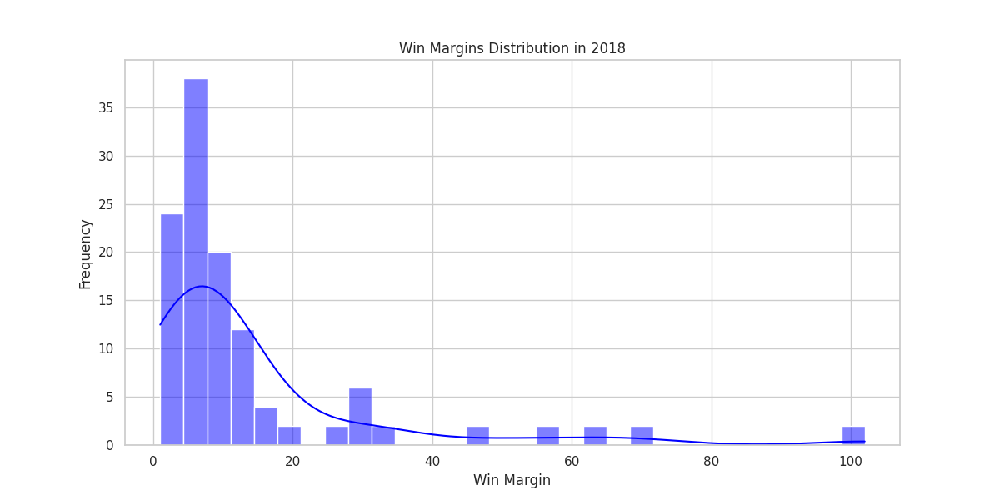


📊 Displaying plots for 2019 season:


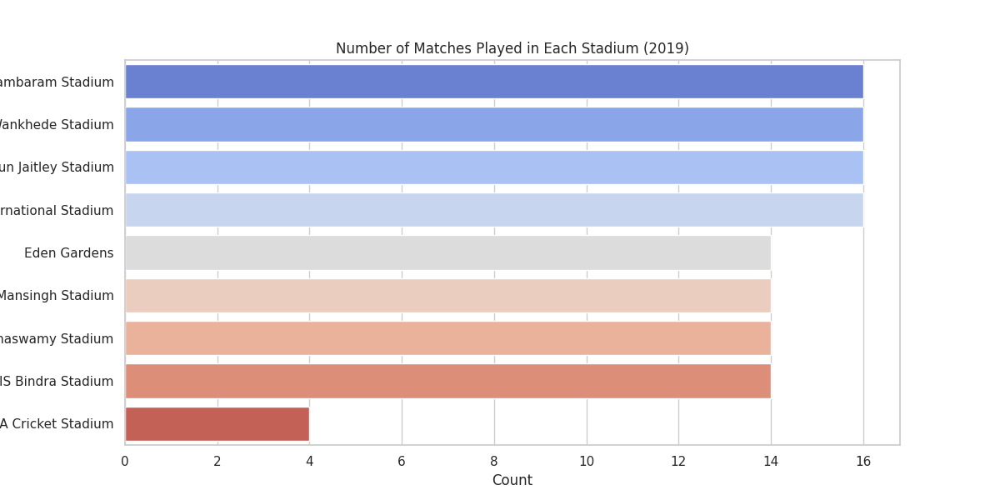

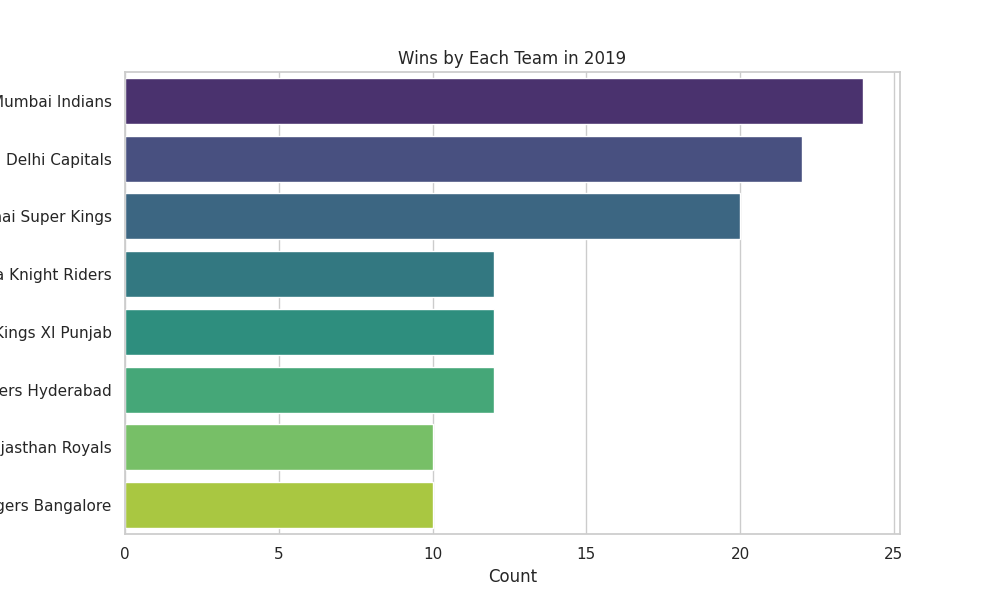

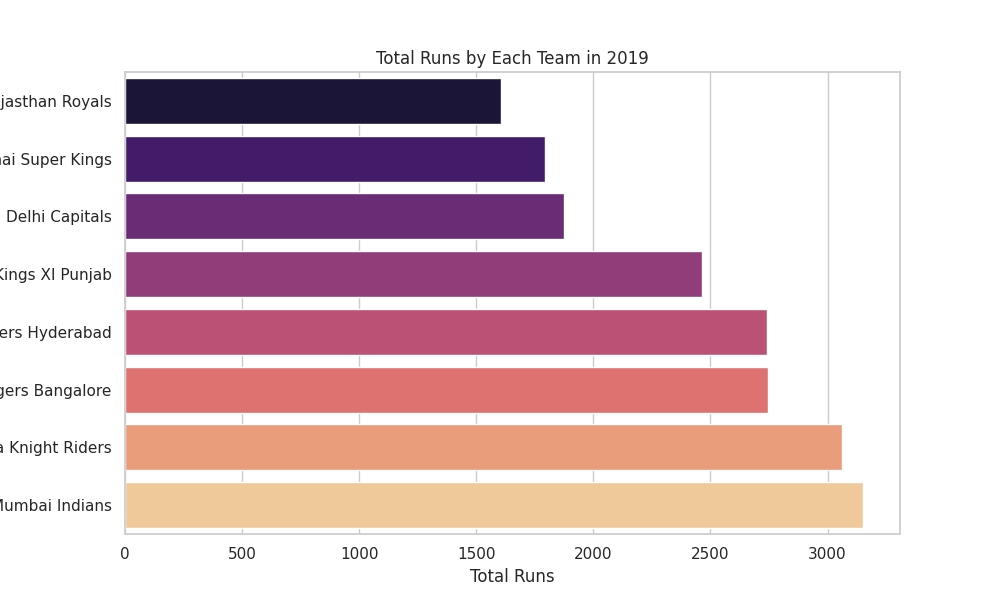

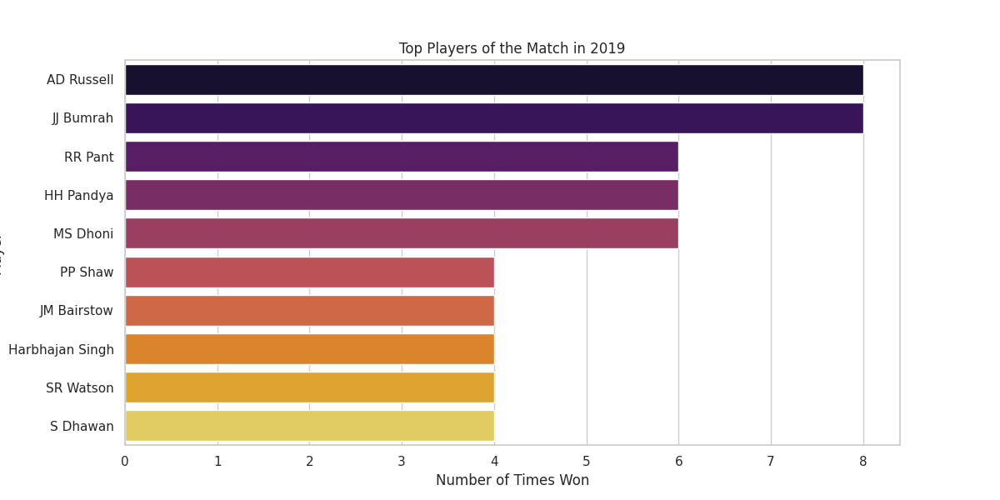

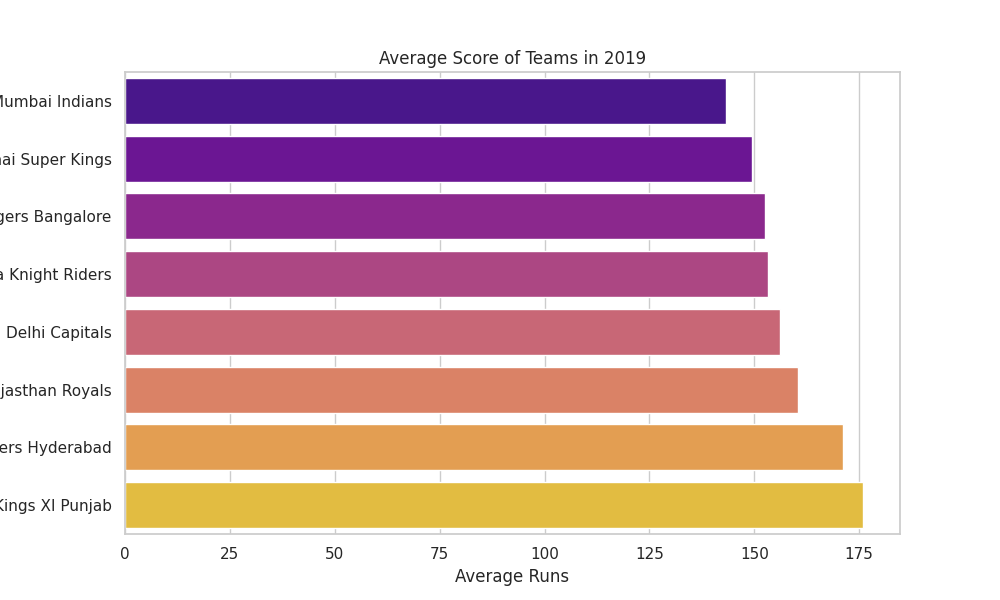

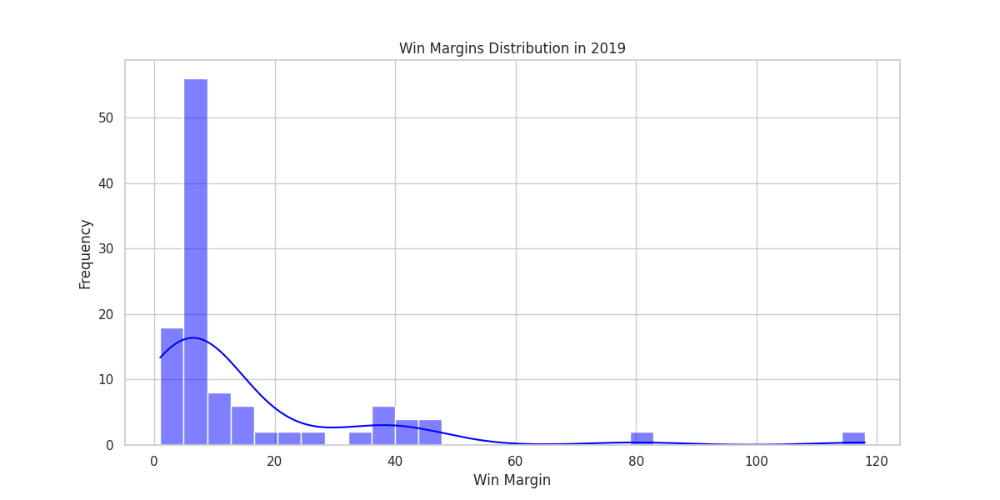


📊 Displaying plots for 2020_21 season:


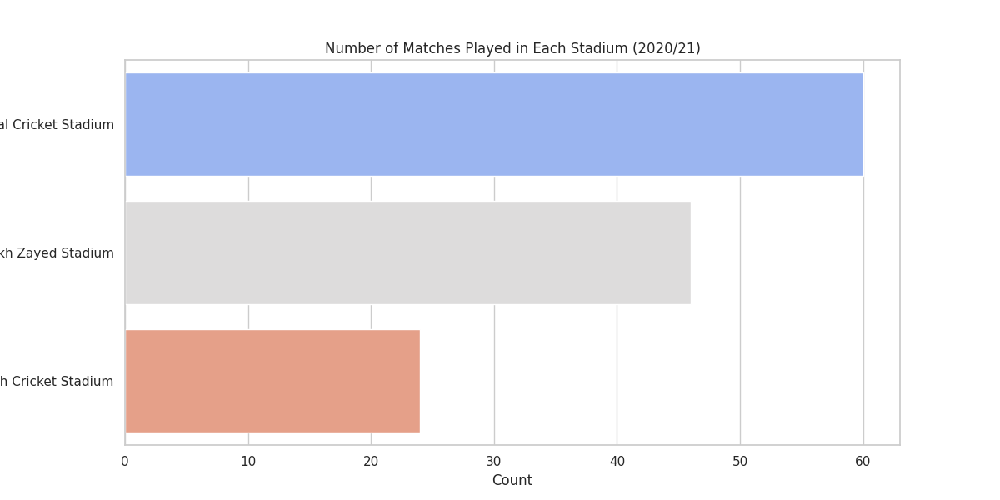

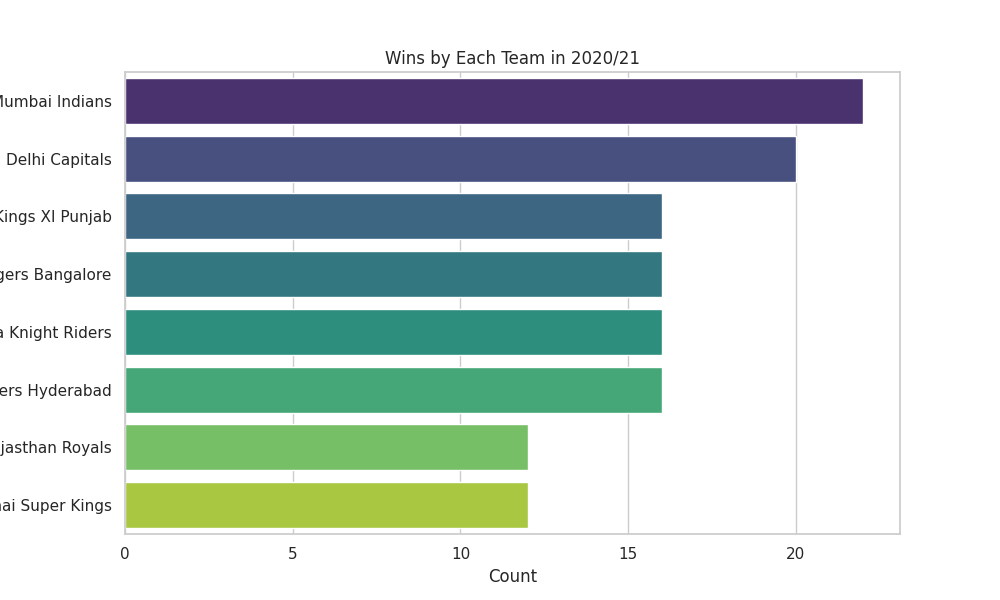

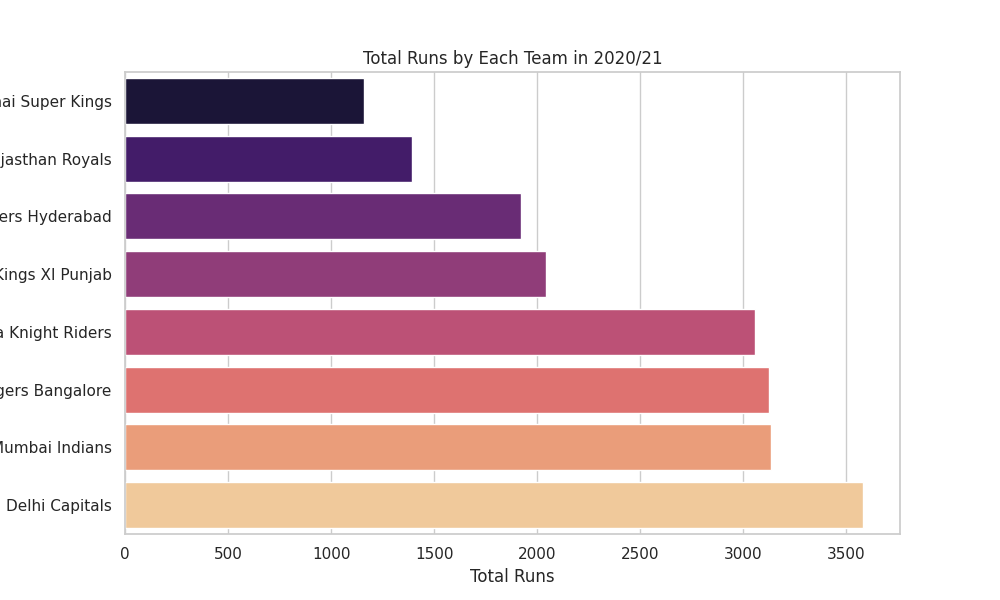

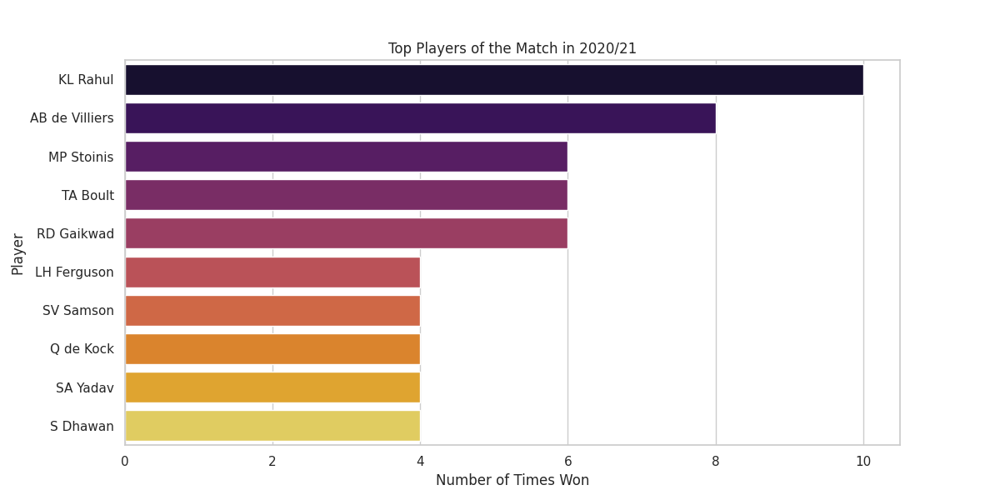

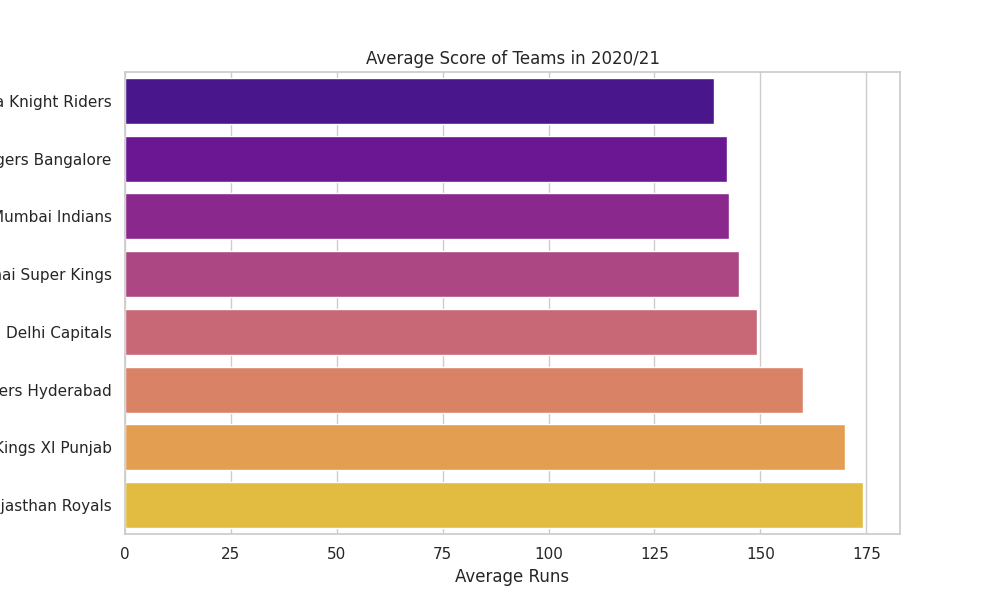

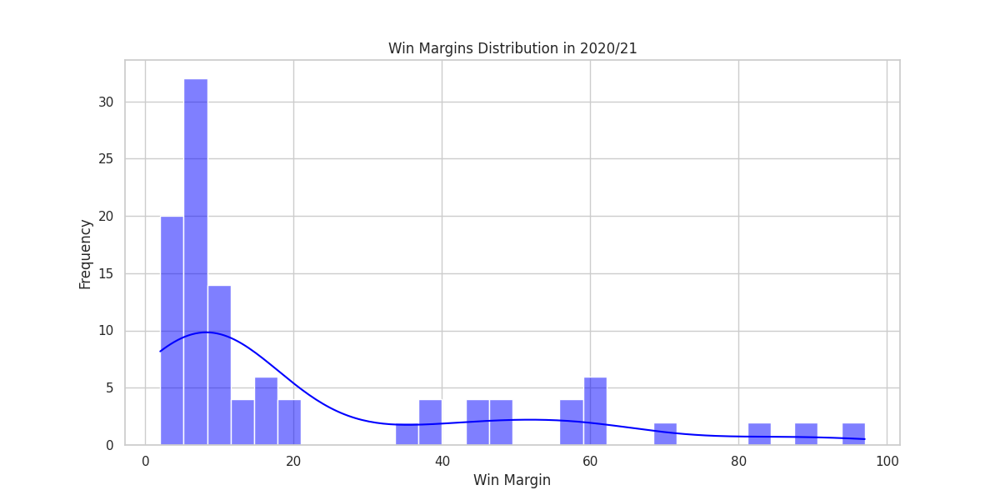


📊 Displaying plots for 2021 season:


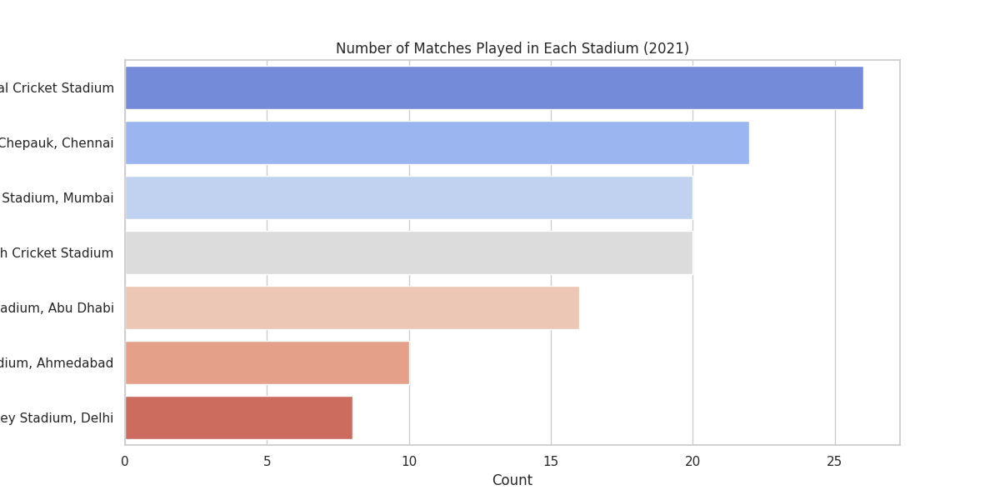

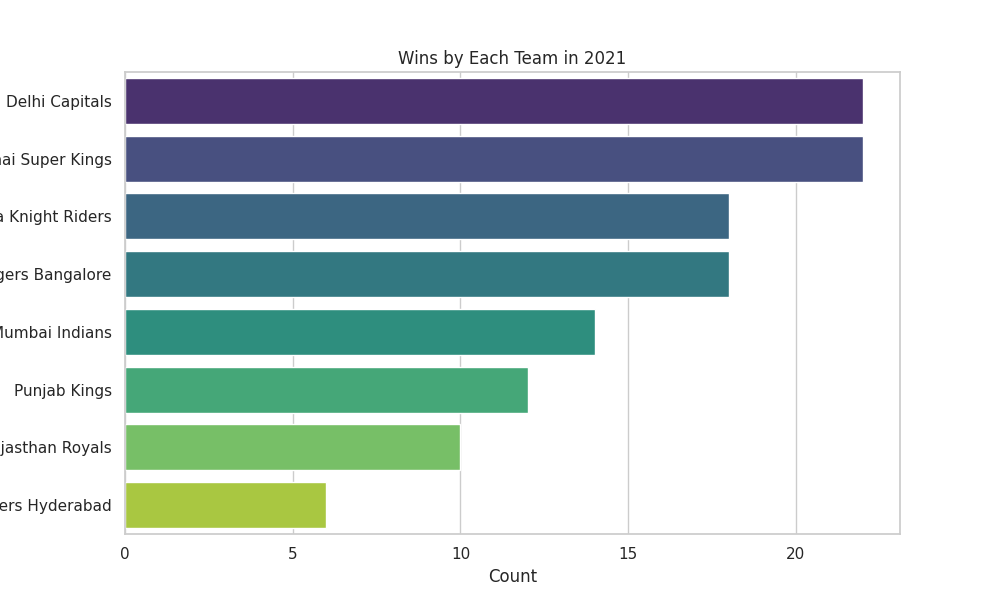

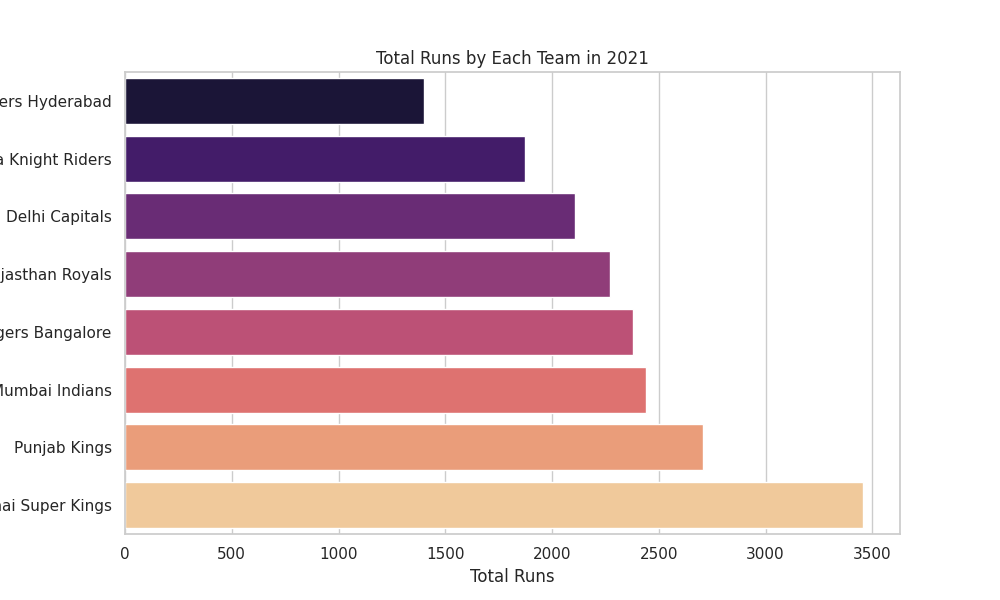

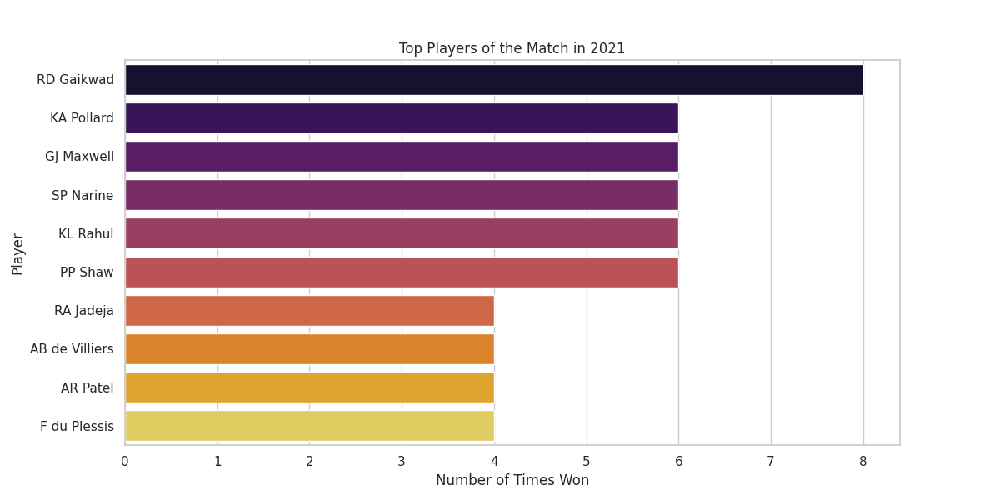

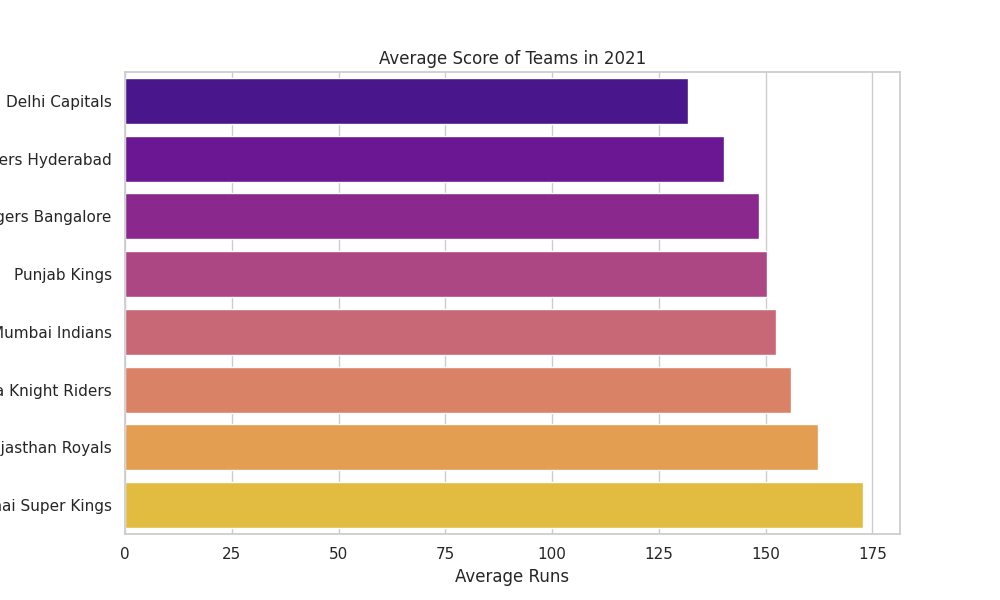

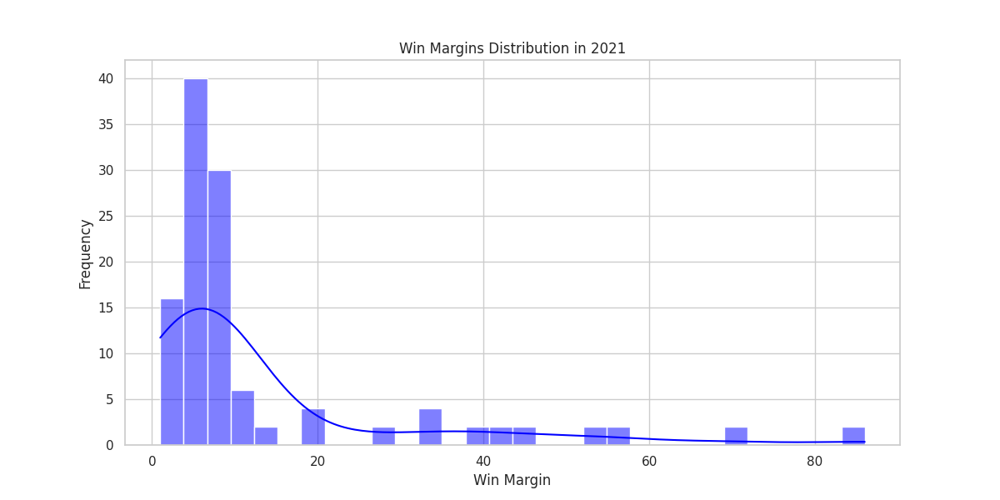


📊 Displaying plots for 2022 season:


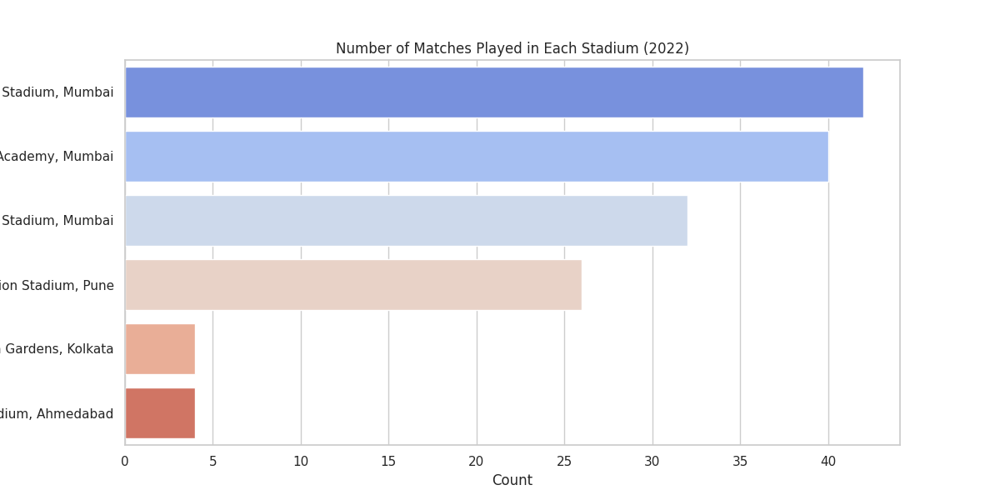

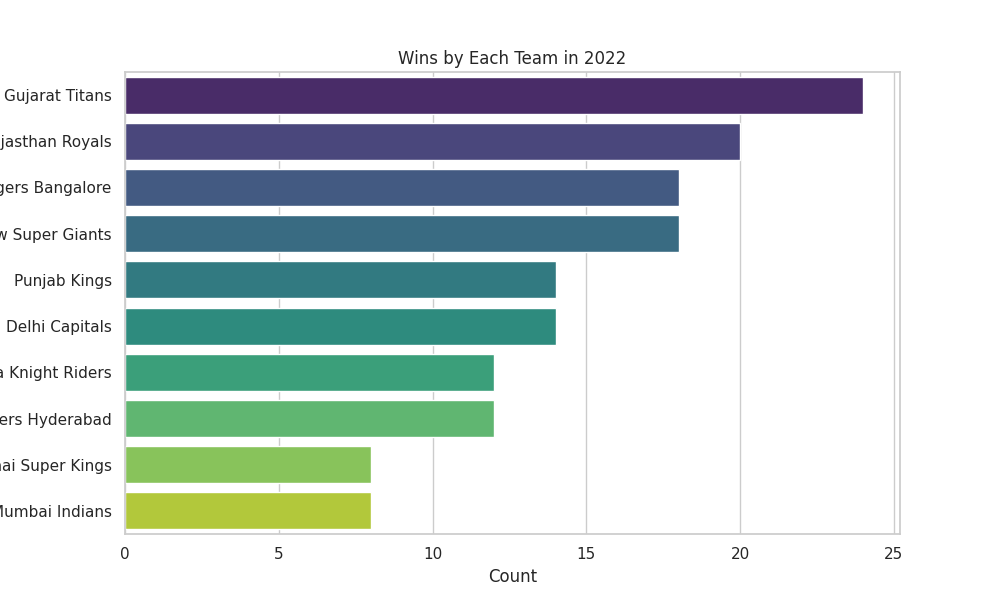

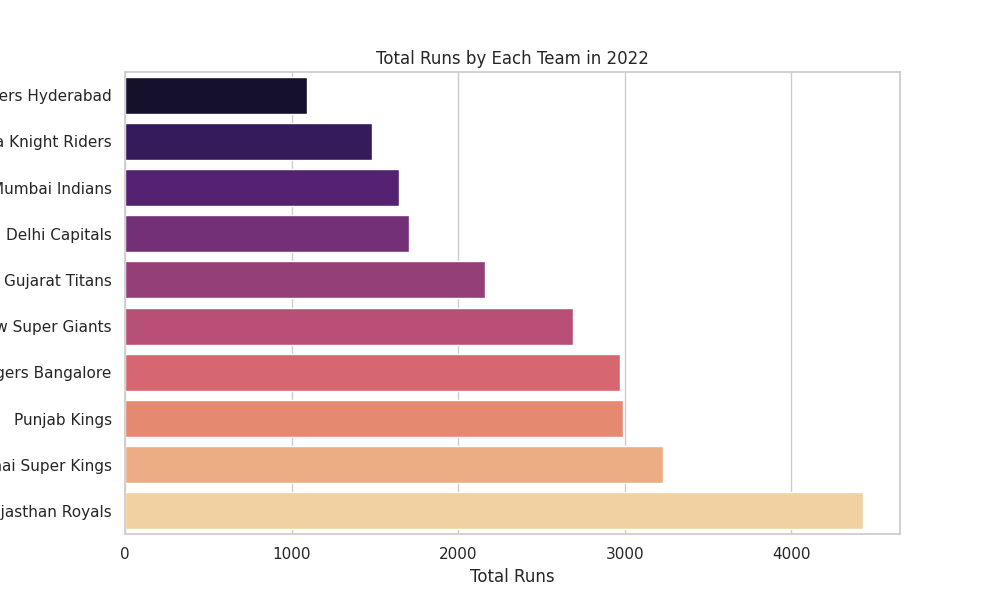

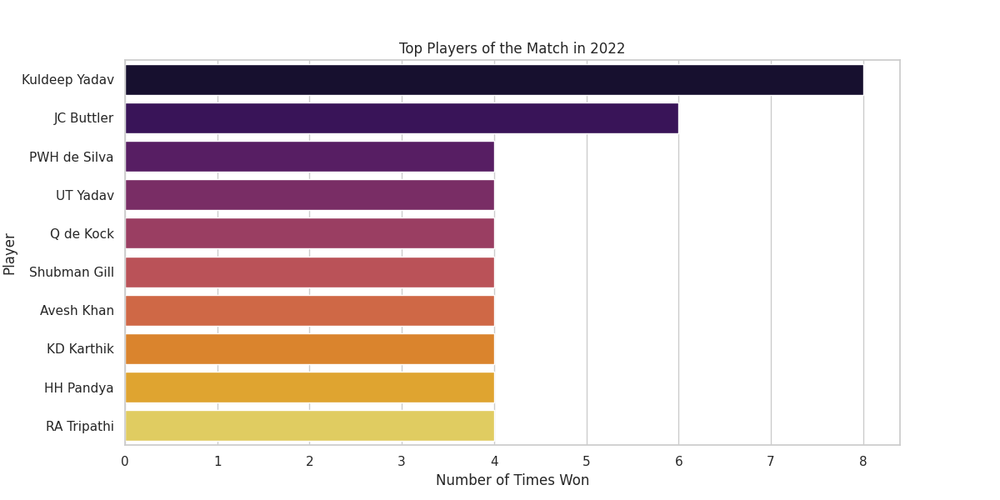

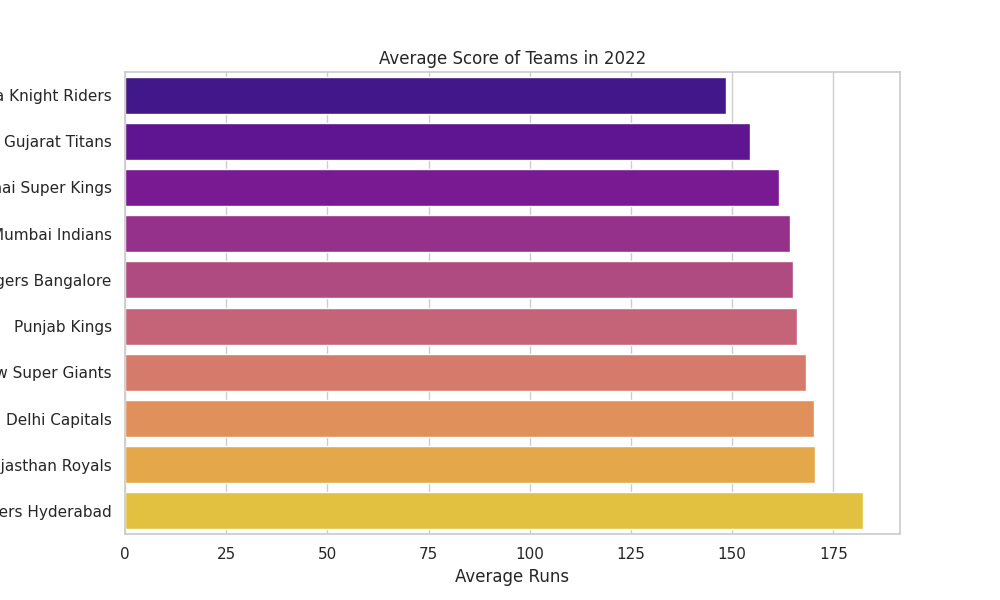

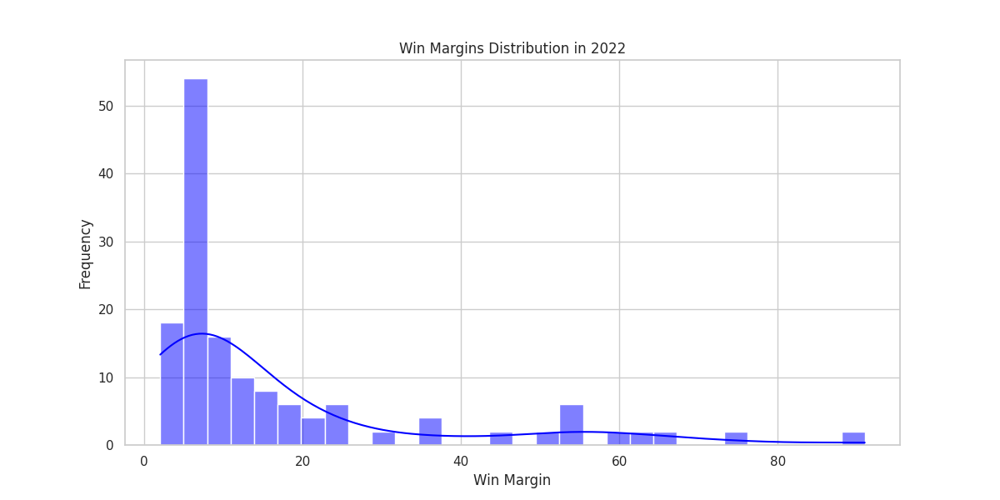


📊 Displaying plots for 2023 season:


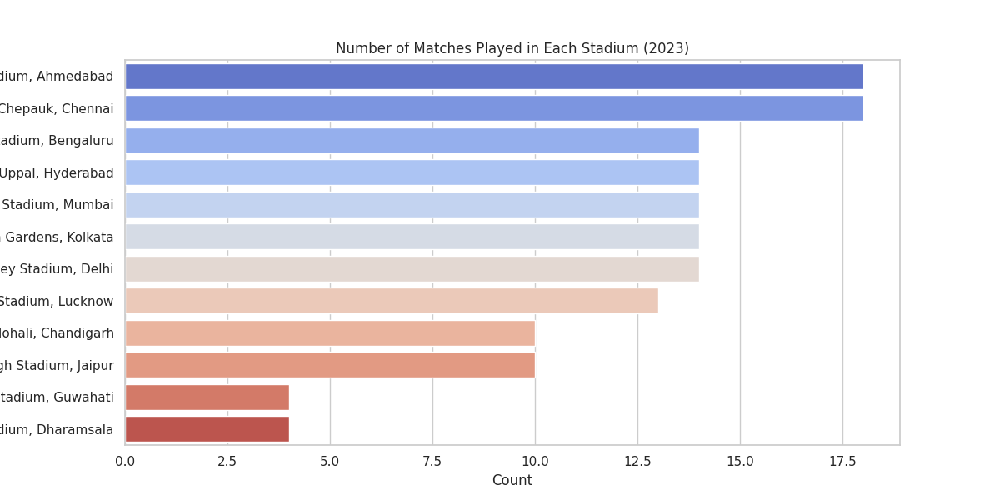

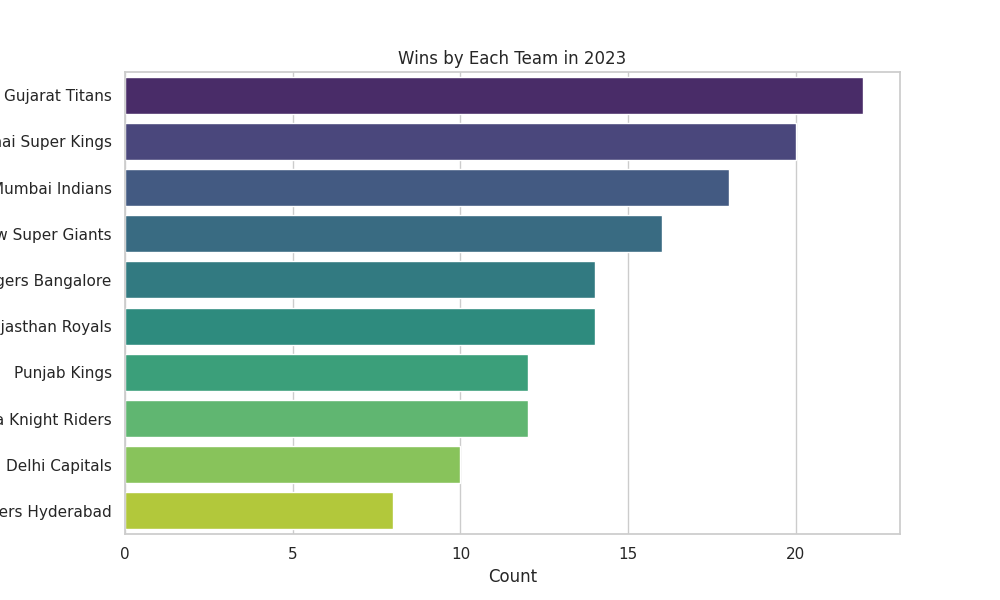

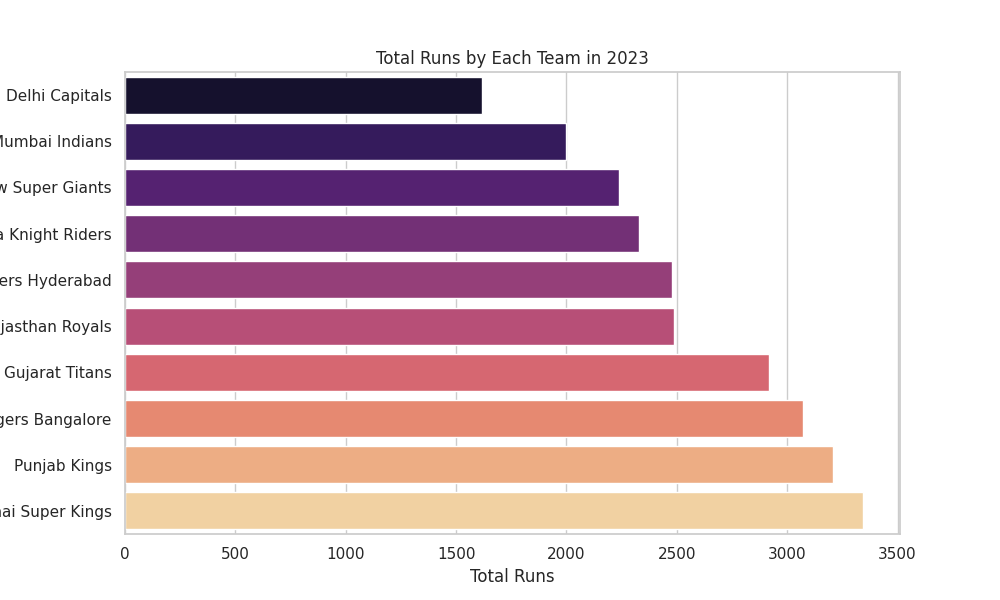

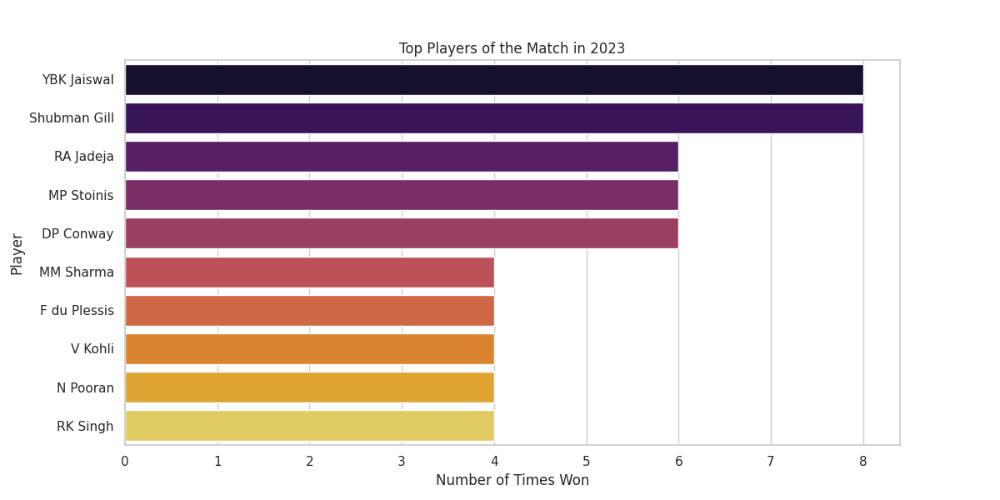

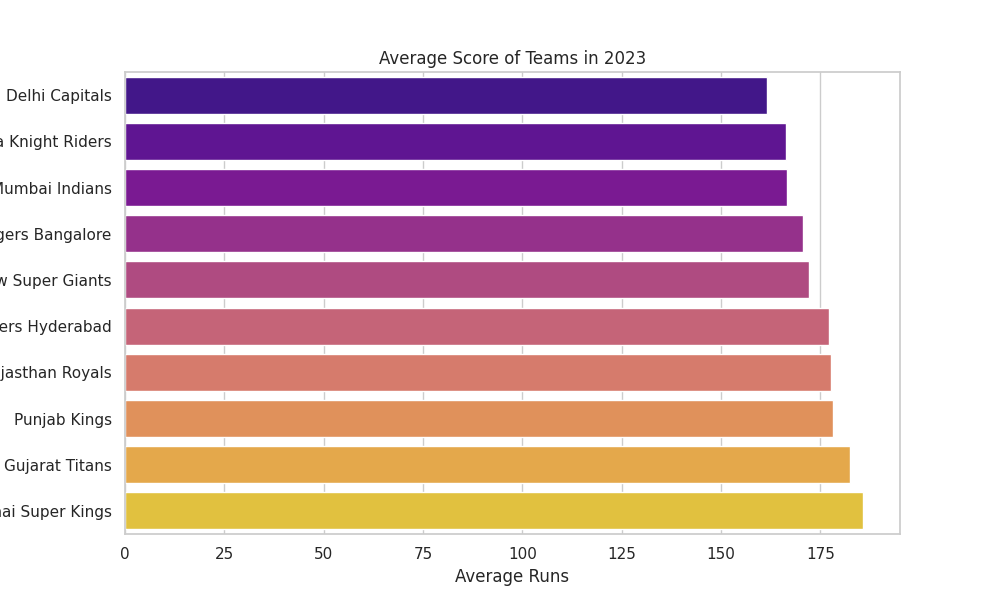

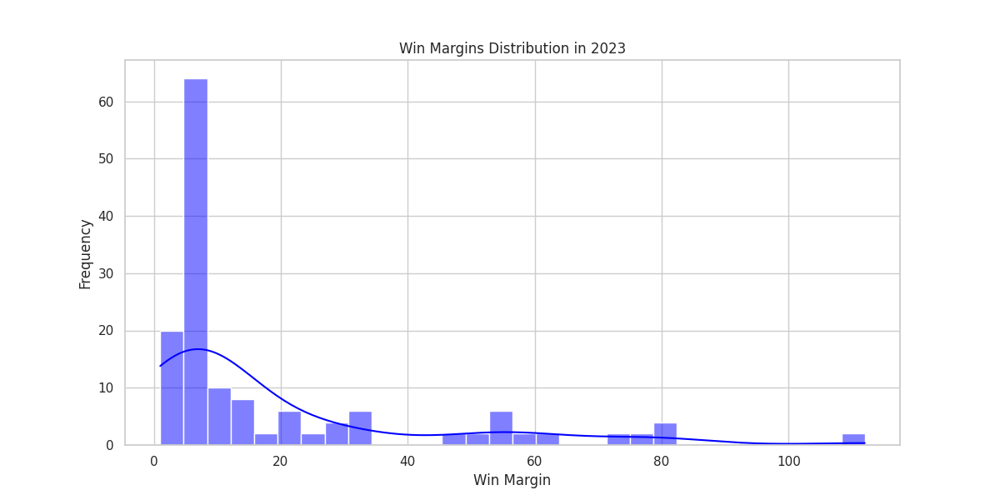


📊 Displaying plots for 2024 season:


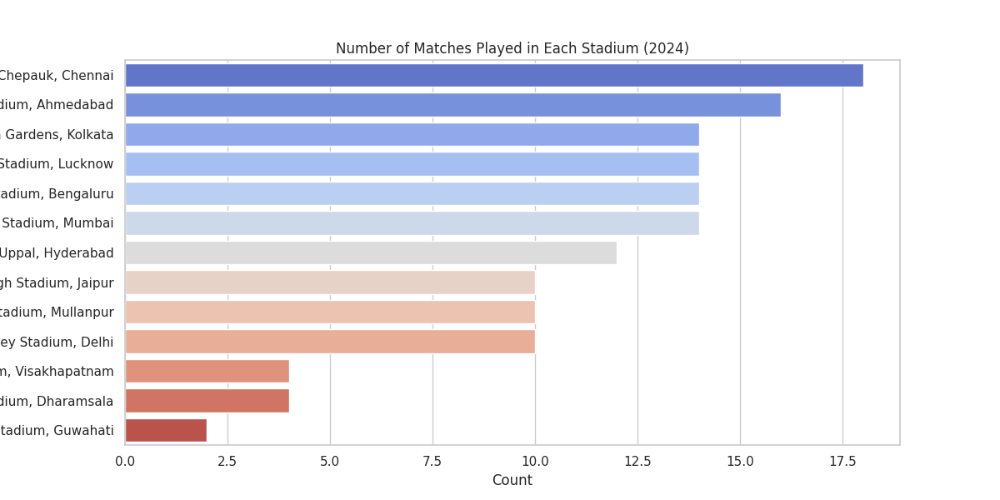

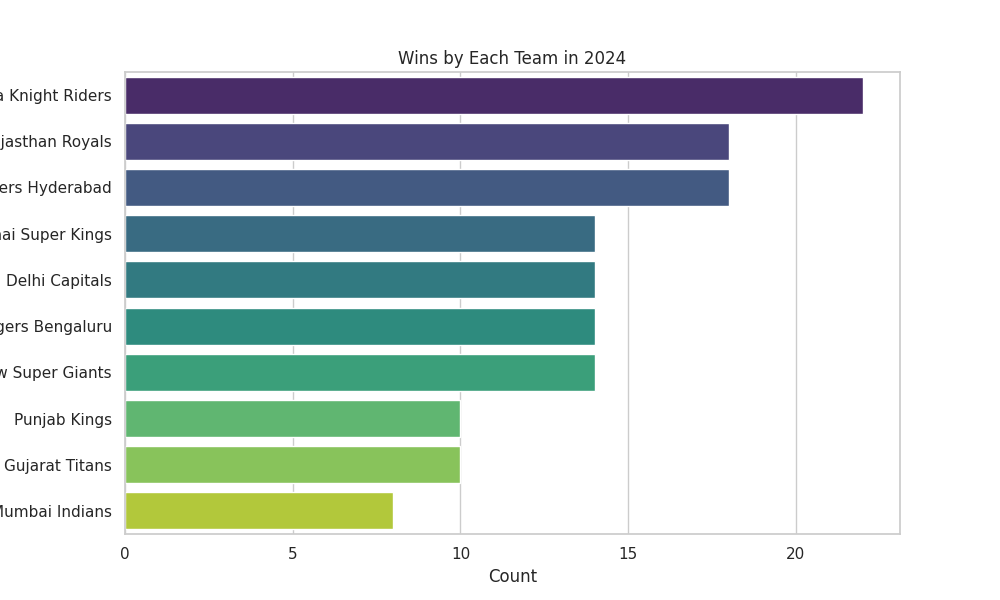

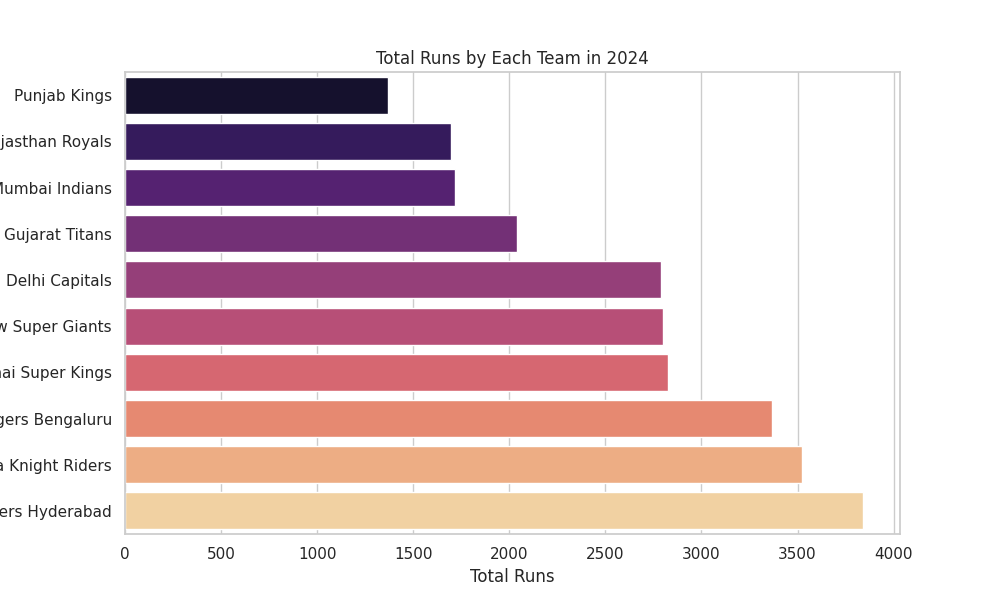

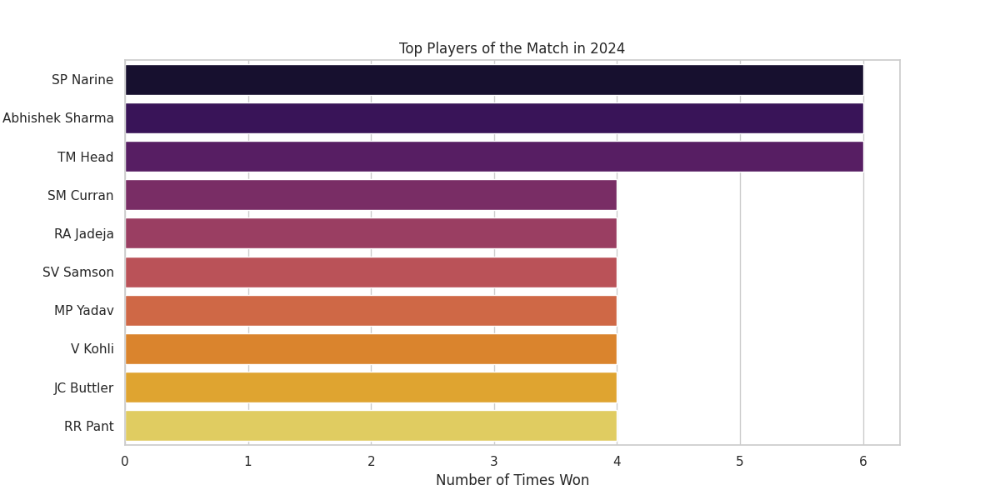

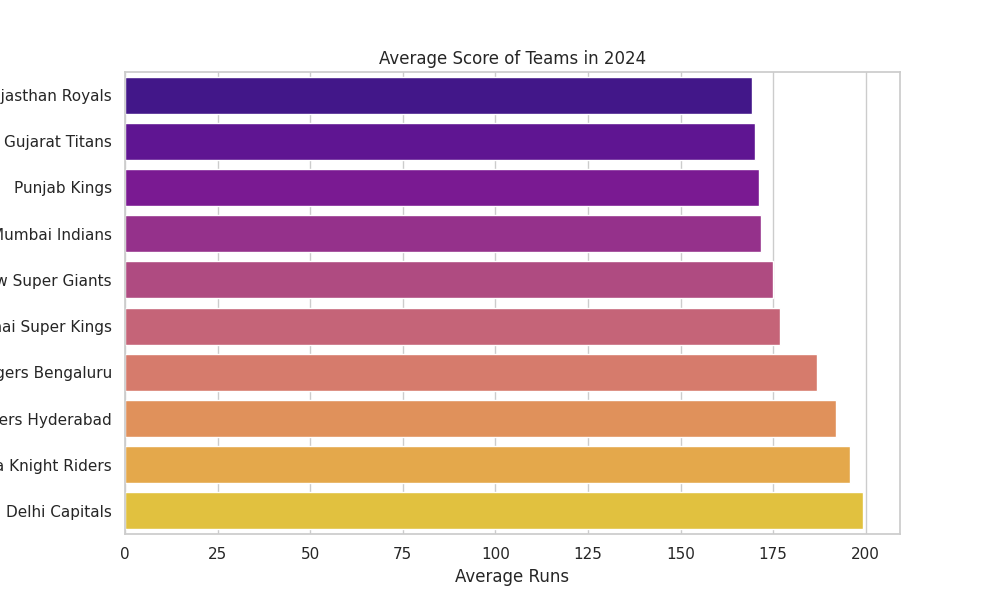

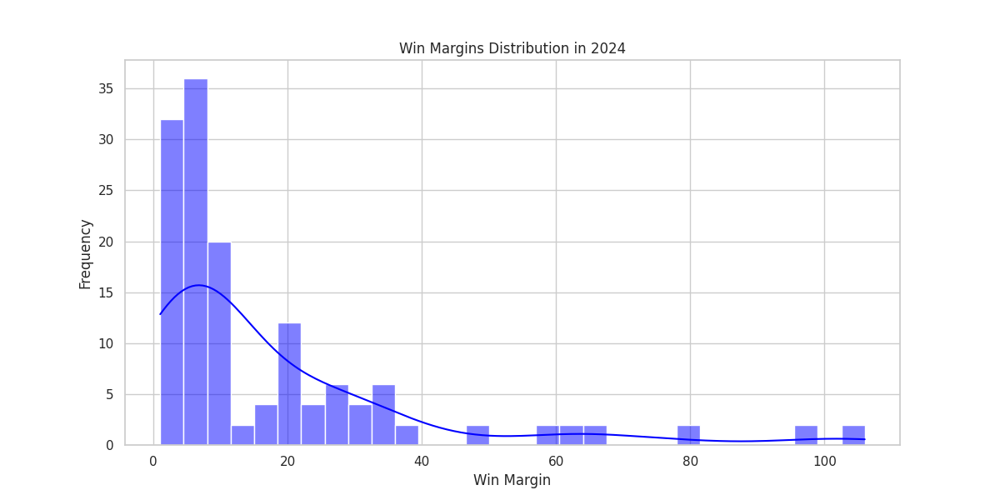

In [104]:
import os
import IPython.display as display
from PIL import Image

plot_dir = "ipl_season_plots"
seasons = ['2007_08', '2009', '2009_10', '2011', '2012', '2013', '2014', '2015',
           '2016', '2017', '2018', '2019', '2020_21', '2021', '2022', '2023', '2024']

# Iterate over each season
for season_filename in seasons:
    # List of plots to display for each season
    plots = [
        f"{plot_dir}/{season_filename}_matches_per_stadium.png",
        f"{plot_dir}/{season_filename}_wins_by_team.png",
        f"{plot_dir}/{season_filename}_total_runs.png",
        f"{plot_dir}/{season_filename}_top_players.png",
        f"{plot_dir}/{season_filename}_average_score.png",
        f"{plot_dir}/{season_filename}_win_margins.png"
    ]

    print(f"\n📊 Displaying plots for {season_filename} season:")

    # Display all plots for the current season
    for plot in plots:
        if os.path.exists(plot):
            img = Image.open(plot)
            display.display(img)
        else:
            print(f"❌ Plot not found: {plot}")


Analyze runs of Orange Cap Holders per season

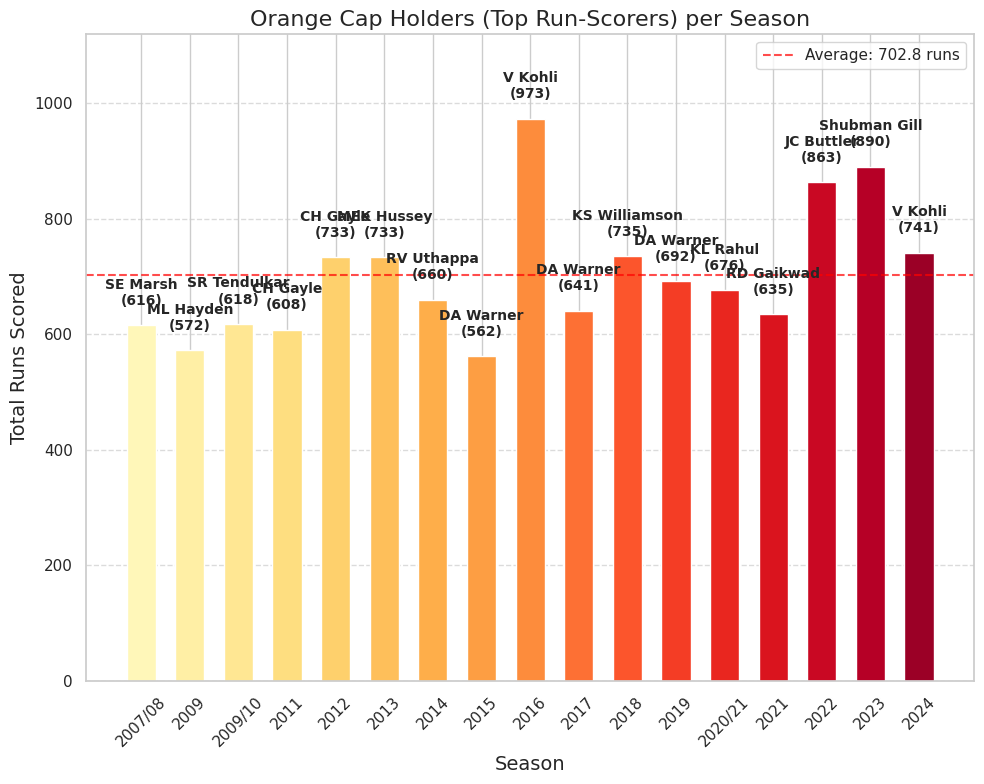


Orange Cap Holder Detailed Analysis:
Season    Player              Runs      Matches   Batting Avg    Strike Rate    
--------------------------------------------------------------------------------
2007/08   SE Marsh            616       11        68.44     136.28     
2009      ML Hayden           572       12        57.20     139.85     
2009/10   SR Tendulkar        618       15        47.54     126.38     
2011      CH Gayle            608       12        67.56     177.78     
2012      CH Gayle            733       14        61.08     155.30     
2013      MEK Hussey          733       17        56.38     126.38     
2014      RV Uthappa          660       16        44.00     136.08     
2015      DA Warner           562       14        46.83     152.72     
2016      V Kohli             973       16        81.08     148.55     
2017      DA Warner           641       14        58.27     138.74     
2018      KS Williamson       735       17        52.50     140.80     
2019    

In [105]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def analyze_orange_cap_holders(df_matches, df_deliveries):
    """
    Analyze runs scored by Orange Cap holders (top run-scorers) per season
    """
    # Merge match data with deliveries to get season information
    match_seasons = df_matches[['id', 'season']].copy()
    match_seasons.rename(columns={'id': 'match_id'}, inplace=True)

    # Merge to get season info for each delivery
    deliveries_with_season = pd.merge(df_deliveries, match_seasons, on='match_id', how='left')

    # Group by season and batsman to get total runs per season
    season_batsman_runs = deliveries_with_season.groupby(['season', 'batter'])['batsman_runs'].sum().reset_index()

    # Find the top run-scorer (Orange Cap holder) for each season
    orange_cap_holders = season_batsman_runs.loc[season_batsman_runs.groupby('season')['batsman_runs'].idxmax()]

    # Sort by season
    orange_cap_holders = orange_cap_holders.sort_values('season')

    # Create a colorful bar chart
    plt.figure(figsize=(10, 8))

    # Use a custom color palette
    colors = sns.color_palette("YlOrRd", len(orange_cap_holders))

    # Create the bar chart
    bars = plt.bar(orange_cap_holders['season'].astype(str),
              orange_cap_holders['batsman_runs'],
              color=colors,
              width=0.6)

    # Add data labels on top of bars
    for bar, player, runs in zip(bars, orange_cap_holders['batter'], orange_cap_holders['batsman_runs']):
        plt.text(bar.get_x() + bar.get_width()/2, runs + 30,
                f"{player}\n({runs})",
                ha='center', va='bottom',
                fontweight='bold', fontsize=10,
                rotation=0)

    # Add a horizontal line for average Orange Cap runs
    avg_orange_runs = orange_cap_holders['batsman_runs'].mean()
    plt.axhline(y=avg_orange_runs, color='red', linestyle='--', alpha=0.7,
               label=f'Average: {avg_orange_runs:.1f} runs')

    # Add titles and labels
    plt.title('Orange Cap Holders (Top Run-Scorers) per Season', fontsize=16)
    plt.xlabel('Season', fontsize=14)
    plt.ylabel('Total Runs Scored', fontsize=14)
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Add some padding at the top for labels
    plt.ylim(0, orange_cap_holders['batsman_runs'].max() * 1.15)

    plt.legend()
    plt.tight_layout()
    plt.show()

    # Analyze Orange Cap holder stats in more detail
    print("\nOrange Cap Holder Detailed Analysis:")
    print("=" * 80)
    print(f"{'Season':<10}{'Player':<20}{'Runs':<10}{'Matches':<10}{'Batting Avg':<15}{'Strike Rate':<15}")
    print("-" * 80)

    # Get more detailed stats for each Orange Cap holder
    for _, row in orange_cap_holders.iterrows():
        season = row['season']
        player = row['batter']
        total_runs = row['batsman_runs']

        # Get player stats for this season
        player_season_data = deliveries_with_season[
            (deliveries_with_season['season'] == season) &
            (deliveries_with_season['batter'] == player)
        ]

        # Calculate detailed stats
        matches_played = player_season_data['match_id'].nunique()
        dismissals = player_season_data[player_season_data['player_dismissed'] == player].shape[0]

        # Handle division by zero for not out batsmen
        if dismissals == 0:
            batting_avg = total_runs
        else:
            batting_avg = total_runs / dismissals

        balls_faced = player_season_data.shape[0]
        strike_rate = (total_runs / balls_faced) * 100 if balls_faced > 0 else 0

        print(f"{season:<10}{player:<20}{total_runs:<10}{matches_played:<10}{batting_avg:.2f}{'':5}{strike_rate:.2f}{'':5}")

    print("=" * 80)

    return orange_cap_holders
orange_cap_data = analyze_orange_cap_holders(df_matches, df_deliveries)

Track wickets of Purple Cap Holders per season

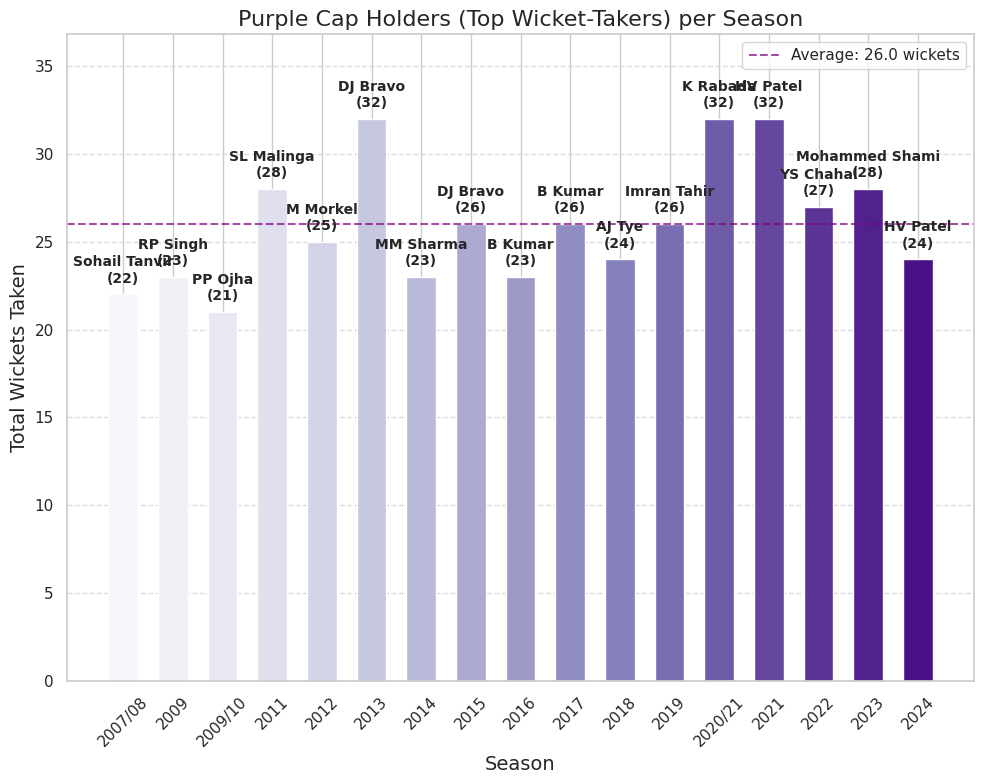


Purple Cap Holder Detailed Analysis:
Season    Bowler              Wickets   Matches   Economy   Bowling Avg    
------------------------------------------------------------------------------------------
2007/08   Sohail Tanvir       22        11        6.23     12.50     
2009      RP Singh            23        16        6.75     18.70     
2009/10   PP Ojha             21        16        7.32     20.90     
2011      SL Malinga          28        16        5.94     14.04     
2012      M Morkel            25        16        7.19     18.64     
2013      DJ Bravo            32        18        7.73     15.78     
2014      MM Sharma           23        16        8.46     19.87     
2015      DJ Bravo            26        16        8.19     17.00     
2016      B Kumar             23        17        7.29     21.87     
2017      B Kumar             26        14        7.11     14.77     
2018      AJ Tye              24        14        7.80     19.12     
2019      Imran Tahir    

In [106]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def analyze_purple_cap_holders(df_matches, df_deliveries):
    """
    Analyze wickets taken by Purple Cap holders (top wicket-takers) per season
    """
    # Merge match data with deliveries to get season information
    match_seasons = df_matches[['id', 'season']].copy()
    match_seasons.rename(columns={'id': 'match_id'}, inplace=True)

    # Merge to get season info for each delivery
    deliveries_with_season = pd.merge(df_deliveries, match_seasons, on='match_id', how='left')

    # Filter for wicket deliveries only
    wicket_deliveries = deliveries_with_season[deliveries_with_season['is_wicket'] == 1].copy()

    # Count wickets by season and bowler
    # Note: We exclude run-outs as they're not credited to the bowler
    bowler_wickets = wicket_deliveries[~wicket_deliveries['dismissal_kind'].isin(['run out', 'retired hurt', 'obstructing the field'])]

    # Group by season and bowler to get wicket counts
    season_bowler_wickets = bowler_wickets.groupby(['season', 'bowler']).size().reset_index()
    season_bowler_wickets.rename(columns={0: 'wickets'}, inplace=True)

    # Find the top wicket-taker (Purple Cap holder) for each season
    purple_cap_holders = season_bowler_wickets.loc[season_bowler_wickets.groupby('season')['wickets'].idxmax()]

    # Sort by season
    purple_cap_holders = purple_cap_holders.sort_values('season')

    # Create a colorful bar chart
    plt.figure(figsize=(10, 8))

    # Use a custom color palette
    colors = sns.color_palette("Purples", len(purple_cap_holders))

    # Create the bar chart
    bars = plt.bar(purple_cap_holders['season'].astype(str),
              purple_cap_holders['wickets'],
              color=colors,
              width=0.6)

    # Add data labels on top of bars
    for bar, player, wickets in zip(bars, purple_cap_holders['bowler'], purple_cap_holders['wickets']):
        plt.text(bar.get_x() + bar.get_width()/2, wickets + 0.5,
                f"{player}\n({wickets})",
                ha='center', va='bottom',
                fontweight='bold', fontsize=10)

    # Add a horizontal line for average Purple Cap wickets
    avg_purple_wickets = purple_cap_holders['wickets'].mean()
    plt.axhline(y=avg_purple_wickets, color='purple', linestyle='--', alpha=0.7,
               label=f'Average: {avg_purple_wickets:.1f} wickets')

    # Add titles and labels
    plt.title('Purple Cap Holders (Top Wicket-Takers) per Season', fontsize=16)
    plt.xlabel('Season', fontsize=14)
    plt.ylabel('Total Wickets Taken', fontsize=14)
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Add some padding at the top for labels
    plt.ylim(0, purple_cap_holders['wickets'].max() * 1.15)

    plt.legend()
    plt.tight_layout()
    plt.show()

    # Analyze Purple Cap holder stats in more detail
    print("\nPurple Cap Holder Detailed Analysis:")
    print("=" * 90)
    print(f"{'Season':<10}{'Bowler':<20}{'Wickets':<10}{'Matches':<10}{'Economy':<10}{'Bowling Avg':<15}")
    print("-" * 90)

    # Get more detailed stats for each Purple Cap holder
    for _, row in purple_cap_holders.iterrows():
        season = row['season']
        player = row['bowler']
        total_wickets = row['wickets']

        # Get player stats for this season
        player_season_data = deliveries_with_season[
            (deliveries_with_season['season'] == season) &
            (deliveries_with_season['bowler'] == player)
        ]

        # Calculate detailed stats
        matches_played = player_season_data['match_id'].nunique()
        total_runs = player_season_data['total_runs'].sum()
        total_balls = len(player_season_data)

        # Calculate economy rate (runs per over)
        economy = (total_runs / (total_balls/6)) if total_balls > 0 else 0

        # Calculate bowling average (runs per wicket)
        bowling_avg = (total_runs / total_wickets) if total_wickets > 0 else float('inf')

        print(f"{season:<10}{player:<20}{total_wickets:<10}{matches_played:<10}{economy:.2f}{'':5}{bowling_avg:.2f}{'':5}")

    print("=" * 90)

    return purple_cap_holders

purple_cap_data = analyze_purple_cap_holders(df_matches, df_deliveries)

Find top 10 bowlers per season

Available seasons:
1. 2007/08
2. 2009
3. 2009/10
4. 2011
5. 2012
6. 2013
7. 2014
8. 2015
9. 2016
10. 2017
11. 2018
12. 2019
13. 2020/21
14. 2021
15. 2022
16. 2023
17. 2024

Select a season (1-17) or 0 to analyze all seasons: 0


<ipython-input-113-9907a9eb213d>:120: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='wickets', y='bowler', data=top_bowlers.sort_values('wickets'), ax=ax1, palette='Purples_d')
<ipython-input-113-9907a9eb213d>:127: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='economy', y='bowler', data=top_bowlers.sort_values('economy'), ax=ax2, palette='Greens_d')
<ipython-input-113-9907a9eb213d>:135: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='bowling_avg', y='bowler', data=sorted_by_avg, ax=ax3, palette='Blues_d')
<ipython-input-113-9907a9eb213

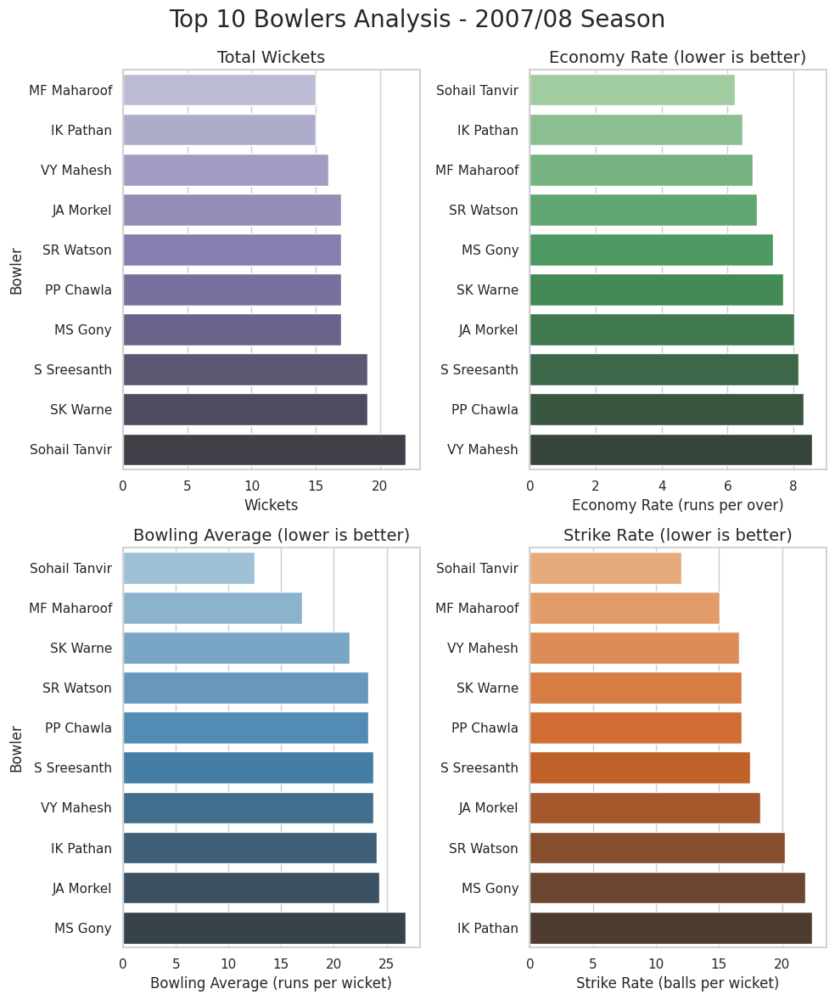


Top 10 Bowlers - 2007/08 Season
Rank  Bowler              Wickets   Matches   Economy   Bowling Avg    Strike Rate    
----------------------------------------------------------------------------------------------------
1     Sohail Tanvir       22        11        6.23      12.50          12.05          
2     S Sreesanth         19        15        8.15      23.74          17.47          
3     SK Warne            19        15        7.69      21.53          16.79          
4     JA Morkel           17        13        8.01      24.35          18.24          
5     MS Gony             17        16        7.37      26.82          21.82          
6     PP Chawla           17        15        8.31      23.29          16.82          
7     SR Watson           17        15        6.89      23.24          20.24          
8     VY Mahesh           16        11        8.57      23.75          16.62          
9     IK Pathan           15        14        6.45      24.07          22.40       

<ipython-input-113-9907a9eb213d>:120: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='wickets', y='bowler', data=top_bowlers.sort_values('wickets'), ax=ax1, palette='Purples_d')
<ipython-input-113-9907a9eb213d>:127: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='economy', y='bowler', data=top_bowlers.sort_values('economy'), ax=ax2, palette='Greens_d')
<ipython-input-113-9907a9eb213d>:135: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='bowling_avg', y='bowler', data=sorted_by_avg, ax=ax3, palette='Blues_d')
<ipython-input-113-9907a9eb213

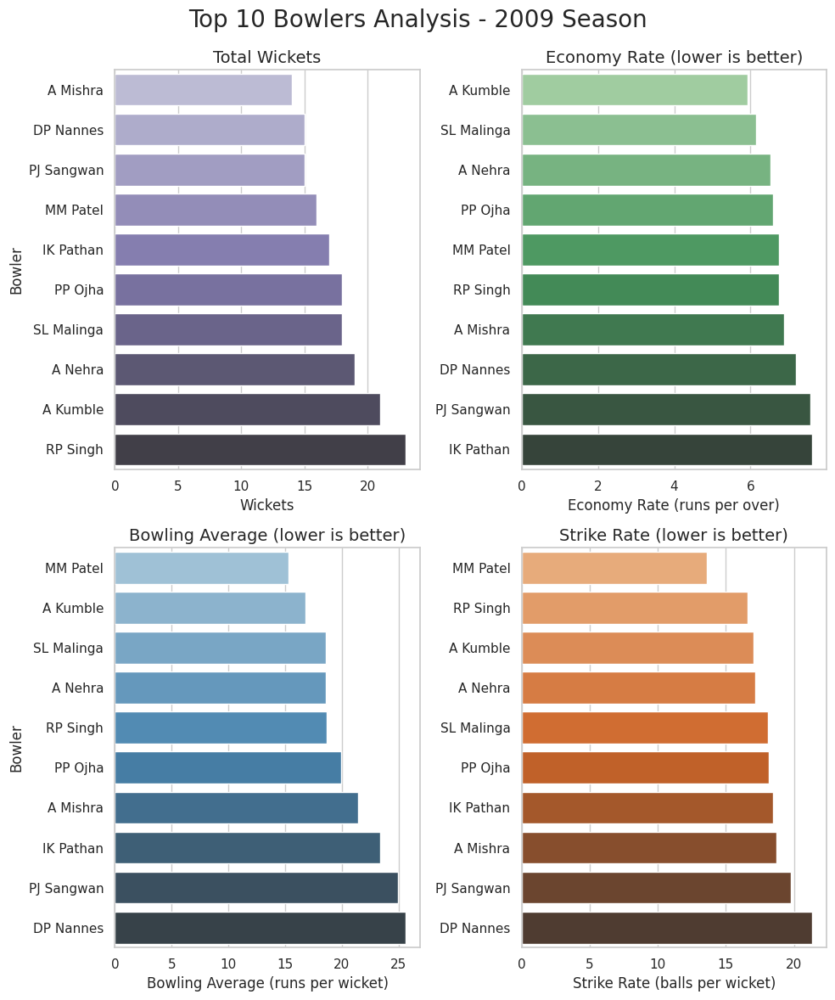


Top 10 Bowlers - 2009 Season
Rank  Bowler              Wickets   Matches   Economy   Bowling Avg    Strike Rate    
----------------------------------------------------------------------------------------------------
1     RP Singh            23        16        6.75      18.70          16.61          
2     A Kumble            21        16        5.92      16.81          17.05          
3     A Nehra             19        13        6.52      18.63          17.16          
4     PP Ojha             18        15        6.59      19.94          18.17          
5     SL Malinga          18        13        6.15      18.56          18.11          
6     IK Pathan           17        14        7.61      23.41          18.47          
7     MM Patel            16        11        6.74      15.31          13.62          
8     DP Nannes           15        13        7.20      25.60          21.33          
9     PJ Sangwan          15        13        7.56      24.93          19.80          

<ipython-input-113-9907a9eb213d>:120: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='wickets', y='bowler', data=top_bowlers.sort_values('wickets'), ax=ax1, palette='Purples_d')
<ipython-input-113-9907a9eb213d>:127: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='economy', y='bowler', data=top_bowlers.sort_values('economy'), ax=ax2, palette='Greens_d')
<ipython-input-113-9907a9eb213d>:135: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='bowling_avg', y='bowler', data=sorted_by_avg, ax=ax3, palette='Blues_d')
<ipython-input-113-9907a9eb213

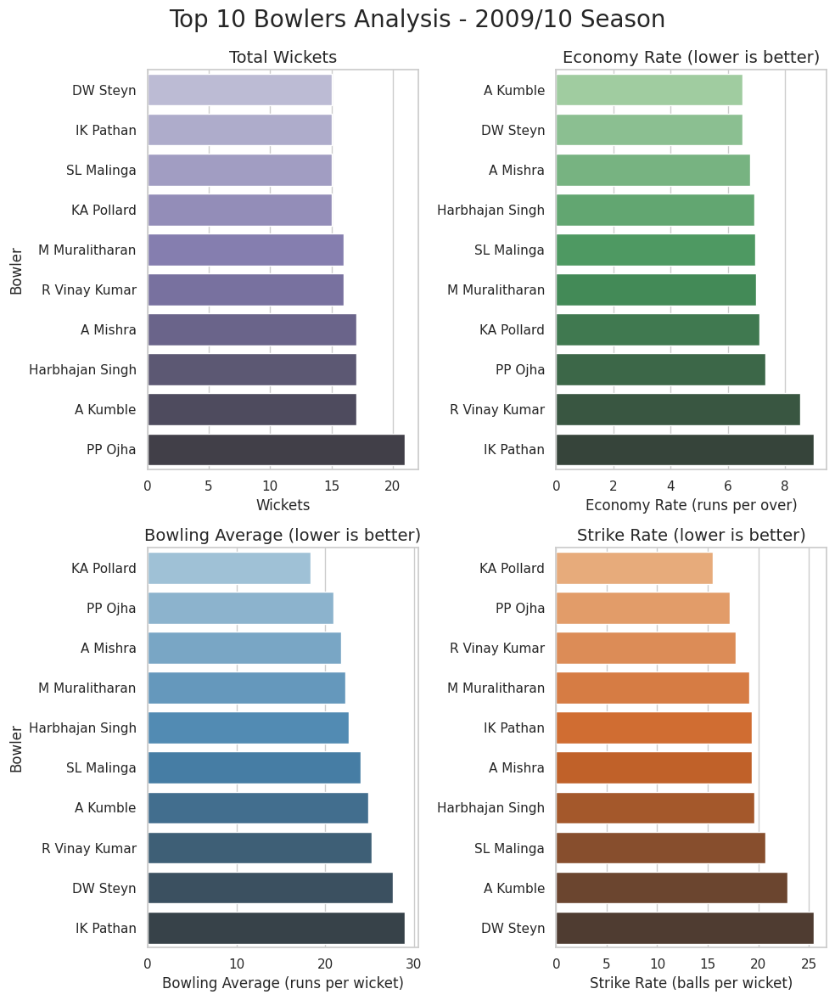


Top 10 Bowlers - 2009/10 Season
Rank  Bowler              Wickets   Matches   Economy   Bowling Avg    Strike Rate    
----------------------------------------------------------------------------------------------------
1     PP Ojha             21        16        7.32      20.90          17.14          
2     A Kumble            17        16        6.51      24.82          22.88          
3     A Mishra            17        14        6.77      21.82          19.35          
4     Harbhajan Singh     17        14        6.92      22.65          19.65          
5     M Muralitharan      16        12        6.98      22.25          19.12          
6     R Vinay Kumar       16        14        8.54      25.25          17.75          
7     DW Steyn            15        15        6.52      27.67          25.47          
8     IK Pathan           15        14        9.00      29.00          19.33          
9     KA Pollard          15        12        7.11      18.40          15.53       

<ipython-input-113-9907a9eb213d>:120: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='wickets', y='bowler', data=top_bowlers.sort_values('wickets'), ax=ax1, palette='Purples_d')
<ipython-input-113-9907a9eb213d>:127: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='economy', y='bowler', data=top_bowlers.sort_values('economy'), ax=ax2, palette='Greens_d')
<ipython-input-113-9907a9eb213d>:135: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='bowling_avg', y='bowler', data=sorted_by_avg, ax=ax3, palette='Blues_d')
<ipython-input-113-9907a9eb213

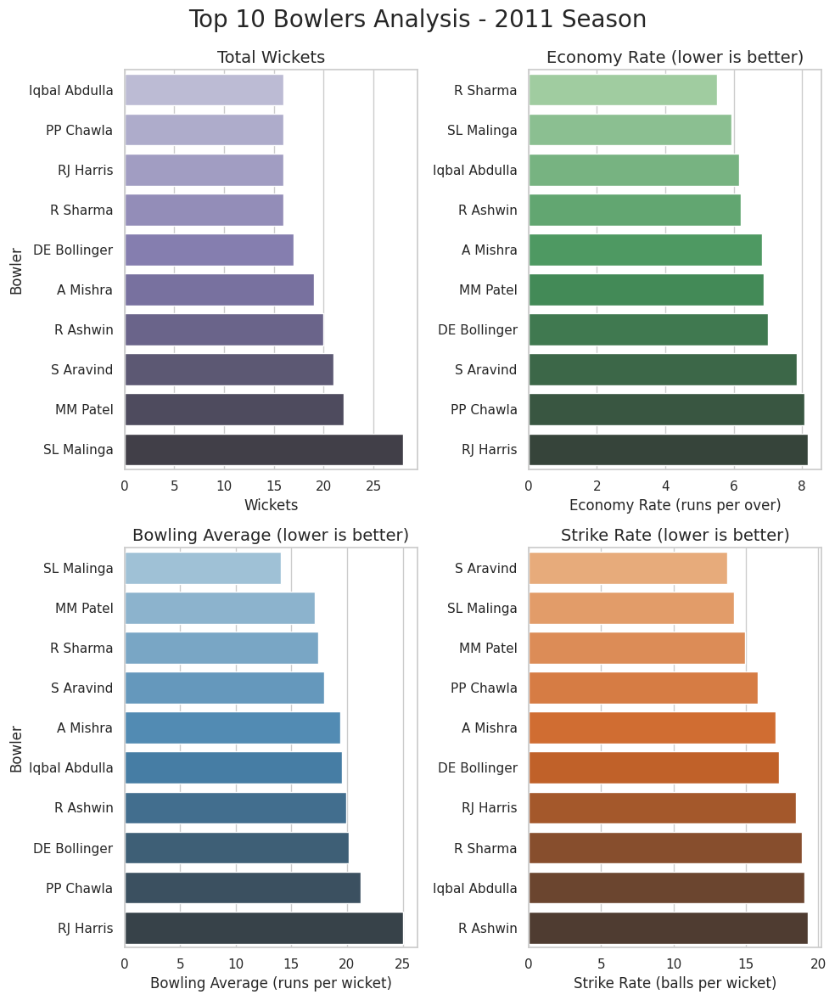


Top 10 Bowlers - 2011 Season
Rank  Bowler              Wickets   Matches   Economy   Bowling Avg    Strike Rate    
----------------------------------------------------------------------------------------------------
1     SL Malinga          28        16        5.94      14.04          14.18          
2     MM Patel            22        15        6.88      17.14          14.95          
3     S Aravind           21        13        7.85      17.95          13.71          
4     R Ashwin            20        16        6.20      19.90          19.25          
5     A Mishra            19        14        6.83      19.42          17.05          
6     DE Bollinger        17        13        7.00      20.18          17.29          
7     Iqbal Abdulla       16        15        6.16      19.56          19.06          
8     PP Chawla           16        12        8.06      21.25          15.81          
9     R Sharma            16        14        5.52      17.38          18.88          

<ipython-input-113-9907a9eb213d>:120: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='wickets', y='bowler', data=top_bowlers.sort_values('wickets'), ax=ax1, palette='Purples_d')
<ipython-input-113-9907a9eb213d>:127: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='economy', y='bowler', data=top_bowlers.sort_values('economy'), ax=ax2, palette='Greens_d')
<ipython-input-113-9907a9eb213d>:135: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='bowling_avg', y='bowler', data=sorted_by_avg, ax=ax3, palette='Blues_d')
<ipython-input-113-9907a9eb213

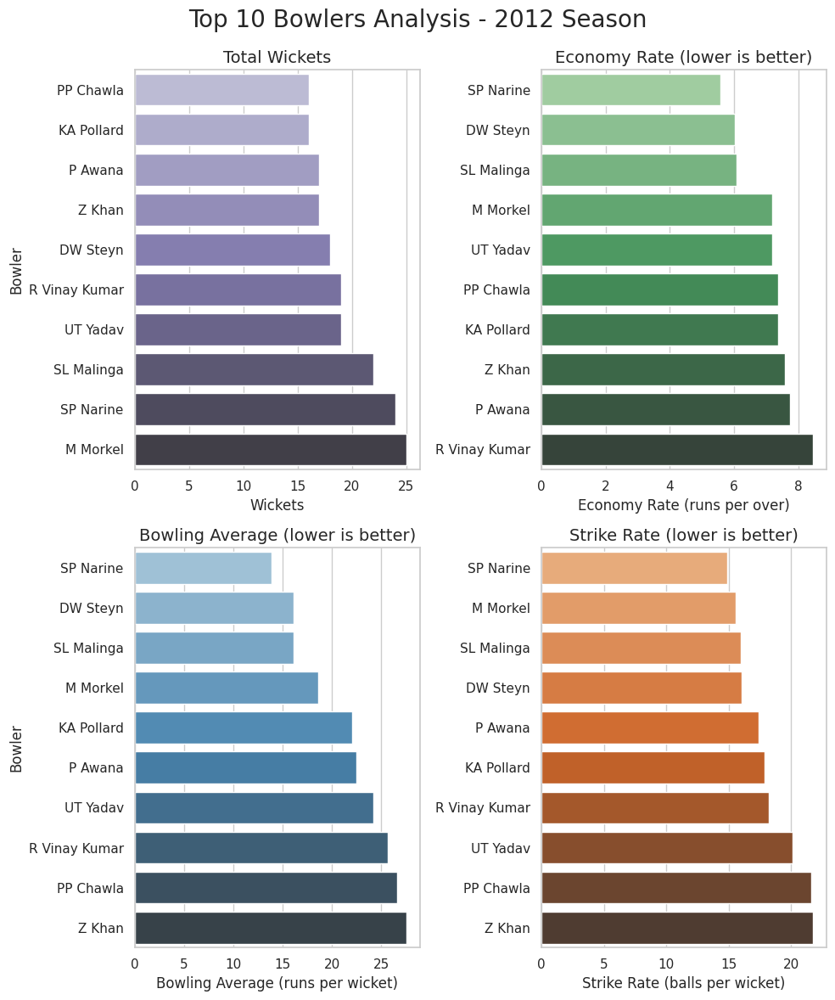


Top 10 Bowlers - 2012 Season
Rank  Bowler              Wickets   Matches   Economy   Bowling Avg    Strike Rate    
----------------------------------------------------------------------------------------------------
1     M Morkel            25        16        7.19      18.64          15.56          
2     SP Narine           24        15        5.58      13.83          14.88          
3     SL Malinga          22        14        6.07      16.14          15.95          
4     R Vinay Kumar       19        14        8.46      25.68          18.21          
5     UT Yadav            19        17        7.19      24.16          20.16          
6     DW Steyn            18        12        6.02      16.11          16.06          
7     P Awana             17        12        7.74      22.47          17.41          
8     Z Khan              17        15        7.59      27.53          21.76          
9     KA Pollard          16        14        7.38      22.00          17.88          

<ipython-input-113-9907a9eb213d>:120: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='wickets', y='bowler', data=top_bowlers.sort_values('wickets'), ax=ax1, palette='Purples_d')
<ipython-input-113-9907a9eb213d>:127: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='economy', y='bowler', data=top_bowlers.sort_values('economy'), ax=ax2, palette='Greens_d')
<ipython-input-113-9907a9eb213d>:135: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='bowling_avg', y='bowler', data=sorted_by_avg, ax=ax3, palette='Blues_d')
<ipython-input-113-9907a9eb213

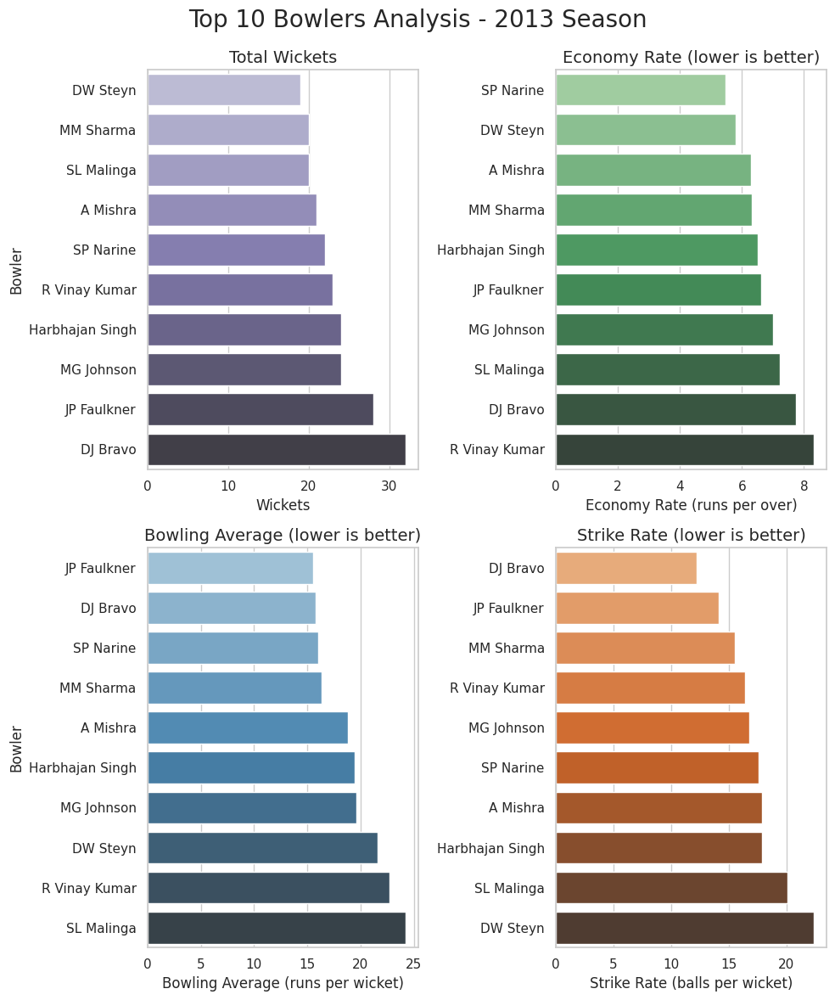


Top 10 Bowlers - 2013 Season
Rank  Bowler              Wickets   Matches   Economy   Bowling Avg    Strike Rate    
----------------------------------------------------------------------------------------------------
1     DJ Bravo            32        18        7.73      15.78          12.25          
2     JP Faulkner         28        16        6.62      15.57          14.11          
3     Harbhajan Singh     24        19        6.50      19.42          17.92          
4     MG Johnson          24        17        7.01      19.62          16.79          
5     R Vinay Kumar       23        16        8.31      22.70          16.39          
6     SP Narine           22        16        5.47      16.05          17.59          
7     A Mishra            21        17        6.30      18.81          17.90          
8     MM Sharma           20        15        6.31      16.35          15.55          
9     SL Malinga          20        17        7.22      24.20          20.10          

<ipython-input-113-9907a9eb213d>:120: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='wickets', y='bowler', data=top_bowlers.sort_values('wickets'), ax=ax1, palette='Purples_d')
<ipython-input-113-9907a9eb213d>:127: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='economy', y='bowler', data=top_bowlers.sort_values('economy'), ax=ax2, palette='Greens_d')
<ipython-input-113-9907a9eb213d>:135: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='bowling_avg', y='bowler', data=sorted_by_avg, ax=ax3, palette='Blues_d')
<ipython-input-113-9907a9eb213

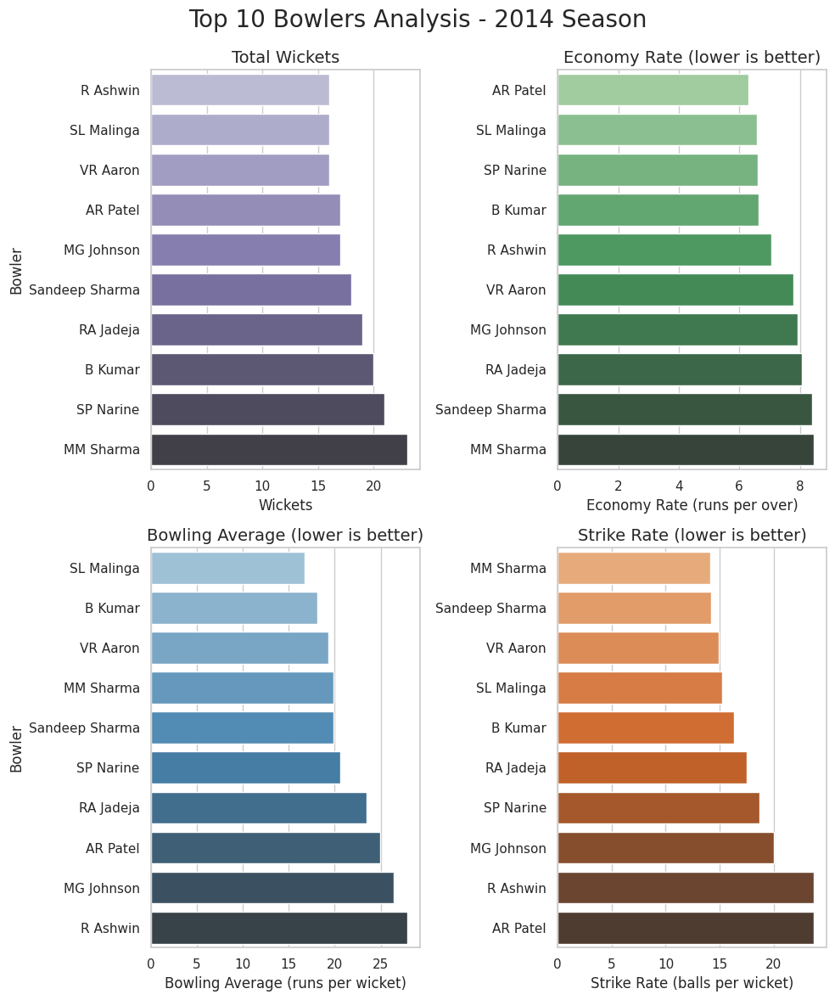


Top 10 Bowlers - 2014 Season
Rank  Bowler              Wickets   Matches   Economy   Bowling Avg    Strike Rate    
----------------------------------------------------------------------------------------------------
1     MM Sharma           23        16        8.46      19.87          14.09          
2     SP Narine           21        16        6.61      20.57          18.67          
3     B Kumar             20        14        6.64      18.10          16.35          
4     RA Jadeja           19        16        8.06      23.47          17.47          
5     Sandeep Sharma      18        11        8.42      19.89          14.17          
6     AR Patel            17        17        6.31      24.94          23.71          
7     MG Johnson          17        14        7.94      26.47          20.00          
8     R Ashwin            16        16        7.06      27.88          23.69          
9     SL Malinga          16        10        6.59      16.69          15.19          

<ipython-input-113-9907a9eb213d>:120: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='wickets', y='bowler', data=top_bowlers.sort_values('wickets'), ax=ax1, palette='Purples_d')
<ipython-input-113-9907a9eb213d>:127: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='economy', y='bowler', data=top_bowlers.sort_values('economy'), ax=ax2, palette='Greens_d')
<ipython-input-113-9907a9eb213d>:135: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='bowling_avg', y='bowler', data=sorted_by_avg, ax=ax3, palette='Blues_d')
<ipython-input-113-9907a9eb213

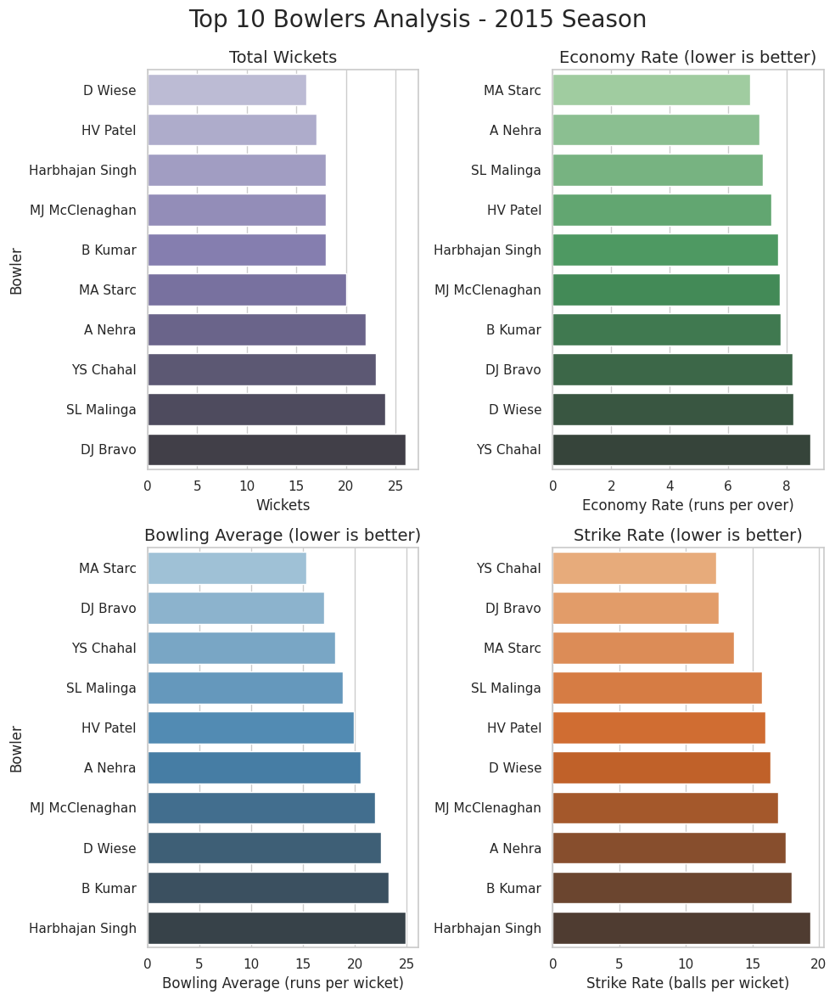


Top 10 Bowlers - 2015 Season
Rank  Bowler              Wickets   Matches   Economy   Bowling Avg    Strike Rate    
----------------------------------------------------------------------------------------------------
1     DJ Bravo            26        16        8.19      17.00          12.46          
2     SL Malinga          24        15        7.19      18.88          15.75          
3     YS Chahal           23        14        8.82      18.09          12.30          
4     A Nehra             22        16        7.06      20.59          17.50          
5     MA Starc            20        12        6.75      15.30          13.60          
6     B Kumar             18        14        7.78      23.28          17.94          
7     Harbhajan Singh     18        15        7.70      24.89          19.39          
8     MJ McClenaghan      18        12        7.77      21.94          16.94          
9     HV Patel            17        14        7.48      19.94          16.00          

<ipython-input-113-9907a9eb213d>:120: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='wickets', y='bowler', data=top_bowlers.sort_values('wickets'), ax=ax1, palette='Purples_d')
<ipython-input-113-9907a9eb213d>:127: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='economy', y='bowler', data=top_bowlers.sort_values('economy'), ax=ax2, palette='Greens_d')
<ipython-input-113-9907a9eb213d>:135: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='bowling_avg', y='bowler', data=sorted_by_avg, ax=ax3, palette='Blues_d')
<ipython-input-113-9907a9eb213

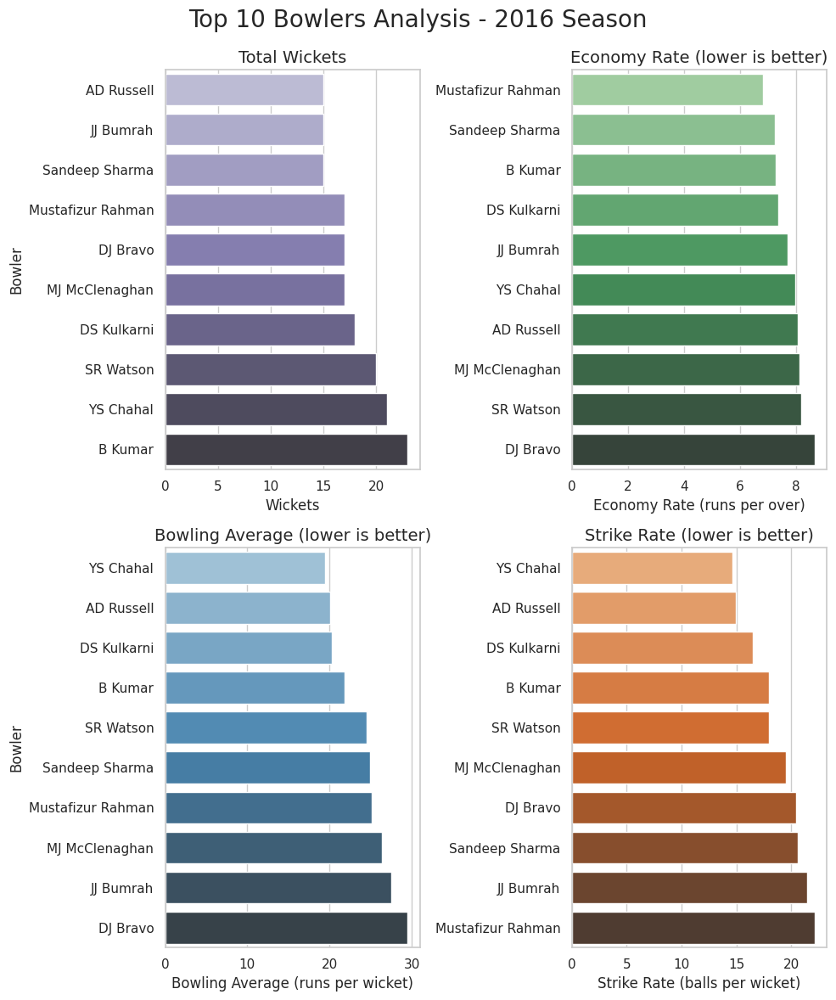


Top 10 Bowlers - 2016 Season
Rank  Bowler              Wickets   Matches   Economy   Bowling Avg    Strike Rate    
----------------------------------------------------------------------------------------------------
1     B Kumar             23        17        7.29      21.87          18.00          
2     YS Chahal           21        13        7.97      19.48          14.67          
3     SR Watson           20        16        8.17      24.50          18.00          
4     DS Kulkarni         18        14        7.37      20.28          16.50          
5     DJ Bravo            17        15        8.66      29.53          20.47          
6     MJ McClenaghan      17        14        8.11      26.41          19.53          
7     Mustafizur Rahman   17        16        6.81      25.12          22.12          
8     AD Russell          15        12        8.06      20.07          14.93          
9     JJ Bumrah           15        14        7.70      27.53          21.47          

<ipython-input-113-9907a9eb213d>:120: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='wickets', y='bowler', data=top_bowlers.sort_values('wickets'), ax=ax1, palette='Purples_d')
<ipython-input-113-9907a9eb213d>:127: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='economy', y='bowler', data=top_bowlers.sort_values('economy'), ax=ax2, palette='Greens_d')
<ipython-input-113-9907a9eb213d>:135: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='bowling_avg', y='bowler', data=sorted_by_avg, ax=ax3, palette='Blues_d')
<ipython-input-113-9907a9eb213

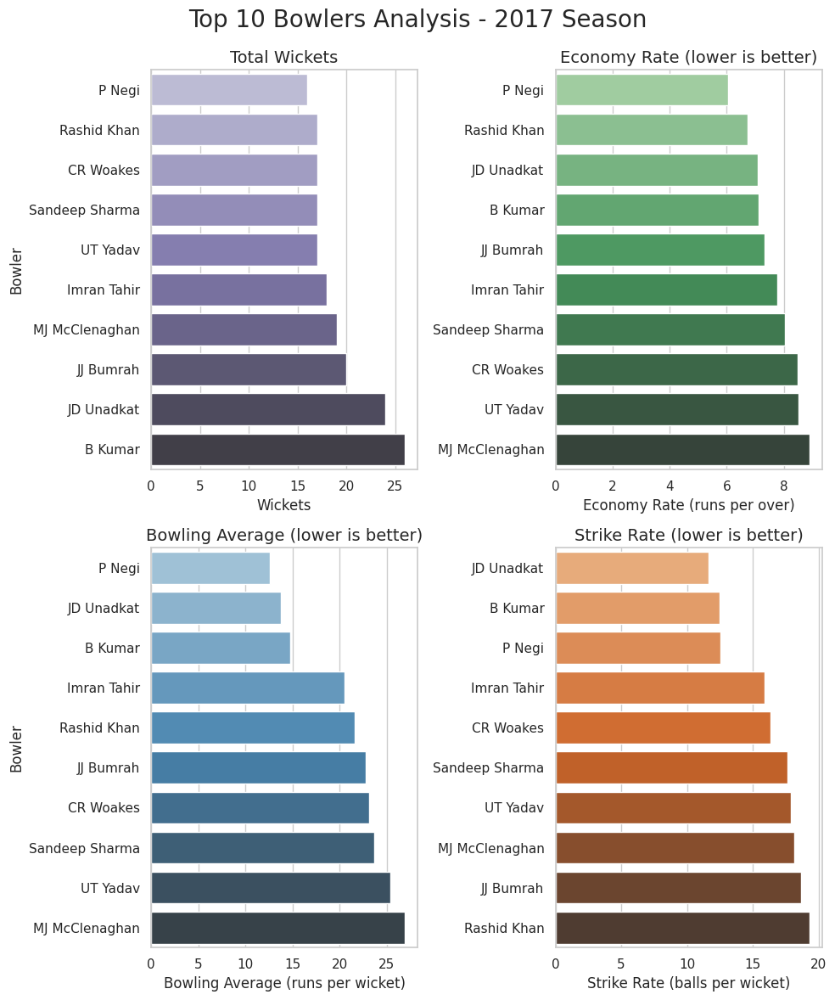


Top 10 Bowlers - 2017 Season
Rank  Bowler              Wickets   Matches   Economy   Bowling Avg    Strike Rate    
----------------------------------------------------------------------------------------------------
1     B Kumar             26        14        7.11      14.77          12.46          
2     JD Unadkat          24        12        7.10      13.75          11.62          
3     JJ Bumrah           20        16        7.32      22.75          18.65          
4     MJ McClenaghan      19        14        8.90      26.95          18.16          
5     Imran Tahir         18        12        7.76      20.56          15.89          
6     CR Woakes           17        13        8.48      23.12          16.35          
7     Rashid Khan         17        14        6.73      21.65          19.29          
8     Sandeep Sharma      17        13        8.04      23.65          17.65          
9     UT Yadav            17        14        8.53      25.41          17.88          

<ipython-input-113-9907a9eb213d>:120: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='wickets', y='bowler', data=top_bowlers.sort_values('wickets'), ax=ax1, palette='Purples_d')
<ipython-input-113-9907a9eb213d>:127: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='economy', y='bowler', data=top_bowlers.sort_values('economy'), ax=ax2, palette='Greens_d')
<ipython-input-113-9907a9eb213d>:135: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='bowling_avg', y='bowler', data=sorted_by_avg, ax=ax3, palette='Blues_d')
<ipython-input-113-9907a9eb213

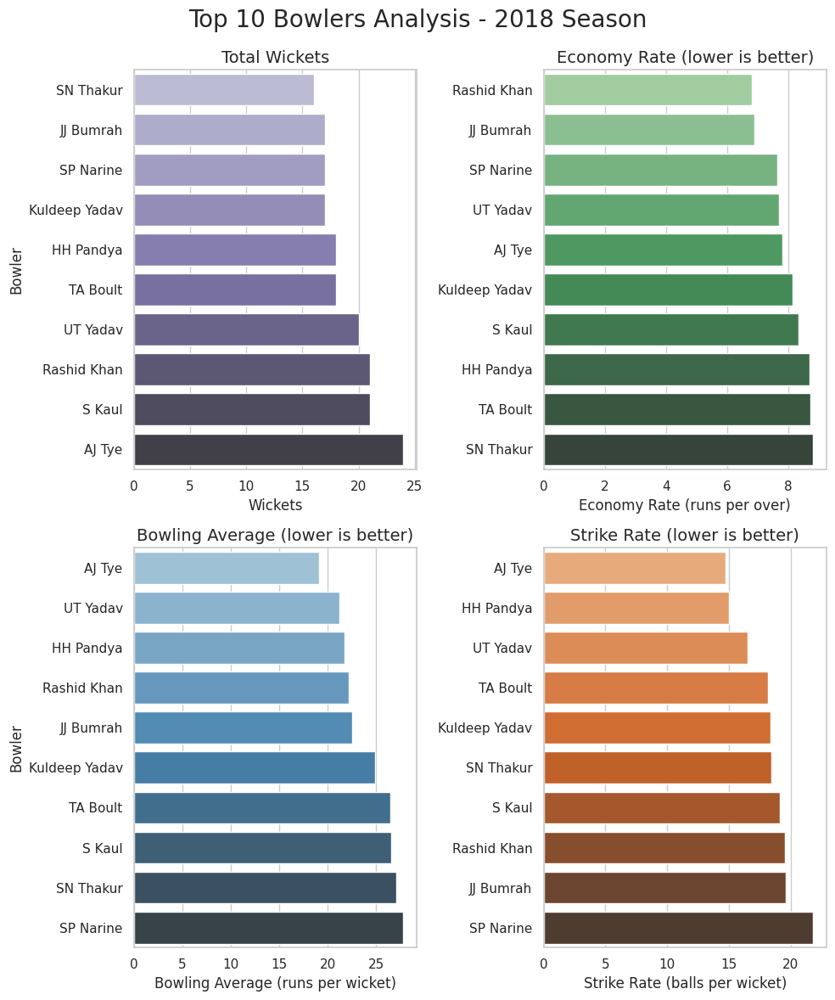


Top 10 Bowlers - 2018 Season
Rank  Bowler              Wickets   Matches   Economy   Bowling Avg    Strike Rate    
----------------------------------------------------------------------------------------------------
1     AJ Tye              24        14        7.80      19.12          14.71          
2     Rashid Khan         21        17        6.80      22.19          19.57          
3     S Kaul              21        17        8.33      26.57          19.14          
4     UT Yadav            20        14        7.69      21.20          16.55          
5     HH Pandya           18        13        8.69      21.72          15.00          
6     TA Boult            18        14        8.73      26.44          18.17          
7     JJ Bumrah           17        14        6.90      22.53          19.59          
8     Kuldeep Yadav       17        16        8.13      24.88          18.35          
9     SP Narine           17        16        7.65      27.82          21.82          

<ipython-input-113-9907a9eb213d>:120: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='wickets', y='bowler', data=top_bowlers.sort_values('wickets'), ax=ax1, palette='Purples_d')
<ipython-input-113-9907a9eb213d>:127: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='economy', y='bowler', data=top_bowlers.sort_values('economy'), ax=ax2, palette='Greens_d')
<ipython-input-113-9907a9eb213d>:135: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='bowling_avg', y='bowler', data=sorted_by_avg, ax=ax3, palette='Blues_d')
<ipython-input-113-9907a9eb213

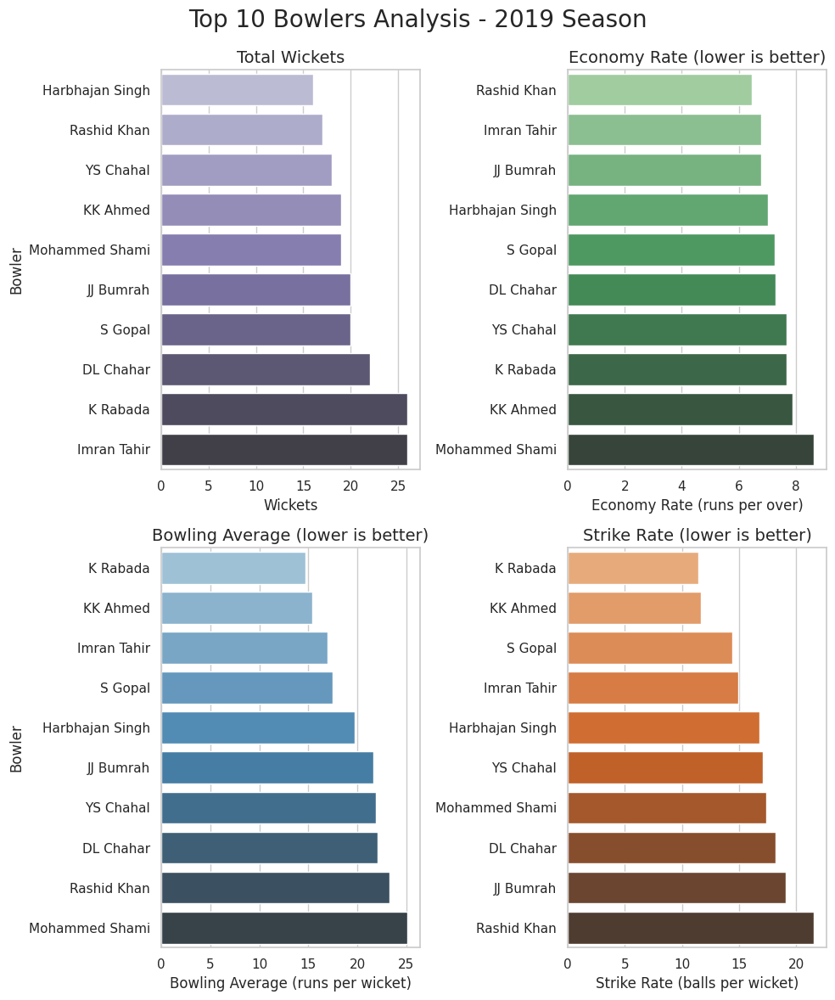


Top 10 Bowlers - 2019 Season
Rank  Bowler              Wickets   Matches   Economy   Bowling Avg    Strike Rate    
----------------------------------------------------------------------------------------------------
1     Imran Tahir         26        17        6.80      16.92          14.92          
2     K Rabada            26        12        7.69      14.69          11.46          
3     DL Chahar           22        17        7.29      22.09          18.18          
4     JJ Bumrah           20        16        6.80      21.65          19.10          
5     S Gopal             20        14        7.27      17.50          14.45          
6     KK Ahmed            19        9         7.89      15.37          11.68          
7     Mohammed Shami      19        14        8.65      25.11          17.42          
8     YS Chahal           18        14        7.68      21.89          17.11          
9     Rashid Khan         17        15        6.47      23.29          21.59          

<ipython-input-113-9907a9eb213d>:120: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='wickets', y='bowler', data=top_bowlers.sort_values('wickets'), ax=ax1, palette='Purples_d')
<ipython-input-113-9907a9eb213d>:127: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='economy', y='bowler', data=top_bowlers.sort_values('economy'), ax=ax2, palette='Greens_d')
<ipython-input-113-9907a9eb213d>:135: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='bowling_avg', y='bowler', data=sorted_by_avg, ax=ax3, palette='Blues_d')
<ipython-input-113-9907a9eb213

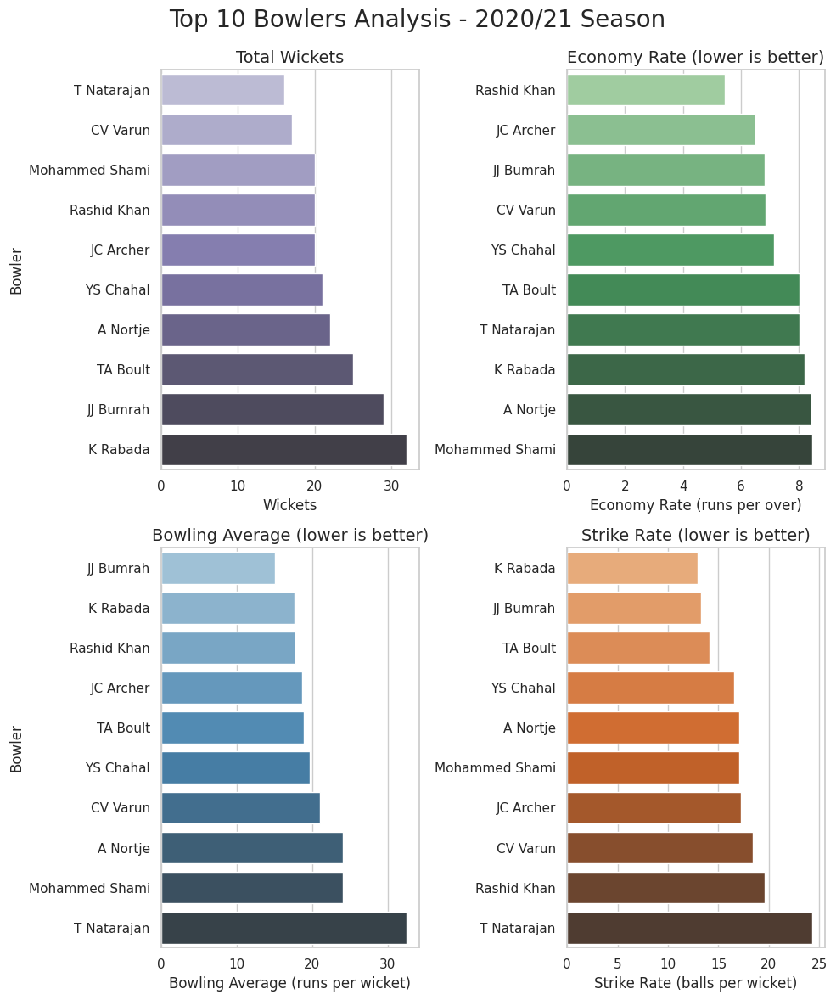


Top 10 Bowlers - 2020/21 Season
Rank  Bowler              Wickets   Matches   Economy   Bowling Avg    Strike Rate    
----------------------------------------------------------------------------------------------------
1     K Rabada            32        17        8.19      17.66          12.94          
2     JJ Bumrah           29        15        6.81      15.03          13.24          
3     TA Boult            25        15        8.02      18.92          14.16          
4     A Nortje            22        16        8.44      24.05          17.09          
5     YS Chahal           21        15        7.14      19.71          16.57          
6     JC Archer           20        14        6.49      18.65          17.25          
7     Mohammed Shami      20        14        8.46      24.10          17.10          
8     Rashid Khan         20        16        5.45      17.75          19.55          
9     CV Varun            17        13        6.84      21.00          18.41       

<ipython-input-113-9907a9eb213d>:120: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='wickets', y='bowler', data=top_bowlers.sort_values('wickets'), ax=ax1, palette='Purples_d')
<ipython-input-113-9907a9eb213d>:127: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='economy', y='bowler', data=top_bowlers.sort_values('economy'), ax=ax2, palette='Greens_d')
<ipython-input-113-9907a9eb213d>:135: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='bowling_avg', y='bowler', data=sorted_by_avg, ax=ax3, palette='Blues_d')
<ipython-input-113-9907a9eb213

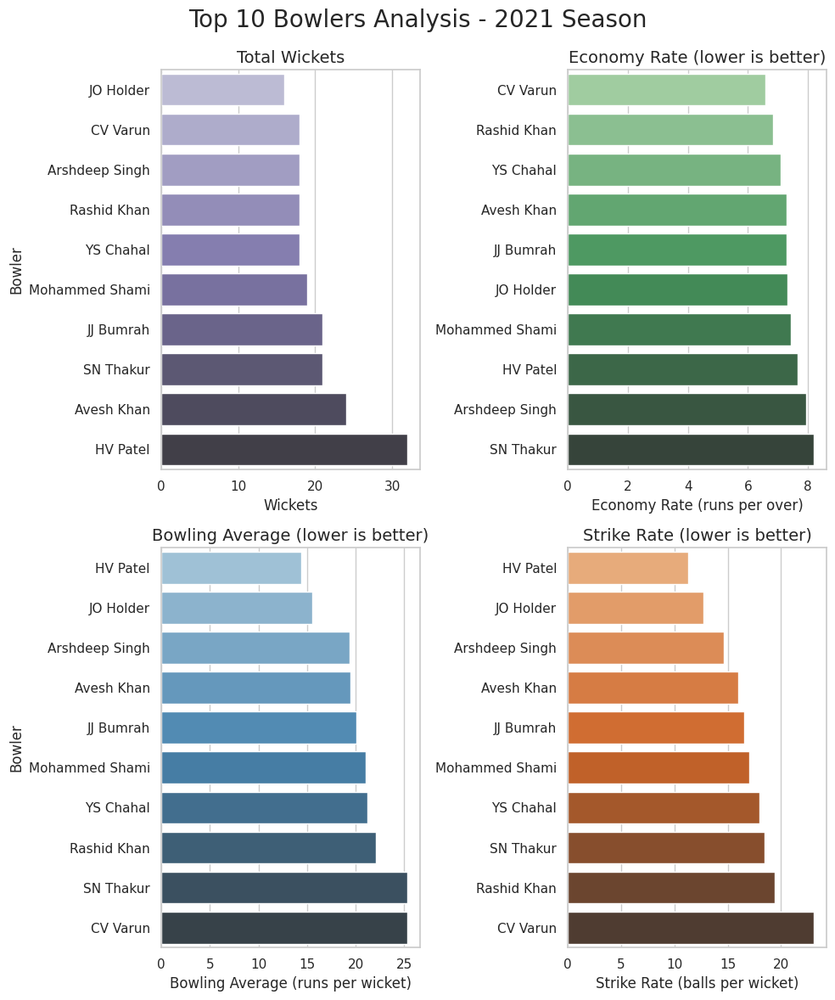


Top 10 Bowlers - 2021 Season
Rank  Bowler              Wickets   Matches   Economy   Bowling Avg    Strike Rate    
----------------------------------------------------------------------------------------------------
1     HV Patel            32        15        7.66      14.41          11.28          
2     Avesh Khan          24        16        7.30      19.42          15.96          
3     JJ Bumrah           21        14        7.30      20.10          16.52          
4     SN Thakur           21        16        8.21      25.29          18.48          
5     Mohammed Shami      19        14        7.43      21.05          17.00          
6     Arshdeep Singh      18        12        7.94      19.33          14.61          
7     CV Varun            18        17        6.58      25.33          23.11          
8     Rashid Khan         18        14        6.84      22.11          19.39          
9     YS Chahal           18        15        7.08      21.17          17.94          

<ipython-input-113-9907a9eb213d>:120: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='wickets', y='bowler', data=top_bowlers.sort_values('wickets'), ax=ax1, palette='Purples_d')
<ipython-input-113-9907a9eb213d>:127: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='economy', y='bowler', data=top_bowlers.sort_values('economy'), ax=ax2, palette='Greens_d')
<ipython-input-113-9907a9eb213d>:135: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='bowling_avg', y='bowler', data=sorted_by_avg, ax=ax3, palette='Blues_d')
<ipython-input-113-9907a9eb213

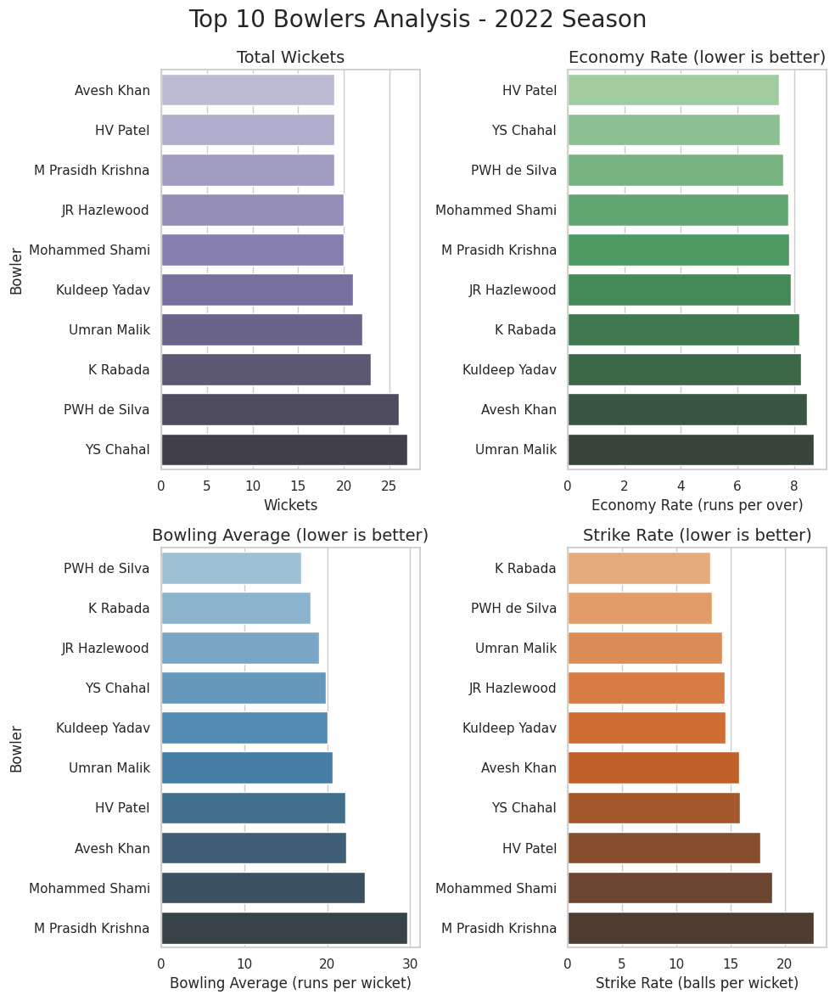


Top 10 Bowlers - 2022 Season
Rank  Bowler              Wickets   Matches   Economy   Bowling Avg    Strike Rate    
----------------------------------------------------------------------------------------------------
1     YS Chahal           27        17        7.50      19.85          15.89          
2     PWH de Silva        26        16        7.61      16.88          13.31          
3     K Rabada            23        13        8.20      18.00          13.17          
4     Umran Malik         22        14        8.72      20.68          14.23          
5     Kuldeep Yadav       21        14        8.24      20.00          14.57          
6     JR Hazlewood        20        12        7.89      19.00          14.45          
7     Mohammed Shami      20        16        7.79      24.55          18.90          
8     Avesh Khan          19        13        8.46      22.26          15.79          
9     HV Patel            19        15        7.47      22.16          17.79          

<ipython-input-113-9907a9eb213d>:120: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='wickets', y='bowler', data=top_bowlers.sort_values('wickets'), ax=ax1, palette='Purples_d')
<ipython-input-113-9907a9eb213d>:127: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='economy', y='bowler', data=top_bowlers.sort_values('economy'), ax=ax2, palette='Greens_d')
<ipython-input-113-9907a9eb213d>:135: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='bowling_avg', y='bowler', data=sorted_by_avg, ax=ax3, palette='Blues_d')
<ipython-input-113-9907a9eb213

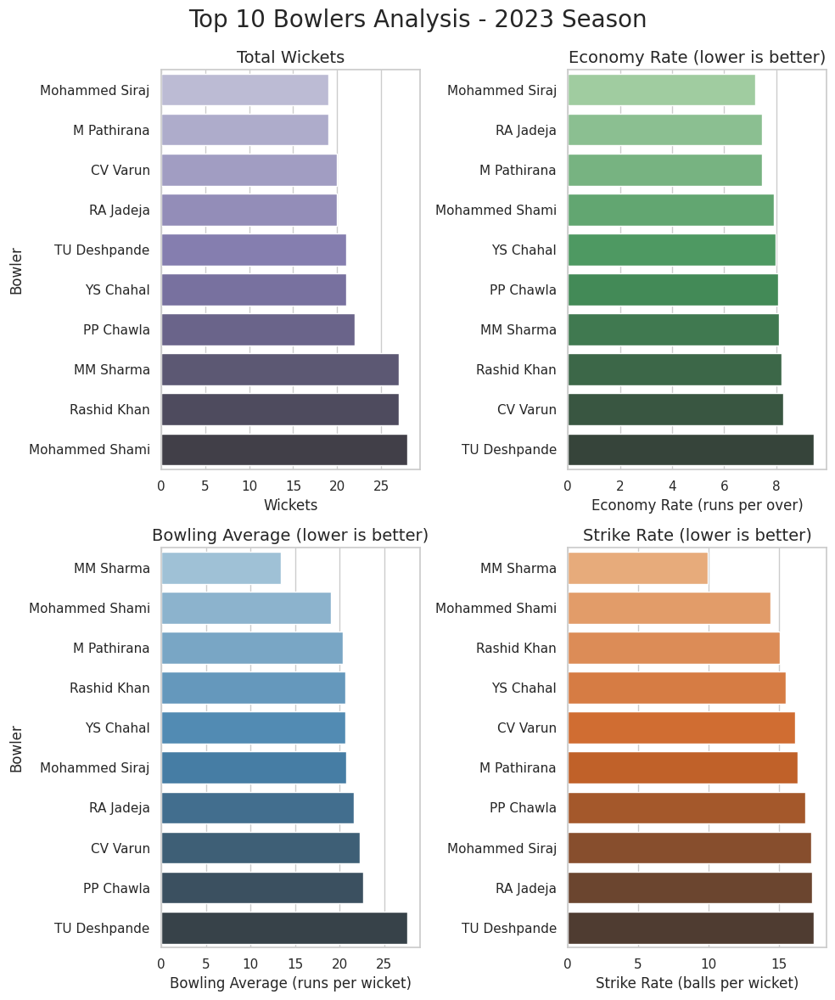


Top 10 Bowlers - 2023 Season
Rank  Bowler              Wickets   Matches   Economy   Bowling Avg    Strike Rate    
----------------------------------------------------------------------------------------------------
1     Mohammed Shami      28        17        7.92      19.00          14.39          
2     MM Sharma           27        14        8.10      13.41          9.93           
3     Rashid Khan         27        17        8.21      20.63          15.07          
4     PP Chawla           22        16        8.07      22.68          16.86          
5     TU Deshpande        21        16        9.46      27.62          17.52          
6     YS Chahal           21        14        7.99      20.67          15.52          
7     CV Varun            20        14        8.27      22.25          16.15          
8     RA Jadeja           20        16        7.45      21.60          17.40          
9     M Pathirana         19        12        7.47      20.32          16.32          

<ipython-input-113-9907a9eb213d>:120: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='wickets', y='bowler', data=top_bowlers.sort_values('wickets'), ax=ax1, palette='Purples_d')
<ipython-input-113-9907a9eb213d>:127: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='economy', y='bowler', data=top_bowlers.sort_values('economy'), ax=ax2, palette='Greens_d')
<ipython-input-113-9907a9eb213d>:135: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='bowling_avg', y='bowler', data=sorted_by_avg, ax=ax3, palette='Blues_d')
<ipython-input-113-9907a9eb213

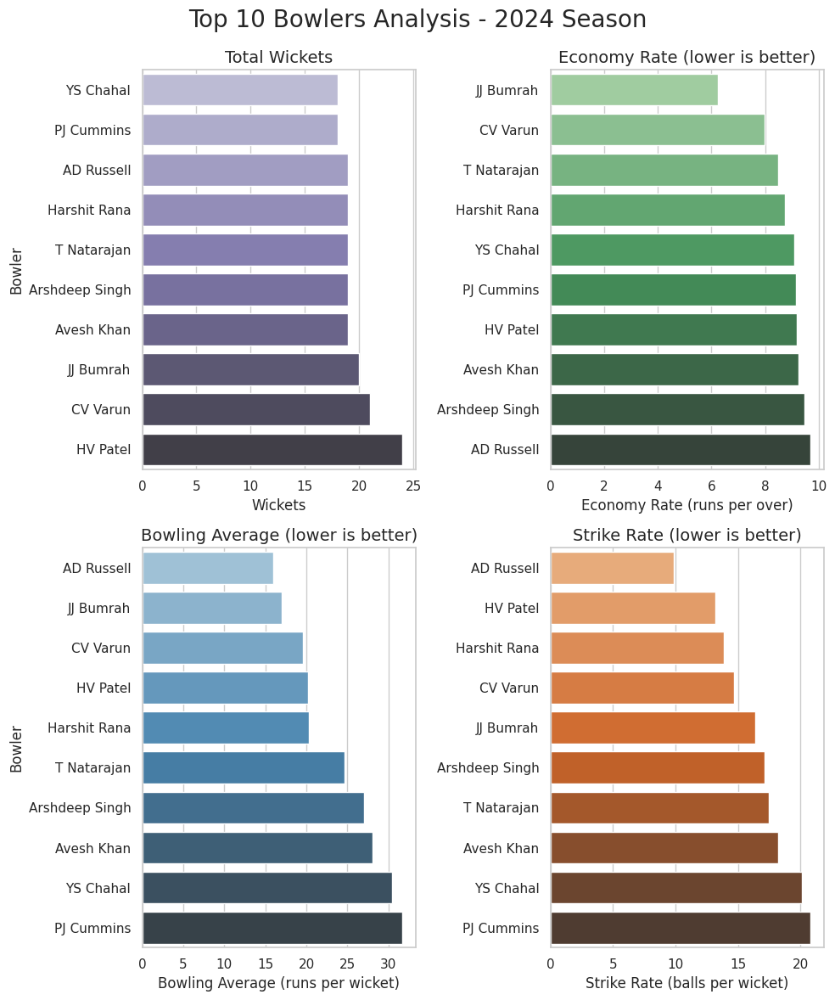


Top 10 Bowlers - 2024 Season
Rank  Bowler              Wickets   Matches   Economy   Bowling Avg    Strike Rate    
----------------------------------------------------------------------------------------------------
1     HV Patel            24        14        9.18      20.21          13.21          
2     CV Varun            21        14        7.98      19.57          14.71          
3     JJ Bumrah           20        13        6.24      17.05          16.40          
4     AD Russell          19        14        9.70      16.00          9.89           
5     Arshdeep Singh      19        14        9.46      27.05          17.16          
6     Avesh Khan          19        15        9.24      28.05          18.21          
7     Harshit Rana        19        11        8.75      20.26          13.89          
8     T Natarajan         19        14        8.48      24.68          17.47          
9     PJ Cummins          18        16        9.14      31.72          20.83          

In [113]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.gridspec import GridSpec

def find_top_bowlers_per_season(df_matches, df_deliveries, season_to_analyze=None):
    """
    Find and analyze top 10 bowlers for each season or a specific season

    Parameters:
    df_matches: DataFrame containing match data
    df_deliveries: DataFrame containing ball-by-ball data
    season_to_analyze: Specific season to analyze (optional)
    """
    # Merge match data with deliveries to get season information
    match_seasons = df_matches[['id', 'season']].copy()
    match_seasons.rename(columns={'id': 'match_id'}, inplace=True)

    # Merge to get season info for each delivery
    deliveries_with_season = pd.merge(df_deliveries, match_seasons, on='match_id', how='left')

    # Get list of seasons
    all_seasons = sorted(deliveries_with_season['season'].unique())

    # If a specific season is requested, filter for that season only
    if season_to_analyze is not None:
        if season_to_analyze in all_seasons:
            seasons_to_analyze = [season_to_analyze]
        else:
            print(f"Season {season_to_analyze} not found in data. Available seasons: {all_seasons}")
            return None
    else:
        # Let's create an interactive menu to select a season
        print("Available seasons:")
        for i, season in enumerate(all_seasons):
            print(f"{i+1}. {season}")

        try:
            choice = int(input("\nSelect a season (1-{0}) or 0 to analyze all seasons: ".format(len(all_seasons))))
            if choice == 0:
                seasons_to_analyze = all_seasons
            elif 1 <= choice <= len(all_seasons):
                seasons_to_analyze = [all_seasons[choice-1]]
            else:
                print("Invalid choice. Analyzing all seasons.")
                seasons_to_analyze = all_seasons
        except:
            print("Invalid input. Analyzing all seasons.")
            seasons_to_analyze = all_seasons

    # Create a dictionary to store top bowlers for each season
    top_bowlers_by_season = {}

    # Process each season
    for season in seasons_to_analyze:
        # Filter data for this season
        season_data = deliveries_with_season[deliveries_with_season['season'] == season]

        # Filter for wicket deliveries only
        wicket_deliveries = season_data[season_data['is_wicket'] == 1].copy()

        # Count wickets by bowler (excluding run-outs)
        bowler_wickets = wicket_deliveries[~wicket_deliveries['dismissal_kind'].isin(['run out', 'retired hurt', 'obstructing the field'])]
        wicket_counts = bowler_wickets.groupby('bowler').size().reset_index()
        wicket_counts.columns = ['bowler', 'wickets']

        # Calculate economy rate
        # Group by bowler to get runs conceded and balls bowled
        bowler_stats = season_data.groupby('bowler').agg(
            runs_conceded=('total_runs', 'sum'),
            balls_bowled=('bowler', 'size')
        ).reset_index()

        # Calculate economy rate (runs per over)
        bowler_stats['economy'] = (bowler_stats['runs_conceded'] / (bowler_stats['balls_bowled']/6)).round(2)

        # Calculate average (runs per wicket)
        # Merge wicket counts
        bowler_stats = pd.merge(bowler_stats, wicket_counts, on='bowler', how='left')
        bowler_stats['wickets'] = bowler_stats['wickets'].fillna(0)

        # Calculate bowling average
        bowler_stats['bowling_avg'] = (bowler_stats['runs_conceded'] / bowler_stats['wickets']).replace([np.inf, -np.inf], np.nan).round(2)

        # Calculate strike rate (balls per wicket)
        bowler_stats['strike_rate'] = (bowler_stats['balls_bowled'] / bowler_stats['wickets']).replace([np.inf, -np.inf], np.nan).round(2)

        # Calculate matches played
        matches_played = season_data.groupby('bowler')['match_id'].nunique().reset_index()
        matches_played.columns = ['bowler', 'matches']

        # Merge matches played
        bowler_stats = pd.merge(bowler_stats, matches_played, on='bowler', how='left')

        # Calculate wickets per match
        bowler_stats['wickets_per_match'] = (bowler_stats['wickets'] / bowler_stats['matches']).round(2)

        # Set minimum qualification criteria
        min_balls = 60  # At least 10 overs
        qualified_bowlers = bowler_stats[bowler_stats['balls_bowled'] >= min_balls].copy()

        # Rank bowlers by wickets
        top_wicket_takers = qualified_bowlers.nlargest(10, 'wickets')

        # Store in dictionary
        top_bowlers_by_season[season] = top_wicket_takers

    # Visualization
    for season, top_bowlers in top_bowlers_by_season.items():
        # Create a figure with subplots
        fig = plt.figure(figsize=(10, 12))
        gs = GridSpec(2, 2, figure=fig)

        # Title for the entire figure
        fig.suptitle(f'Top 10 Bowlers Analysis - {season} Season', fontsize=20)

        # 1. Wickets Bar Chart
        ax1 = fig.add_subplot(gs[0, 0])
        sns.barplot(x='wickets', y='bowler', data=top_bowlers.sort_values('wickets'), ax=ax1, palette='Purples_d')
        ax1.set_title('Total Wickets', fontsize=14)
        ax1.set_xlabel('Wickets', fontsize=12)
        ax1.set_ylabel('Bowler', fontsize=12)

        # 2. Economy Rate Bar Chart
        ax2 = fig.add_subplot(gs[0, 1])
        sns.barplot(x='economy', y='bowler', data=top_bowlers.sort_values('economy'), ax=ax2, palette='Greens_d')
        ax2.set_title('Economy Rate (lower is better)', fontsize=14)
        ax2.set_xlabel('Economy Rate (runs per over)', fontsize=12)
        ax2.set_ylabel('', fontsize=12)  # No need to repeat

        # 3. Bowling Average Bar Chart
        ax3 = fig.add_subplot(gs[1, 0])
        sorted_by_avg = top_bowlers.sort_values('bowling_avg').dropna(subset=['bowling_avg'])
        sns.barplot(x='bowling_avg', y='bowler', data=sorted_by_avg, ax=ax3, palette='Blues_d')
        ax3.set_title('Bowling Average (lower is better)', fontsize=14)
        ax3.set_xlabel('Bowling Average (runs per wicket)', fontsize=12)
        ax3.set_ylabel('Bowler', fontsize=12)

        # 4. Strike Rate Bar Chart
        ax4 = fig.add_subplot(gs[1, 1])
        sorted_by_sr = top_bowlers.sort_values('strike_rate').dropna(subset=['strike_rate'])
        sns.barplot(x='strike_rate', y='bowler', data=sorted_by_sr, ax=ax4, palette='Oranges_d')
        ax4.set_title('Strike Rate (lower is better)', fontsize=14)
        ax4.set_xlabel('Strike Rate (balls per wicket)', fontsize=12)
        ax4.set_ylabel('', fontsize=12)  # No need to repeat

        plt.tight_layout()
        plt.subplots_adjust(top=0.92)  # Adjust for the suptitle
        plt.show()

        # Print detailed stats table
        print(f"\nTop 10 Bowlers - {season} Season")
        print("=" * 100)
        print(f"{'Rank':<6}{'Bowler':<20}{'Wickets':<10}{'Matches':<10}{'Economy':<10}{'Bowling Avg':<15}{'Strike Rate':<15}")
        print("-" * 100)

        for i, (_, row) in enumerate(top_bowlers.sort_values('wickets', ascending=False).iterrows()):
            print(f"{i+1:<6}{row['bowler']:<20}{int(row['wickets']):<10}{int(row['matches']):<10}{row['economy']:<10.2f}{row['bowling_avg']:<15.2f}{row['strike_rate']:<15.2f}")

        print("=" * 100)

    return top_bowlers_by_season

# To use this function with interactive season selection:
top_bowlers = find_top_bowlers_per_season(df_matches, df_deliveries)

# # To analyze a specific season directly:
# top_bowlers = find_top_bowlers_per_season(df_matches, df_deliveries, season_to_analyze=2011)

#PART 2 : Feature Extraction - Manipulation - Prediction Model:
### IPL 2025 Match Winner Predictor

## Description:  
This section builds a predictive model for the IPL 2025 season using historical match data.  
The objective is to extract key insights from **matches.csv** and **deliveries.csv**,  
train machine learning models, and develop an ensemble approach for winner prediction.

## Workflow:
1. **Data Preprocessing & Feature Extraction**  
   - Extract key features from matches.csv (batting_team, bowling_team, city, runs_left, etc.).  
   - Extract crucial insights from deliveries.csv (batsman/bowler performance, powerplay analysis).  

2. **Model Training & Evaluation**  
   - Train a **Logistic Regression model** as a baseline.  
   - Train advanced models: **Random Forest, XGBoost, and Neural Networks**.  
   - Develop an **ensemble model** combining classifiers (e.g., Random Forest + XGBoost).  

3. **Performance Evaluation**  
   - Compare models using **accuracy, precision, recall, F1-score, and ROC-AUC**.  
   - Discuss model strengths, weaknesses, and key influencing factors.  

4. **Results & Predictions for IPL 2025**  
   - Use the trained model to **predict winners for the IPL 2025 season**.  
   - Provide insights into predicted team performance and key players.  


In [114]:
import numpy as np
import pandas as pd

In [115]:
match=pd.read_csv('matches.csv')

In [116]:
delivery=pd.read_csv('/content/deliveries.csv')

In [117]:
match.head()

,id,season,city,date,match_type,player_of_match,venue,team1,team2,toss_winner,toss_decision,winner,result,result_margin,target_runs,target_overs,super_over,method,umpire1,umpire2
0,335982,2007/08,Bangalore,2008-04-18,League,BB McCullum,M Chinnaswamy Stadium,Royal Challengers Bangalore,Kolkata Knight Riders,Royal Challengers Bangalore,field,Kolkata Knight Riders,runs,140.0,223.0,20.0,N,NaN,Asad Rauf,RE Koertzen
1,335983,2007/08,Chandigarh,2008-04-19,League,MEK Hussey,"Punjab Cricket Association Stadium, Mohali",Kings XI Punjab,Chennai Super Kings,Chennai Super Kings,bat,Chennai Super Kings,runs,33.0,241.0,20.0,N,NaN,MR Benson,SL Shastri
2,335984,2007/08,Delhi,2008-04-19,League,MF Maharoof,Feroz Shah Kotla,Delhi Daredevils,Rajasthan Royals,Rajasthan Royals,bat,Delhi Daredevils,wickets,9.0,130.0,20.0,N,NaN,Aleem Dar,GA Pratapkumar
3,335985,2007/08,Mumbai,2008-04-20,League,MV Boucher,Wankhede Stadium,Mumbai Indians,Royal Challengers Bangalore,Mumbai Indians,bat,Royal Challengers Bangalore,wickets,5.0,166.0,20.0,N,NaN,SJ Davis,DJ Harper
4,335986,2007/08,Kolkata,2008-04-20,League,DJ Hussey,Eden Gardens,Kolkata Knight Riders,Deccan Chargers,Deccan Chargers,bat,Kolkata Knight Riders,wickets,5.0,111.0,20.0,N,NaN,BF Bowden,K Hariharan


### All Match details of all season till now:

In [118]:
match.shape

(1095, 20)

Ball by ball details of each match is present in deliveries:

In [ ]:
delivery.shape

(260920, 17)

In [119]:
delivery.head()

,match_id,inning,batting_team,bowling_team,over,ball,batter,bowler,non_striker,batsman_runs,extra_runs,total_runs,extras_type,is_wicket,player_dismissed,dismissal_kind,fielder
0,335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,1,SC Ganguly,P Kumar,BB McCullum,0,1,1,legbyes,0,NaN,NaN,NaN
1,335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,2,BB McCullum,P Kumar,SC Ganguly,0,0,0,NaN,0,NaN,NaN,NaN
2,335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,3,BB McCullum,P Kumar,SC Ganguly,0,1,1,wides,0,NaN,NaN,NaN
3,335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,4,BB McCullum,P Kumar,SC Ganguly,0,0,0,NaN,0,NaN,NaN,NaN
4,335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,5,BB McCullum,P Kumar,SC Ganguly,0,0,0,NaN,0,NaN,NaN,NaN


### Data Analysis:

In [120]:
print("Match DataFrame Info:")
match.info()
print("\nDelivery DataFrame Info:")
delivery.info()

print("\nMatch DataFrame Descriptive Statistics:")
print(match.describe())
print("\nDelivery DataFrame Descriptive Statistics:")
print(delivery.describe())

print("\nMatch DataFrame Missing Values:")
print(match.isnull().sum())
print("\nDelivery DataFrame Missing Values:")
print(delivery.isnull().sum())

print("\nMatch DataFrame Unique Values for Selected Columns:")
for column in ['season', 'city', 'winner']:
  print(f"Unique values for {column}: {match[column].unique()}")

print("\nDelivery DataFrame Unique Values for Selected Columns:")
for column in ['batting_team', 'bowling_team']:
  print(f"Unique values for {column}: {delivery[column].unique()}")

Match DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1095 entries, 0 to 1094
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               1095 non-null   int64  
 1   season           1095 non-null   object 
 2   city             1044 non-null   object 
 3   date             1095 non-null   object 
 4   match_type       1095 non-null   object 
 5   player_of_match  1090 non-null   object 
 6   venue            1095 non-null   object 
 7   team1            1095 non-null   object 
 8   team2            1095 non-null   object 
 9   toss_winner      1095 non-null   object 
 10  toss_decision    1095 non-null   object 
 11  winner           1090 non-null   object 
 12  result           1095 non-null   object 
 13  result_margin    1076 non-null   float64
 14  target_runs      1092 non-null   float64
 15  target_overs     1092 non-null   float64
 16  super_over       1095 non-null   objec

In [121]:
delivery.groupby(['match_id','inning']).sum()['total_runs']
# Each match is now visualised as a two innings data - 1st team batting then 2nd team batting
# and their respective scores

match_id  inning
335982    1         222
          2          82
335983    1         240
          2         207
335984    1         129
                   ... 
1426310   2         174
1426311   1         175
          2         139
1426312   1         113
          2         114
Name: total_runs, Length: 2217, dtype: int64

In [122]:
total_score_df=delivery.groupby(['match_id','inning']).sum()['total_runs'].reset_index()

In [123]:
total_score_df

,match_id,inning,total_runs
0,335982,1,222
1,335982,2,82
2,335983,1,240
3,335983,2,207
4,335984,1,129
...,...,...,...
2212,1426310,2,174
2213,1426311,1,175
2214,1426311,2,139
2215,1426312,1,113


In [124]:
total_score_df=total_score_df[total_score_df['inning']==1]

In [125]:
total_score_df

,match_id,inning,total_runs
0,335982,1,222
2,335983,1,240
4,335984,1,129
6,335985,1,165
8,335986,1,110
...,...,...,...
2207,1426307,1,214
2209,1426309,1,159
2211,1426310,1,172
2213,1426311,1,175


Merging match and delivery dataframe by match id

In [126]:
#merge by match_id and id
match_df=match.merge(total_score_df[['match_id','total_runs']],left_on='id',right_on='match_id')

In [127]:
match_df.head()

,id,season,city,date,match_type,player_of_match,venue,team1,team2,toss_winner,...,result,result_margin,target_runs,target_overs,super_over,method,umpire1,umpire2,match_id,total_runs
0,335982,2007/08,Bangalore,2008-04-18,League,BB McCullum,M Chinnaswamy Stadium,Royal Challengers Bangalore,Kolkata Knight Riders,Royal Challengers Bangalore,...,runs,140.0,223.0,20.0,N,NaN,Asad Rauf,RE Koertzen,335982,222
1,335983,2007/08,Chandigarh,2008-04-19,League,MEK Hussey,"Punjab Cricket Association Stadium, Mohali",Kings XI Punjab,Chennai Super Kings,Chennai Super Kings,...,runs,33.0,241.0,20.0,N,NaN,MR Benson,SL Shastri,335983,240
2,335984,2007/08,Delhi,2008-04-19,League,MF Maharoof,Feroz Shah Kotla,Delhi Daredevils,Rajasthan Royals,Rajasthan Royals,...,wickets,9.0,130.0,20.0,N,NaN,Aleem Dar,GA Pratapkumar,335984,129
3,335985,2007/08,Mumbai,2008-04-20,League,MV Boucher,Wankhede Stadium,Mumbai Indians,Royal Challengers Bangalore,Mumbai Indians,...,wickets,5.0,166.0,20.0,N,NaN,SJ Davis,DJ Harper,335985,165
4,335986,2007/08,Kolkata,2008-04-20,League,DJ Hussey,Eden Gardens,Kolkata Knight Riders,Deccan Chargers,Deccan Chargers,...,wickets,5.0,111.0,20.0,N,NaN,BF Bowden,K Hariharan,335986,110


### Data Processing (as a prerequisite for model design approach):

In [ ]:
#Data Processing :
match_df['team1'].unique()

array(['Royal Challengers Bangalore', 'Kings XI Punjab',
       'Delhi Daredevils', 'Mumbai Indians', 'Kolkata Knight Riders',
       'Rajasthan Royals', 'Deccan Chargers', 'Chennai Super Kings',
       'Kochi Tuskers Kerala', 'Pune Warriors', 'Sunrisers Hyderabad',
       'Gujarat Lions', 'Rising Pune Supergiants',
       'Rising Pune Supergiant', 'Delhi Capitals', 'Punjab Kings',
       'Lucknow Super Giants', 'Gujarat Titans',
       'Royal Challengers Bengaluru'], dtype=object)

In [128]:
teams=['Royal Challengers Bangalore',
       'Kings XI Punjab',
       'Mumbai Indians',
       'Kolkata Knight Riders',
       'Rajasthan Royals',
       'Chennai Super Kings',
       'Sunrisers Hyderabad',
       'Delhi Capitals',
       'Lucknow Super Giants',
       'Gujarat Titans',
       ]

Removing teams that dont play and also replacing some changed team names:

In [129]:
match_df['team1']=match_df['team1'].str.replace('Delhi Daredevils','Delhi Capitals')
match_df['team2']=match_df['team2'].str.replace('Delhi Daredevils','Delhi Capitals')

match_df['team1']=match_df['team1'].str.replace('Deccan Chargers','Sunrisers Hyderabad')
match_df['team2']=match_df['team2'].str.replace('Deccan Chargers','Sunrisers Hyderabad')

In [130]:
match_df=match_df[match_df['team1'].isin(teams)]
match_df=match_df[match_df['team2'].isin(teams)]

In [131]:
match_df.shape

(911, 22)

In [132]:
match_df['season'].unique()

array(['2007/08', '2009', '2009/10', '2011', '2012', '2013', '2014',
       '2015', '2016', '2017', '2018', '2019', '2020/21', '2021', '2022',
       '2023', '2024'], dtype=object)

In [133]:
match_df.columns

Index(['id', 'season', 'city', 'date', 'match_type', 'player_of_match',
       'venue', 'team1', 'team2', 'toss_winner', 'toss_decision', 'winner',
       'result', 'result_margin', 'target_runs', 'target_overs', 'super_over',
       'method', 'umpire1', 'umpire2', 'match_id', 'total_runs'],
      dtype='object')

In [134]:
print("Features of match_df:")
match_df['method'].unique()


Features of match_df:


array([nan, 'D/L'], dtype=object)

Excluded dls - rain-affected matches:

In [135]:
#remove method column =d/l rows beacuse rain affected not required
match_df = match_df[match_df['method'].isnull()]

In [136]:
match_df.shape

(895, 22)

In [140]:
match_df.keys()

Index(['id', 'season', 'city', 'date', 'match_type', 'player_of_match',
       'venue', 'team1', 'team2', 'toss_winner', 'toss_decision', 'winner',
       'result', 'result_margin', 'target_runs', 'target_overs', 'super_over',
       'method', 'umpire1', 'umpire2', 'match_id', 'total_runs'],
      dtype='object')

In [138]:
match_df.head()

,id,season,city,date,match_type,player_of_match,venue,team1,team2,toss_winner,...,result,result_margin,target_runs,target_overs,super_over,method,umpire1,umpire2,match_id,total_runs
0,335982,2007/08,Bangalore,2008-04-18,League,BB McCullum,M Chinnaswamy Stadium,Royal Challengers Bangalore,Kolkata Knight Riders,Royal Challengers Bangalore,...,runs,140.0,223.0,20.0,N,NaN,Asad Rauf,RE Koertzen,335982,222
1,335983,2007/08,Chandigarh,2008-04-19,League,MEK Hussey,"Punjab Cricket Association Stadium, Mohali",Kings XI Punjab,Chennai Super Kings,Chennai Super Kings,...,runs,33.0,241.0,20.0,N,NaN,MR Benson,SL Shastri,335983,240
2,335984,2007/08,Delhi,2008-04-19,League,MF Maharoof,Feroz Shah Kotla,Delhi Capitals,Rajasthan Royals,Rajasthan Royals,...,wickets,9.0,130.0,20.0,N,NaN,Aleem Dar,GA Pratapkumar,335984,129
3,335985,2007/08,Mumbai,2008-04-20,League,MV Boucher,Wankhede Stadium,Mumbai Indians,Royal Challengers Bangalore,Mumbai Indians,...,wickets,5.0,166.0,20.0,N,NaN,SJ Davis,DJ Harper,335985,165
4,335986,2007/08,Kolkata,2008-04-20,League,DJ Hussey,Eden Gardens,Kolkata Knight Riders,Sunrisers Hyderabad,Deccan Chargers,...,wickets,5.0,111.0,20.0,N,NaN,BF Bowden,K Hariharan,335986,110


## The features which we thought are good parameters for training the model to predict probability of match winning:
 1. batting team
 2. bowling team
 3. city/venue
 4. runs_left
 5. balls_left
 6. wicket_left
 7. total_runs_x
 8. crr
 9. rrr
 8. result

Required features:
runs_left, balls_left, wicket_left, crr,rrr

In [141]:
# batting team, bowling team, city , runs_left, balls_left, wicket_left, total_runs_x,crr,rrr,result
match_df=match_df[['match_id','city','winner','total_runs']]

In [142]:
delivery_df=match_df.merge(delivery,on='match_id')

In [143]:
delivery_df=delivery_df[delivery_df['inning']==2]

In [144]:
delivery_df.shape

(103793, 20)

In [145]:
delivery_df

,match_id,city,winner,total_runs_x,inning,batting_team,bowling_team,over,ball,batter,bowler,non_striker,batsman_runs,extra_runs,total_runs_y,extras_type,is_wicket,player_dismissed,dismissal_kind,fielder
124,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,1,R Dravid,AB Dinda,W Jaffer,1,0,1,NaN,0,NaN,NaN,NaN
125,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,2,W Jaffer,AB Dinda,R Dravid,0,1,1,wides,0,NaN,NaN,NaN
126,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,3,W Jaffer,AB Dinda,R Dravid,0,0,0,NaN,0,NaN,NaN,NaN
127,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,4,W Jaffer,AB Dinda,R Dravid,1,0,1,NaN,0,NaN,NaN,NaN
128,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,5,R Dravid,AB Dinda,W Jaffer,1,0,1,NaN,0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
214508,1426312,Chennai,Kolkata Knight Riders,113,2,Kolkata Knight Riders,Sunrisers Hyderabad,9,5,SS Iyer,AK Markram,VR Iyer,1,0,1,NaN,0,NaN,NaN,NaN
214509,1426312,Chennai,Kolkata Knight Riders,113,2,Kolkata Knight Riders,Sunrisers Hyderabad,9,6,VR Iyer,AK Markram,SS Iyer,1,0,1,NaN,0,NaN,NaN,NaN
214510,1426312,Chennai,Kolkata Knight Riders,113,2,Kolkata Knight Riders,Sunrisers Hyderabad,10,1,VR Iyer,Shahbaz Ahmed,SS Iyer,1,0,1,NaN,0,NaN,NaN,NaN
214511,1426312,Chennai,Kolkata Knight Riders,113,2,Kolkata Knight Riders,Sunrisers Hyderabad,10,2,SS Iyer,Shahbaz Ahmed,VR Iyer,1,0,1,NaN,0,NaN,NaN,NaN


In [146]:
delivery_df['current_score'] = delivery_df.groupby('match_id')['total_runs_y'].cumsum().astype(int)

In [147]:
delivery_df

,match_id,city,winner,total_runs_x,inning,batting_team,bowling_team,over,ball,batter,...,non_striker,batsman_runs,extra_runs,total_runs_y,extras_type,is_wicket,player_dismissed,dismissal_kind,fielder,current_score
124,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,1,R Dravid,...,W Jaffer,1,0,1,NaN,0,NaN,NaN,NaN,1
125,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,2,W Jaffer,...,R Dravid,0,1,1,wides,0,NaN,NaN,NaN,2
126,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,3,W Jaffer,...,R Dravid,0,0,0,NaN,0,NaN,NaN,NaN,2
127,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,4,W Jaffer,...,R Dravid,1,0,1,NaN,0,NaN,NaN,NaN,3
128,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,5,R Dravid,...,W Jaffer,1,0,1,NaN,0,NaN,NaN,NaN,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
214508,1426312,Chennai,Kolkata Knight Riders,113,2,Kolkata Knight Riders,Sunrisers Hyderabad,9,5,SS Iyer,...,VR Iyer,1,0,1,NaN,0,NaN,NaN,NaN,110
214509,1426312,Chennai,Kolkata Knight Riders,113,2,Kolkata Knight Riders,Sunrisers Hyderabad,9,6,VR Iyer,...,SS Iyer,1,0,1,NaN,0,NaN,NaN,NaN,111
214510,1426312,Chennai,Kolkata Knight Riders,113,2,Kolkata Knight Riders,Sunrisers Hyderabad,10,1,VR Iyer,...,SS Iyer,1,0,1,NaN,0,NaN,NaN,NaN,112
214511,1426312,Chennai,Kolkata Knight Riders,113,2,Kolkata Knight Riders,Sunrisers Hyderabad,10,2,SS Iyer,...,VR Iyer,1,0,1,NaN,0,NaN,NaN,NaN,113


In [148]:
#total runs x=target
#runs_left = target-curr score
delivery_df['runs_left'] = delivery_df['total_runs_x'] - delivery_df['current_score']+1

In [149]:
delivery_df

,match_id,city,winner,total_runs_x,inning,batting_team,bowling_team,over,ball,batter,...,batsman_runs,extra_runs,total_runs_y,extras_type,is_wicket,player_dismissed,dismissal_kind,fielder,current_score,runs_left
124,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,1,R Dravid,...,1,0,1,NaN,0,NaN,NaN,NaN,1,222
125,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,2,W Jaffer,...,0,1,1,wides,0,NaN,NaN,NaN,2,221
126,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,3,W Jaffer,...,0,0,0,NaN,0,NaN,NaN,NaN,2,221
127,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,4,W Jaffer,...,1,0,1,NaN,0,NaN,NaN,NaN,3,220
128,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,5,R Dravid,...,1,0,1,NaN,0,NaN,NaN,NaN,4,219
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
214508,1426312,Chennai,Kolkata Knight Riders,113,2,Kolkata Knight Riders,Sunrisers Hyderabad,9,5,SS Iyer,...,1,0,1,NaN,0,NaN,NaN,NaN,110,4
214509,1426312,Chennai,Kolkata Knight Riders,113,2,Kolkata Knight Riders,Sunrisers Hyderabad,9,6,VR Iyer,...,1,0,1,NaN,0,NaN,NaN,NaN,111,3
214510,1426312,Chennai,Kolkata Knight Riders,113,2,Kolkata Knight Riders,Sunrisers Hyderabad,10,1,VR Iyer,...,1,0,1,NaN,0,NaN,NaN,NaN,112,2
214511,1426312,Chennai,Kolkata Knight Riders,113,2,Kolkata Knight Riders,Sunrisers Hyderabad,10,2,SS Iyer,...,1,0,1,NaN,0,NaN,NaN,NaN,113,1


In [150]:
#over and ball of which over features available
#balls left
delivery_df['balls_left'] = 120 - (delivery_df['over'] * 6 + delivery_df['ball'])

In [151]:
delivery_df

,match_id,city,winner,total_runs_x,inning,batting_team,bowling_team,over,ball,batter,...,extra_runs,total_runs_y,extras_type,is_wicket,player_dismissed,dismissal_kind,fielder,current_score,runs_left,balls_left
124,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,1,R Dravid,...,0,1,NaN,0,NaN,NaN,NaN,1,222,119
125,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,2,W Jaffer,...,1,1,wides,0,NaN,NaN,NaN,2,221,118
126,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,3,W Jaffer,...,0,0,NaN,0,NaN,NaN,NaN,2,221,117
127,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,4,W Jaffer,...,0,1,NaN,0,NaN,NaN,NaN,3,220,116
128,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,5,R Dravid,...,0,1,NaN,0,NaN,NaN,NaN,4,219,115
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
214508,1426312,Chennai,Kolkata Knight Riders,113,2,Kolkata Knight Riders,Sunrisers Hyderabad,9,5,SS Iyer,...,0,1,NaN,0,NaN,NaN,NaN,110,4,61
214509,1426312,Chennai,Kolkata Knight Riders,113,2,Kolkata Knight Riders,Sunrisers Hyderabad,9,6,VR Iyer,...,0,1,NaN,0,NaN,NaN,NaN,111,3,60
214510,1426312,Chennai,Kolkata Knight Riders,113,2,Kolkata Knight Riders,Sunrisers Hyderabad,10,1,VR Iyer,...,0,1,NaN,0,NaN,NaN,NaN,112,2,59
214511,1426312,Chennai,Kolkata Knight Riders,113,2,Kolkata Knight Riders,Sunrisers Hyderabad,10,2,SS Iyer,...,0,1,NaN,0,NaN,NaN,NaN,113,1,58


In [152]:
#Player dismissed -if out then mentioned
delivery_df['player_dismissed'] = delivery_df['player_dismissed'].fillna("0")
delivery_df['player_dismissed'] = delivery_df['player_dismissed'].apply(lambda x:x if x=="0" else "1")
delivery_df['player_dismissed'] = delivery_df['player_dismissed'].astype('int')
wickets = delivery_df.groupby('match_id')['is_wicket'].cumsum().astype('int')
delivery_df['wickets'] = 10 - wickets
delivery_df.head()

,match_id,city,winner,total_runs_x,inning,batting_team,bowling_team,over,ball,batter,...,total_runs_y,extras_type,is_wicket,player_dismissed,dismissal_kind,fielder,current_score,runs_left,balls_left,wickets
124,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,1,R Dravid,...,1,NaN,0,0,NaN,NaN,1,222,119,10
125,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,2,W Jaffer,...,1,wides,0,0,NaN,NaN,2,221,118,10
126,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,3,W Jaffer,...,0,NaN,0,0,NaN,NaN,2,221,117,10
127,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,4,W Jaffer,...,1,NaN,0,0,NaN,NaN,3,220,116,10
128,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,5,R Dravid,...,1,NaN,0,0,NaN,NaN,4,219,115,10


In [153]:
delivery_df['wickets'].unique()

array([10,  9,  8,  7,  6,  5,  4,  3,  2,  1,  0])

In [154]:
#crr=runs/((balls left)/6)
delivery_df['crr'] = (delivery_df['current_score']*6)/(120 - delivery_df['balls_left'])

In [155]:
delivery_df

,match_id,city,winner,total_runs_x,inning,batting_team,bowling_team,over,ball,batter,...,extras_type,is_wicket,player_dismissed,dismissal_kind,fielder,current_score,runs_left,balls_left,wickets,crr
124,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,1,R Dravid,...,NaN,0,0,NaN,NaN,1,222,119,10,6.000000
125,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,2,W Jaffer,...,wides,0,0,NaN,NaN,2,221,118,10,6.000000
126,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,3,W Jaffer,...,NaN,0,0,NaN,NaN,2,221,117,10,4.000000
127,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,4,W Jaffer,...,NaN,0,0,NaN,NaN,3,220,116,10,4.500000
128,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,5,R Dravid,...,NaN,0,0,NaN,NaN,4,219,115,10,4.800000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
214508,1426312,Chennai,Kolkata Knight Riders,113,2,Kolkata Knight Riders,Sunrisers Hyderabad,9,5,SS Iyer,...,NaN,0,0,NaN,NaN,110,4,61,8,11.186441
214509,1426312,Chennai,Kolkata Knight Riders,113,2,Kolkata Knight Riders,Sunrisers Hyderabad,9,6,VR Iyer,...,NaN,0,0,NaN,NaN,111,3,60,8,11.100000
214510,1426312,Chennai,Kolkata Knight Riders,113,2,Kolkata Knight Riders,Sunrisers Hyderabad,10,1,VR Iyer,...,NaN,0,0,NaN,NaN,112,2,59,8,11.016393
214511,1426312,Chennai,Kolkata Knight Riders,113,2,Kolkata Knight Riders,Sunrisers Hyderabad,10,2,SS Iyer,...,NaN,0,0,NaN,NaN,113,1,58,8,10.935484


In [156]:
delivery_df['rrr'] = (delivery_df['runs_left']*6)/(delivery_df['balls_left'])

In [157]:
delivery_df

,match_id,city,winner,total_runs_x,inning,batting_team,bowling_team,over,ball,batter,...,is_wicket,player_dismissed,dismissal_kind,fielder,current_score,runs_left,balls_left,wickets,crr,rrr
124,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,1,R Dravid,...,0,0,NaN,NaN,1,222,119,10,6.000000,11.193277
125,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,2,W Jaffer,...,0,0,NaN,NaN,2,221,118,10,6.000000,11.237288
126,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,3,W Jaffer,...,0,0,NaN,NaN,2,221,117,10,4.000000,11.333333
127,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,4,W Jaffer,...,0,0,NaN,NaN,3,220,116,10,4.500000,11.379310
128,335982,Bangalore,Kolkata Knight Riders,222,2,Royal Challengers Bangalore,Kolkata Knight Riders,0,5,R Dravid,...,0,0,NaN,NaN,4,219,115,10,4.800000,11.426087
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
214508,1426312,Chennai,Kolkata Knight Riders,113,2,Kolkata Knight Riders,Sunrisers Hyderabad,9,5,SS Iyer,...,0,0,NaN,NaN,110,4,61,8,11.186441,0.393443
214509,1426312,Chennai,Kolkata Knight Riders,113,2,Kolkata Knight Riders,Sunrisers Hyderabad,9,6,VR Iyer,...,0,0,NaN,NaN,111,3,60,8,11.100000,0.300000
214510,1426312,Chennai,Kolkata Knight Riders,113,2,Kolkata Knight Riders,Sunrisers Hyderabad,10,1,VR Iyer,...,0,0,NaN,NaN,112,2,59,8,11.016393,0.203390
214511,1426312,Chennai,Kolkata Knight Riders,113,2,Kolkata Knight Riders,Sunrisers Hyderabad,10,2,SS Iyer,...,0,0,NaN,NaN,113,1,58,8,10.935484,0.103448


In [158]:
def result(row):
  return 1 if row['batting_team']==row['winner'] else 0

delivery_df.apply(result,axis=1)

,0
124,0
125,0
126,0
127,0
128,0
...,...
214508,1
214509,1
214510,1
214511,1


In [159]:
delivery_df['result']=delivery_df.apply(result,axis=1)

In [160]:
final_df=delivery_df[['batting_team','bowling_team','city','runs_left','balls_left','wickets','total_runs_x','crr','rrr','result']]


In [161]:
final_df

,batting_team,bowling_team,city,runs_left,balls_left,wickets,total_runs_x,crr,rrr,result
124,Royal Challengers Bangalore,Kolkata Knight Riders,Bangalore,222,119,10,222,6.000000,11.193277,0
125,Royal Challengers Bangalore,Kolkata Knight Riders,Bangalore,221,118,10,222,6.000000,11.237288,0
126,Royal Challengers Bangalore,Kolkata Knight Riders,Bangalore,221,117,10,222,4.000000,11.333333,0
127,Royal Challengers Bangalore,Kolkata Knight Riders,Bangalore,220,116,10,222,4.500000,11.379310,0
128,Royal Challengers Bangalore,Kolkata Knight Riders,Bangalore,219,115,10,222,4.800000,11.426087,0
...,...,...,...,...,...,...,...,...,...,...
214508,Kolkata Knight Riders,Sunrisers Hyderabad,Chennai,4,61,8,113,11.186441,0.393443,1
214509,Kolkata Knight Riders,Sunrisers Hyderabad,Chennai,3,60,8,113,11.100000,0.300000,1
214510,Kolkata Knight Riders,Sunrisers Hyderabad,Chennai,2,59,8,113,11.016393,0.203390,1
214511,Kolkata Knight Riders,Sunrisers Hyderabad,Chennai,1,58,8,113,10.935484,0.103448,1


In [162]:
final_df=final_df.sample(final_df.shape[0])

In [163]:
final_df.sample()

,batting_team,bowling_team,city,runs_left,balls_left,wickets,total_runs_x,crr,rrr,result
152738,Kings XI Punjab,Mumbai Indians,Abu Dhabi,93,42,7,191,7.615385,13.285714,0


In [164]:
from google.colab import files
final_df.to_csv('compiled.csv', encoding = 'utf-8-sig')
files.download('compiled.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [165]:

final_df.isnull().sum()

,0
batting_team,0
bowling_team,0
city,6012
runs_left,0
balls_left,0
wickets,0
total_runs_x,0
crr,0
rrr,14
result,0


In [166]:
final_df.dropna(inplace=True)

In [167]:
final_df.shape

(97767, 10)

In [168]:
final_df.isnull().sum()

,0
batting_team,0
bowling_team,0
city,0
runs_left,0
balls_left,0
wickets,0
total_runs_x,0
crr,0
rrr,0
result,0


In [169]:
final_df=final_df[final_df['balls_left']!=0]

In [170]:
X=final_df.iloc[:,:-1]
y=final_df.iloc[:,-1]
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=1)

In [171]:
X_train

,batting_team,bowling_team,city,runs_left,balls_left,wickets,total_runs_x,crr,rrr
16275,Kolkata Knight Riders,Mumbai Indians,Port Elizabeth,108,47,6,187,6.575342,13.787234
204,Royal Challengers Bangalore,Kolkata Knight Riders,Bangalore,156,46,2,222,5.432432,20.347826
35929,Deccan Chargers,Royal Challengers Bangalore,Bangalore,155,91,9,184,6.206897,10.219780
12257,Mumbai Indians,Royal Challengers Bangalore,Bangalore,-3,24,9,122,7.875000,-0.750000
65895,Delhi Daredevils,Rajasthan Royals,Delhi,98,64,9,165,7.285714,9.187500
...,...,...,...,...,...,...,...,...,...
131876,Chennai Super Kings,Sunrisers Hyderabad,Pune,87,60,10,179,9.300000,8.700000
207059,Gujarat Titans,Lucknow Super Giants,Lucknow,160,115,10,163,4.800000,8.347826
11463,Kolkata Knight Riders,Kings XI Punjab,Kolkata,120,74,8,174,7.173913,9.729730
10938,Chennai Super Kings,Rajasthan Royals,Chennai,193,106,9,211,8.142857,10.924528


### One Hot Encoding the team names and the venues:
![diagram](https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcSNPDxlXyqnojEMb8K1u3nAdOg6kXwd_IonjQ&s)

In [172]:
#Convert strings to numerical -one hot encoding
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
trf=ColumnTransformer([
    ('trf',OneHotEncoder(sparse_output=False,drop='first'),['batting_team','bowling_team','city'])
],remainder='passthrough')

In [173]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline

###Model 1: Logistic regression
![lr](https://www.ejable.com/wp-content/uploads/2023/11/linear-regression-vs-logistic-regression-3.webp)

In [174]:
pipe=Pipeline(steps=[
    ('step1',trf),
    ('step2',LogisticRegression(solver='liblinear'))
])

In [175]:
pipe.fit(X_train,y_train)

/usr/local/lib/python3.11/dist-packages/sklearn/compose/_column_transformer.py:1667: FutureWarning: 
The format of the columns of the 'remainder' transformer in ColumnTransformer.transformers_ will change in version 1.7 to match the format of the other transformers.
At the moment the remainder columns are stored as indices (of type int). With the same ColumnTransformer configuration, in the future they will be stored as column names (of type str).
To use the new behavior now and suppress this warning, use ColumnTransformer(force_int_remainder_cols=False).

  warnings.warn(


Pipeline(steps=[('step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('trf',
                                                  OneHotEncoder(drop='first',
                                                                sparse_output=False),
                                                  ['batting_team',
                                                   'bowling_team', 'city'])])),
                ('step2', LogisticRegression(solver='liblinear'))])

In [176]:
X_train.describe()

,runs_left,balls_left,wickets,total_runs_x,crr,rrr
count,77952.000000,77952.000000,77952.000000,77952.000000,77952.000000,77952.000000
mean,94.526555,62.743932,7.521064,167.708474,7.539825,10.727557
std,50.649307,33.313588,2.149871,30.293416,2.326179,14.358119
min,-5.000000,-2.000000,0.000000,62.000000,0.000000,-516.000000
25%,55.000000,35.000000,6.000000,148.000000,6.352941,7.309091
50%,93.000000,63.000000,8.000000,167.000000,7.578947,9.042254
75%,132.000000,92.000000,9.000000,187.000000,8.790698,11.264151
max,274.000000,119.000000,10.000000,277.000000,36.000000,714.000000


In [177]:
y_pred=pipe.predict(X_test)

In [178]:
from sklearn.metrics import accuracy_score

In [179]:
accuracy_score(y_test,y_pred)

0.8013649425287356

#### The Evaluation Metrics of Logistic Regression Model

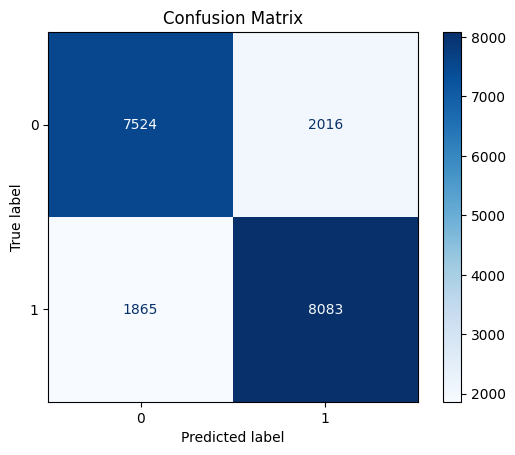

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()


**Interpreting the ROC-AUC Plot**
The ROC curve plots the True Positive Rate (TPR) vs. False Positive Rate (FPR).

A higher AUC (Area Under the Curve) means a better-performing model.

1. AUC ≈ 1.0 → Perfect classification

2. AUC ≈ 0.5 → Model is performing randomly (no predictive power)

3. AUC < 0.5 → Model is worse than random guessing

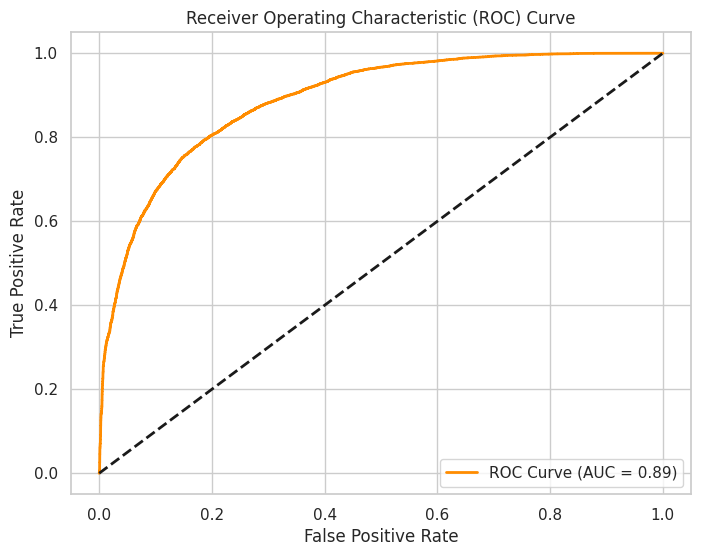

In [180]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Get predicted probabilities for class 1
y_prob = pipe.predict_proba(X_test)[:, 1]

# Compute ROC curve and AUC score
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure(figsize=(8,6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)  # Random guessing line

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


In [181]:
from sklearn.ensemble import RandomForestClassifier # Import RandomForestClassifier from the correct submodule
from sklearn.pipeline import Pipeline

###Model 2: Random Forest Classifier
![rf](https://miro.medium.com/v2/resize:fit:1400/1*hmtbIgxoflflJqMJ_UHwXw.jpeg)

***Random Forest*** is primarily a classification and regression algorithm. When used for regression tasks, it predicts continuous values by **averaging the outputs of multiple decision trees**.

Why does Random Forest give accurate results?
1. Ensemble Learning – It combines multiple decision trees to reduce overfitting.

2. Averaging Effect – In regression, the final output is the average of predictions, which smooths errors.

3. Feature Randomness – Each tree gets a random subset of features, making the model more robust.

In [182]:
pipe2=Pipeline(steps=[
    ('step1',trf),
    ('step2',RandomForestClassifier())
])

In [ ]:
pipe2.fit(X_train,y_train)

/usr/local/lib/python3.11/dist-packages/sklearn/compose/_column_transformer.py:1667: FutureWarning: 
The format of the columns of the 'remainder' transformer in ColumnTransformer.transformers_ will change in version 1.7 to match the format of the other transformers.
At the moment the remainder columns are stored as indices (of type int). With the same ColumnTransformer configuration, in the future they will be stored as column names (of type str).
To use the new behavior now and suppress this warning, use ColumnTransformer(force_int_remainder_cols=False).

  warnings.warn(


Pipeline(steps=[('step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('trf',
                                                  OneHotEncoder(drop='first',
                                                                sparse_output=False),
                                                  ['batting_team',
                                                   'bowling_team', 'city'])])),
                ('step2', RandomForestClassifier())])

In [ ]:
y_pred=pipe2.predict(X_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.9984605911330049

#### Evaluation Metrics of Random Forest:

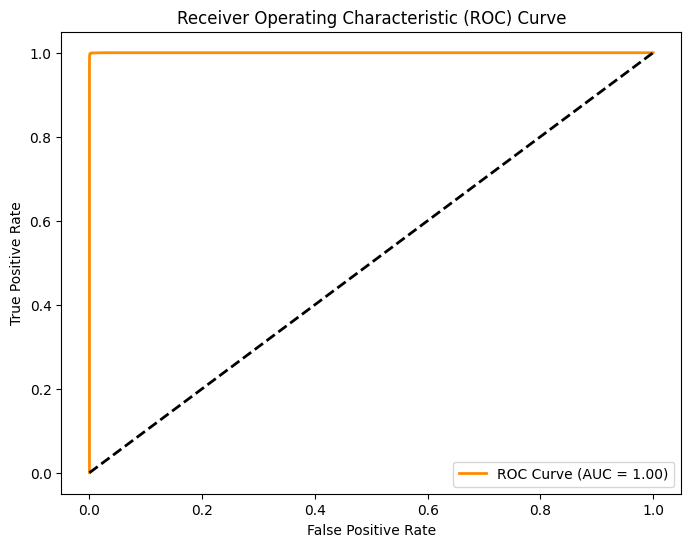

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Get predicted probabilities for class 1
y_prob = pipe2.predict_proba(X_test)[:, 1]

# Compute ROC curve and AUC score
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure(figsize=(8,6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)  # Random guessing line

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


###Model 3: Training Ensemble : XGBoost + Random Forest

In [183]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc

# Sample dataset (Replace with your dataset)
from sklearn.datasets import make_classification
X, y = make_classification(n_samples=1000, n_features=20, random_state=42)

# Split dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [184]:
# Define models
rf = RandomForestClassifier(n_estimators=100, random_state=42)
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)

# Voting Classifier (Soft Voting for probabilities)
ensemble = VotingClassifier(estimators=[('rf', rf), ('xgb', xgb)], voting='soft')

# Train ensemble
ensemble.fit(X_train, y_train)

# Predict
y_pred = ensemble.predict(X_test)
y_prob = ensemble.predict_proba(X_test)[:, 1]  # Probabilities for ROC


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [06:28:30] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


In [185]:
acc = accuracy_score(y_test, y_pred)
print(f"Ensemble Model Accuracy: {acc:.4f}")
print("\nClassification Report:\n", classification_report(y_test, y_pred))


Ensemble Model Accuracy: 0.9100

Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.97      0.91        93
           1       0.97      0.86      0.91       107

    accuracy                           0.91       200
   macro avg       0.91      0.91      0.91       200
weighted avg       0.92      0.91      0.91       200



#### Evaluation Metrics of Ensemble Method:

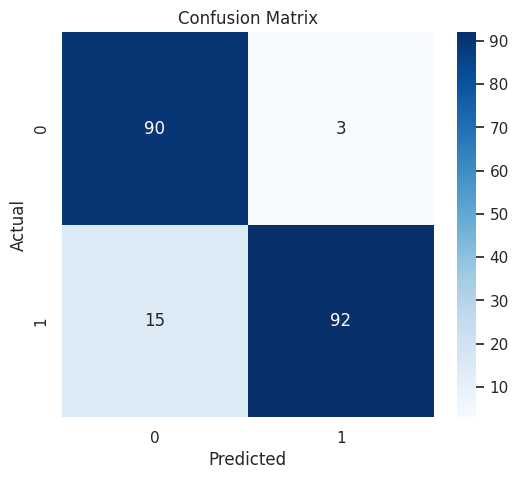

In [186]:
plt.figure(figsize=(6,5))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()


### Model 4: Neural Network:
(more specifically - a Multi Layer Perceptron)

In [189]:
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score

# Define and Train MLP Neural Network with 3 Hidden Layers
mlp = MLPClassifier(hidden_layer_sizes=(128, 64, 32), activation='relu', solver='adam',
                    max_iter=1000, random_state=42)

# Train the model
mlp.fit(X_train, y_train)

# Predict
y_pred_nn = mlp.predict(X_test)
y_prob_nn = mlp.predict_proba(X_test)[:, 1]

# Accuracy
acc_nn = accuracy_score(y_test, y_pred_nn)
print(f"Neural Network Accuracy: {acc_nn:.4f}")

# Display Model Pipeline
print("\nMLP Model Structure:")
print(f"Input Layer: {X_train.shape[1]} neurons")
print(f"Hidden Layer 1: 128 neurons (ReLU)")
print(f"Hidden Layer 2: 64 neurons (ReLU)")
print(f"Hidden Layer 3: 32 neurons (ReLU)")
print(f"Output Layer: 1 neuron (Sigmoid for binary classification- Win or Lose)")


Neural Network Accuracy: 0.8450

MLP Model Structure:
Input Layer: 20 neurons
Hidden Layer 1: 128 neurons (ReLU)
Hidden Layer 2: 64 neurons (ReLU)
Hidden Layer 3: 32 neurons (ReLU)
Output Layer: 1 neuron (Sigmoid for binary classification- Win or Lose)


In [190]:
from graphviz import Digraph

def draw_mlp():
    dot = Digraph()

    # Input Layer
    for i in range(1, 21):  # 20 input neurons
        dot.node(f'I{i}', f'Input {i}', shape='circle', style='filled', fillcolor='lightgray')

    # Hidden Layer 1
    for i in range(1, 129):  # 128 neurons
        dot.node(f'H1-{i}', f'H1-{i}', shape='circle', style='filled', fillcolor='lightblue')
        for j in range(1, 21):
            dot.edge(f'I{j}', f'H1-{i}')

    # Hidden Layer 2
    for i in range(1, 65):  # 64 neurons
        dot.node(f'H2-{i}', f'H2-{i}', shape='circle', style='filled', fillcolor='lightgreen')
        for j in range(1, 129):
            dot.edge(f'H1-{j}', f'H2-{i}')

    # Hidden Layer 3
    for i in range(1, 33):  # 32 neurons
        dot.node(f'H3-{i}', f'H3-{i}', shape='circle', style='filled', fillcolor='orange')
        for j in range(1, 65):
            dot.edge(f'H2-{j}', f'H3-{i}')

    # Output Layer
    dot.node('O', 'Output', shape='circle', style='filled', fillcolor='red')
    for j in range(1, 33):
        dot.edge(f'H3-{j}', 'O')

    # Save and render
    dot.render('mlp_architecture', format='png', cleanup=False)
    print("MLP Architecture diagram saved as mlp_architecture.png")

# Generate the MLP Diagram
draw_mlp()

MLP Architecture diagram saved as mlp_architecture.png


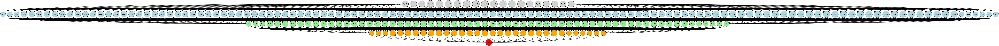

In [191]:
from IPython.display import display
from PIL import Image

# Load and display the image
img = Image.open("mlp_architecture.png")  # Replace with your file name
display(img)


#### Evaluation Metrics:

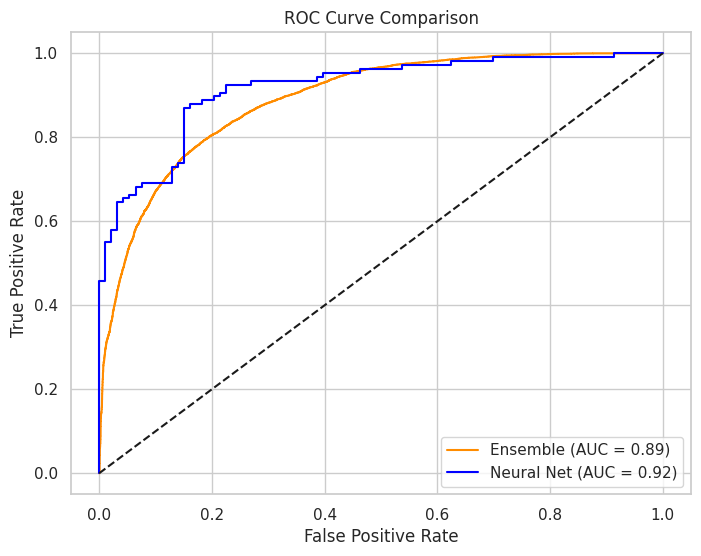

In [192]:
fpr_nn, tpr_nn, _ = roc_curve(y_test, y_prob_nn)
roc_auc_nn = auc(fpr_nn, tpr_nn)

plt.figure(figsize=(8,6))
plt.plot(fpr, tpr, label=f'Ensemble (AUC = {roc_auc:.2f})', color='darkorange')
plt.plot(fpr_nn, tpr_nn, label=f'Neural Net (AUC = {roc_auc_nn:.2f})', color='blue')
plt.plot([0, 1], [0, 1], 'k--')  # Random guessing line
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison')
plt.legend(loc='lower right')
plt.show()


### **Conclusion and Our Approach**  

In our analysis, we intentionally avoided creating an overly perfect model. A model that consistently predicts extreme probabilities—such as **Team A: 99% vs. Team B: 1%**—could indicate overfitting and excessive bias, making it unreliable in real-world scenarios.  

Instead, we aimed for a more balanced and **moderate prediction approach**, where the probabilities reflect realistic uncertainties in match outcomes. Given the nature of our predictors, the model provides reasonable probability distributions rather than definitive, one-sided predictions.  

With this in mind, **Logistic Regression** was our model of choice for deployment on **Streamlit**. Its simplicity, interpretability, and ability to maintain moderate probability estimates make it a suitable candidate for predicting match outcomes without being excessively confident in its predictions.  

This ensures that users receive insightful yet **realistic** probability distributions, fostering a more engaging and analytically sound experience. 🎯

## Deployment:

[Our Deployed Streamlit App:](https://creativeag-iplwin-pred.streamlit.app/)

Exporting model and Creating a streamlit app:

In [ ]:
teams

['Royal Challengers Bangalore',
 'Kings XI Punjab',
 'Mumbai Indians',
 'Kolkata Knight Riders',
 'Rajasthan Royals',
 'Chennai Super Kings',
 'Sunrisers Hyderabad',
 'Delhi Capitals',
 'Lucknow Super Giants',
 'Gujarat Titans']

In [ ]:
delivery_df['city'].unique()

array(['Bangalore', 'Chandigarh', 'Delhi', 'Mumbai', 'Kolkata', 'Jaipur',
       'Hyderabad', 'Chennai', 'Cape Town', 'Port Elizabeth', 'Durban',
       'Centurion', 'East London', 'Johannesburg', 'Kimberley',
       'Bloemfontein', 'Ahmedabad', 'Cuttack', 'Nagpur', 'Dharamsala',
       'Visakhapatnam', 'Pune', 'Raipur', 'Ranchi', 'Abu Dhabi', nan,
       'Bengaluru', 'Indore', 'Dubai', 'Sharjah', 'Navi Mumbai',
       'Lucknow', 'Guwahati'], dtype=object)

Exported the model as required, proceed to streamlit app to witness live prediction.

In [ ]:
import pickle
pickle.dump(pipe,open('pipe.pkl','wb'))

#Thank You!